# 3 | Data Collection and Preprocessing

## 3.1 | Data Sources

In [ ]:
import pandas as pd
import numpy as np

from google.colab import files

uploaded = files.upload()

Saving data_alarm_machine1_V2.csv to data_alarm_machine1_V2.csv
Saving data_alarm_machine2_V2.csv to data_alarm_machine2_V2.csv
Saving data_alarm_machine3_V2.csv to data_alarm_machine3_V2.csv
Saving data_df_recipe_performance_machine1_V2.csv to data_df_recipe_performance_machine1_V2.csv
Saving data_df_recipe_performance_machine2_V2.csv to data_df_recipe_performance_machine2_V2.csv
Saving data_df_recipe_performance_machine3_V2.csv to data_df_recipe_performance_machine3_V2.csv


In [ ]:
# Alarms
alarm_paths = [
    "data_alarm_machine1_V2.csv",
    "data_alarm_machine2_V2.csv",
    "data_alarm_machine3_V2.csv"
]

# Performance
performance_paths = [
    "data_df_recipe_performance_machine1_V2.csv",
    "data_df_recipe_performance_machine2_V2.csv",
    "data_df_recipe_performance_machine3_V2.csv"
]

# Tag Machines
alarm_dfs = [pd.read_csv(p) for p in alarm_paths]
perf_dfs = [pd.read_csv(p) for p in performance_paths]

for i, df in enumerate(alarm_dfs):
    df['machine'] = f"machine{i+1}"

for i, df in enumerate(perf_dfs):
    df['machine'] = f"machine{i+1}"

df_alarm_all = pd.concat(alarm_dfs, ignore_index=True)
df_perf_all = pd.concat(perf_dfs, ignore_index=True)

# UTC format
df_alarm_all['createdAt'] = pd.to_datetime(df_alarm_all['createdAt'], utc=True, errors='coerce')
df_perf_all['timestamp'] = pd.to_datetime(df_perf_all['timestamp'], utc=True, errors='coerce')

# Preview

print("Alarms:")
display(df_alarm_all)

print("Performance:")
display(df_perf_all)

print("Alarms headers:", df_alarm_all.columns.tolist())
print("Performance headers:", df_perf_all.columns.tolist())

Alarms:


,createdAt,valveNumber,textDetail,alarmFaultId,predictingAlgoId,alarmActivated,criticityId,machine
0,2024-01-13 11:00:00+00:00,9,Bottle burst,368,61,1,2,machine1
1,2024-01-13 13:00:00+00:00,9,Bottle burst,368,61,1,2,machine1
2,2024-01-19 11:00:00+00:00,9,Bottle burst,368,61,1,2,machine1
3,2024-01-19 13:00:00+00:00,9,Bottle burst,368,61,1,2,machine1
4,2024-01-30 11:00:00+00:00,11,Bottle burst,368,61,1,2,machine1
...,...,...,...,...,...,...,...,...
2838,2024-10-25 08:00:00+00:00,111,back to normal,368,61,0,1,machine3
2839,2024-11-12 21:00:00+00:00,42,Bottle burst,368,61,1,2,machine3
2840,2024-11-13 01:00:00+00:00,42,back to normal,368,61,0,1,machine3
2841,2024-11-29 19:00:00+00:00,135,Bottle burst,368,61,1,2,machine3


Performance:


,timestamp,availability,operationalavailability,efficiency,oee,qualityrate,runningtime,mtbf,mttr,rejectionrate,...,equipmentdowntime,effectivetime,designspeed,avgprocessspeed,maxprocessspeed,minprocessspeed,rank,recipe,MachineSpeed_max,machine
0,2024-01-29 09:00:00+00:00,95.276873,65.000000,77.157708,64.598148,100.0,2340,2340.0,116.0,0.0,...,674,3014,15.000000,9.68972,15.01000,2.92667,1,recipe_2,90,machine1
1,2024-01-29 10:00:00+00:00,80.035492,50.111111,59.257812,50.566667,100.0,1804,902.0,225.0,0.0,...,1268,3072,15.000000,7.58500,15.02333,1.46000,1,recipe_2,90,machine1
2,2024-01-29 11:00:00+00:00,100.000000,41.777778,49.653493,41.529630,100.0,1504,1504.0,0.0,0.0,...,1507,3011,15.000000,6.22945,14.96000,0.53000,1,recipe_2,90,machine1
3,2024-01-29 12:00:00+00:00,0.000000,0.000000,0.000000,0.000000,100.0,0,0.0,0.0,0.0,...,0,0,15.000000,0.00000,0.00000,0.00000,1,recipe_2,90,machine1
4,2024-01-29 13:00:00+00:00,0.000000,0.000000,0.000000,0.000000,100.0,0,0.0,0.0,0.0,...,0,0,15.000000,0.00000,0.00000,0.00000,1,recipe_2,75,machine1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18579,2025-03-31 19:00:00+00:00,100.000000,49.638889,38.890000,38.890000,100.0,1787,1787.0,0.0,0.0,...,1813,3600,8.333333,3.24083,6.39667,0.08000,1,recipe_4,38,machine3
18580,2025-03-31 20:00:00+00:00,100.000000,75.444444,58.570000,58.570000,100.0,2716,2716.0,0.0,0.0,...,884,3600,8.333333,4.88083,6.39333,0.19667,1,recipe_4,38,machine3
18581,2025-03-31 21:00:00+00:00,100.000000,48.250000,37.330000,37.330000,100.0,1737,1737.0,0.0,0.0,...,1863,3600,8.333333,3.11083,6.39667,2.03667,1,recipe_4,38,machine3
18582,2025-03-31 22:00:00+00:00,100.000000,64.916667,50.496667,50.496667,100.0,2337,2337.0,0.0,0.0,...,1263,3600,8.333333,4.20806,6.40000,1.10000,1,recipe_4,38,machine3


Alarms headers: ['createdAt', 'valveNumber', 'textDetail', 'alarmFaultId', 'predictingAlgoId', 'alarmActivated', 'criticityId', 'machine']
Performance headers: ['timestamp', 'availability', 'operationalavailability', 'efficiency', 'oee', 'qualityrate', 'runningtime', 'mtbf', 'mttr', 'rejectionrate', 'processed', 'produce', 'workingtime', 'netoperatingtime', 'effectivetimeexpectedproduction', 'internaldowntime', 'internalstops', 'nodatatime', 'externaltime', 'planneddowntime', 'productiontimeexpectedproduction', 'induceddowntime', 'reactiontime', 'equipmentdowntime', 'effectivetime', 'designspeed', 'avgprocessspeed', 'maxprocessspeed', 'minprocessspeed', 'rank', 'recipe', 'MachineSpeed_max', 'machine']


In [ ]:
# Check shapes
print("=== Alarm Files Shapes ===")
for i, path in enumerate(alarm_paths, start=1):
    df = pd.read_csv(path)
    print(f"Machine {i}: {path} → {df.shape}")

print("\n=== Performance Files Shapes ===")
for i, path in enumerate(performance_paths, start=1):
    df = pd.read_csv(path)
    print(f"Machine {i}: {path} → {df.shape}")

=== Alarm Files Shapes ===
Machine 1: data_alarm_machine1_V2.csv → (1529, 7)
Machine 2: data_alarm_machine2_V2.csv → (1212, 7)
Machine 3: data_alarm_machine3_V2.csv → (102, 7)

=== Performance Files Shapes ===
Machine 1: data_df_recipe_performance_machine1_V2.csv → (7769, 32)
Machine 2: data_df_recipe_performance_machine2_V2.csv → (5292, 32)
Machine 3: data_df_recipe_performance_machine3_V2.csv → (5523, 32)


## 3.2 | Data Cleaning & Normalization

### Alarm Dataset Overview (Global)

In [ ]:
# General info
print("Basic Overview of df_alarm_all")
print("-" * 50)
print(f"Shape: {df_alarm_all.shape}")
print(f"Columns: {df_alarm_all.columns.tolist()}\n")

# Duplicated rows
print("Duplicated rows:", df_alarm_all.duplicated().sum())

# Null values
print("\nNull Values per Column:")
display(df_alarm_all.isnull().sum())

# Data types and non-nulls
print("\nData Types and Non-Null Counts:")
display(df_alarm_all.info())

# Summary statistics
print("\nSummary statistics (numeric):")
display(df_alarm_all.describe(include='number').T)

# Check unique values in key fields
print("\nUnique values in important categorical fields:")
for col in ['alarmActivated', 'alarmFaultId', 'valveNumber', 'textDetail', 'machine', 'criticityId']:
    print(f"{col}: {df_alarm_all[col].nunique()} unique values")

# Sanity check for 'alarmActivated'
print("\nUnique values in 'alarmActivated':", df_alarm_all['alarmActivated'].unique())

# Check for future or strange dates
print("\nCreatedAt date range:")
print(f"Min: {df_alarm_all['createdAt'].min()}, Max: {df_alarm_all['createdAt'].max()}")

Basic Overview of df_alarm_all
--------------------------------------------------
Shape: (2843, 8)
Columns: ['createdAt', 'valveNumber', 'textDetail', 'alarmFaultId', 'predictingAlgoId', 'alarmActivated', 'criticityId', 'machine']

Duplicated rows: 1

Null Values per Column:


,0
createdAt,0
valveNumber,0
textDetail,0
alarmFaultId,0
predictingAlgoId,0
alarmActivated,0
criticityId,0
machine,0



Data Types and Non-Null Counts:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2843 entries, 0 to 2842
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   createdAt         2843 non-null   datetime64[ns, UTC]
 1   valveNumber       2843 non-null   int64              
 2   textDetail        2843 non-null   object             
 3   alarmFaultId      2843 non-null   int64              
 4   predictingAlgoId  2843 non-null   int64              
 5   alarmActivated    2843 non-null   int64              
 6   criticityId       2843 non-null   int64              
 7   machine           2843 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(5), object(2)
memory usage: 177.8+ KB


None


Summary statistics (numeric):


,count,mean,std,min,25%,50%,75%,max
valveNumber,2843.0,70.738656,41.005968,1.0,35.0,75.0,106.0,150.0
alarmFaultId,2843.0,380.596201,16.045090,313.0,368.0,394.0,394.0,394.0
predictingAlgoId,2843.0,59.840661,1.018965,58.0,59.0,59.0,61.0,61.0
alarmActivated,2843.0,0.392543,0.488402,0.0,0.0,0.0,1.0,1.0
criticityId,2843.0,1.334506,0.506428,1.0,1.0,1.0,2.0,3.0



Unique values in important categorical fields:
alarmActivated: 2 unique values
alarmFaultId: 5 unique values
valveNumber: 141 unique values
textDetail: 12 unique values
machine: 3 unique values
criticityId: 3 unique values

Unique values in 'alarmActivated': [1 0]

CreatedAt date range:
Min: 2024-01-02 13:00:00+00:00, Max: 2025-03-30 22:00:00+00:00


### Alarm Dataset Overview (by Machine)

In [ ]:
machines = df_alarm_all["machine"].unique()

for m in machines:
    df_m = df_alarm_all[df_alarm_all["machine"] == m]
    print(f"\nMachine: {m}")
    print("-" * 50)
    print(f"Shape: {df_m.shape}")
    print(f"Columns: {df_m.columns.tolist()}\n")

    # Duplicated rows
    print("Duplicated rows:", df_m.duplicated().sum())

    # Null values
    print("\nNull Values per Column:")
    display(df_m.isnull().sum())

    # Data types and non-nulls
    print("\nData Types and Non-Null Counts:")
    display(df_m.info())

    # Summary statistics
    print("\nSummary statistics (numeric):")
    display(df_m.describe(include='number').T)

    # Unique values
    print("\nUnique values in important categorical fields:")
    for col in ['alarmActivated', 'alarmFaultId', 'valveNumber', 'textDetail', 'criticityId']:
        print(f"{col}: {df_m[col].nunique()} unique values")

    # 'alarmActivated' values
    print("\nUnique values in 'alarmActivated':", df_m['alarmActivated'].unique())

    # Date range
    print("\nCreatedAt date range:")
    print(f"Min: {df_m['createdAt'].min()}, Max: {df_m['createdAt'].max()}")


Machine: machine1
--------------------------------------------------
Shape: (1529, 8)
Columns: ['createdAt', 'valveNumber', 'textDetail', 'alarmFaultId', 'predictingAlgoId', 'alarmActivated', 'criticityId', 'machine']

Duplicated rows: 1

Null Values per Column:


,0
createdAt,0
valveNumber,0
textDetail,0
alarmFaultId,0
predictingAlgoId,0
alarmActivated,0
criticityId,0
machine,0



Data Types and Non-Null Counts:
<class 'pandas.core.frame.DataFrame'>
Index: 1529 entries, 0 to 1528
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   createdAt         1529 non-null   datetime64[ns, UTC]
 1   valveNumber       1529 non-null   int64              
 2   textDetail        1529 non-null   object             
 3   alarmFaultId      1529 non-null   int64              
 4   predictingAlgoId  1529 non-null   int64              
 5   alarmActivated    1529 non-null   int64              
 6   criticityId       1529 non-null   int64              
 7   machine           1529 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(5), object(2)
memory usage: 107.5+ KB


None


Summary statistics (numeric):


,count,mean,std,min,25%,50%,75%,max
valveNumber,1529.0,70.285808,39.304874,1.0,39.0,75.0,104.0,143.0
alarmFaultId,1529.0,376.103990,15.293817,313.0,368.0,368.0,394.0,394.0
predictingAlgoId,1529.0,60.233486,0.980719,58.0,59.0,61.0,61.0,61.0
alarmActivated,1529.0,0.523872,0.499593,0.0,0.0,1.0,1.0,1.0
criticityId,1529.0,1.489863,0.524338,1.0,1.0,1.0,2.0,3.0



Unique values in important categorical fields:
alarmActivated: 2 unique values
alarmFaultId: 5 unique values
valveNumber: 133 unique values
textDetail: 12 unique values
criticityId: 3 unique values

Unique values in 'alarmActivated': [1 0]

CreatedAt date range:
Min: 2024-01-13 11:00:00+00:00, Max: 2025-03-26 11:00:00+00:00

Machine: machine2
--------------------------------------------------
Shape: (1212, 8)
Columns: ['createdAt', 'valveNumber', 'textDetail', 'alarmFaultId', 'predictingAlgoId', 'alarmActivated', 'criticityId', 'machine']

Duplicated rows: 0

Null Values per Column:


,0
createdAt,0
valveNumber,0
textDetail,0
alarmFaultId,0
predictingAlgoId,0
alarmActivated,0
criticityId,0
machine,0



Data Types and Non-Null Counts:
<class 'pandas.core.frame.DataFrame'>
Index: 1212 entries, 1529 to 2740
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   createdAt         1212 non-null   datetime64[ns, UTC]
 1   valveNumber       1212 non-null   int64              
 2   textDetail        1212 non-null   object             
 3   alarmFaultId      1212 non-null   int64              
 4   predictingAlgoId  1212 non-null   int64              
 5   alarmActivated    1212 non-null   int64              
 6   criticityId       1212 non-null   int64              
 7   machine           1212 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(5), object(2)
memory usage: 85.2+ KB


None


Summary statistics (numeric):


,count,mean,std,min,25%,50%,75%,max
valveNumber,1212.0,70.561881,42.793383,2.0,32.0,72.0,110.0,144.0
alarmFaultId,1212.0,387.323432,14.997088,313.0,394.0,394.0,394.0,394.0
predictingAlgoId,1212.0,59.247525,0.750306,58.0,59.0,59.0,59.0,61.0
alarmActivated,1212.0,0.213696,0.410084,0.0,0.0,0.0,0.0,1.0
criticityId,1212.0,1.120462,0.392343,1.0,1.0,1.0,1.0,3.0



Unique values in important categorical fields:
alarmActivated: 2 unique values
alarmFaultId: 5 unique values
valveNumber: 77 unique values
textDetail: 11 unique values
criticityId: 3 unique values

Unique values in 'alarmActivated': [1 0]

CreatedAt date range:
Min: 2024-01-03 19:00:00+00:00, Max: 2025-03-30 22:00:00+00:00

Machine: machine3
--------------------------------------------------
Shape: (102, 8)
Columns: ['createdAt', 'valveNumber', 'textDetail', 'alarmFaultId', 'predictingAlgoId', 'alarmActivated', 'criticityId', 'machine']

Duplicated rows: 0

Null Values per Column:


,0
createdAt,0
valveNumber,0
textDetail,0
alarmFaultId,0
predictingAlgoId,0
alarmActivated,0
criticityId,0
machine,0



Data Types and Non-Null Counts:
<class 'pandas.core.frame.DataFrame'>
Index: 102 entries, 2741 to 2842
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   createdAt         102 non-null    datetime64[ns, UTC]
 1   valveNumber       102 non-null    int64              
 2   textDetail        102 non-null    object             
 3   alarmFaultId      102 non-null    int64              
 4   predictingAlgoId  102 non-null    int64              
 5   alarmActivated    102 non-null    int64              
 6   criticityId       102 non-null    int64              
 7   machine           102 non-null    object             
dtypes: datetime64[ns, UTC](1), int64(5), object(2)
memory usage: 7.2+ KB


None


Summary statistics (numeric):


,count,mean,std,min,25%,50%,75%,max
valveNumber,102.0,79.627451,43.616674,3.0,39.0,84.0,110.25,150.0
alarmFaultId,102.0,368.000000,0.000000,368.0,368.0,368.0,368.00,368.0
predictingAlgoId,102.0,61.000000,0.000000,61.0,61.0,61.0,61.00,61.0
alarmActivated,102.0,0.549020,0.500049,0.0,0.0,1.0,1.00,1.0
criticityId,102.0,1.549020,0.500049,1.0,1.0,2.0,2.00,2.0



Unique values in important categorical fields:
alarmActivated: 2 unique values
alarmFaultId: 1 unique values
valveNumber: 31 unique values
textDetail: 2 unique values
criticityId: 2 unique values

Unique values in 'alarmActivated': [1 0]

CreatedAt date range:
Min: 2024-01-02 13:00:00+00:00, Max: 2024-11-29 23:00:00+00:00


In [ ]:
# Remove duplicates identified in Machine 1
df_alarm_all = df_alarm_all.drop_duplicates().copy()  # <--- force a fresh copy here

# Reorder by time
df_alarm_all = df_alarm_all.sort_values(by='createdAt').reset_index(drop=True)

### Alarm Dataset Preprocessing and Structuring

#### Deduplicate Recovery Events

> Recovery logs, are sometimes duplicated across multiple timestamps or valves for the same event. By isolating alarmActivated == 0 rows and deduplicating them based on key identifiers (machine, valve, alarm ID, and timestamp), we obtain a cleaner, more structured dataset.

In [ ]:
# Create a working copy of the alarm dataframe
df_alarm_clean = df_alarm_all.copy()

# Extract recovery events based on alarmActivated == 0
recovery_events = df_alarm_clean[df_alarm_clean['alarmActivated'] == 0].copy()

# Deduplicate recovery events by grouping on key identifiers
recovery_dedup = (
    recovery_events
    .sort_values(by='createdAt')
    .drop_duplicates(subset=['machine', 'valveNumber', 'alarmFaultId', 'createdAt'], keep='first')
)

print(f"Recovery events before deduplication: {len(recovery_events)}")
print(f"Recovery events after deduplication: {len(recovery_dedup)}")

# Extract failure events (alarmActivated == 1)
failure_events = df_alarm_clean[df_alarm_clean['alarmActivated'] == 1].copy()

# Combine deduplicated recoveries with failures
df_alarm_grouped = (
    pd.concat([failure_events, recovery_dedup], ignore_index=True)
    .sort_values(by='createdAt')
    .reset_index(drop=True)
)

print(f"Final grouped alarms dataframe shape: {df_alarm_grouped.shape}")
display(df_alarm_grouped.head(10))

Recovery events before deduplication: 1727
Recovery events after deduplication: 637
Final grouped alarms dataframe shape: (1752, 8)


,createdAt,valveNumber,textDetail,alarmFaultId,predictingAlgoId,alarmActivated,criticityId,machine
0,2024-01-02 13:00:00+00:00,82,Bottle burst,368,61,1,2,machine3
1,2024-01-02 15:00:00+00:00,82,Bottle burst,368,61,1,2,machine3
2,2024-01-02 19:00:00+00:00,134,Bottle burst,368,61,1,2,machine3
3,2024-01-03 19:00:00+00:00,136,Bottle burst,368,61,1,2,machine2
4,2024-01-03 23:00:00+00:00,136,back to normal,368,61,0,1,machine2
5,2024-01-05 21:00:00+00:00,23,Bottle burst,368,61,1,2,machine3
6,2024-01-06 01:00:00+00:00,23,back to normal,368,61,0,1,machine3
7,2024-01-07 07:00:00+00:00,37,Param_1 precision decreasing,337,58,1,3,machine2
8,2024-01-08 17:00:00+00:00,108,Bottle burst,368,61,1,2,machine3
9,2024-01-08 21:00:00+00:00,108,back to normal,368,61,0,1,machine3


#### Pairing Failure - Recovery Events

> This approach enhances the raw alarm log by structuring it into failure-recovery cycles. We generate binary flags for key alarm types, assign unique cycle IDs to each failure-recovery pair, and compute the duration of each cycle.

In [ ]:
# Step 1: Add binary columns for each alarm ID and activation type
target_alarm_ids = [368, 394, 313, 329, 337]

for alarm_id in target_alarm_ids:
    df_alarm_grouped[f"{alarm_id}_failure"] = (
        (df_alarm_grouped['alarmFaultId'] == alarm_id) &
        (df_alarm_grouped['alarmActivated'] == 1)
    ).astype(int)

    df_alarm_grouped[f"{alarm_id}_recovery"] = (
        (df_alarm_grouped['alarmFaultId'] == alarm_id) &
        (df_alarm_grouped['alarmActivated'] == 0)
    ).astype(int)

# Step 2: Assign cycleID and log_duration (stored in recovery row)
df_alarm_grouped['createdAt'] = pd.to_datetime(df_alarm_grouped['createdAt'], utc=True)
df_alarm_grouped = df_alarm_grouped.sort_values(by='createdAt').reset_index(drop=True)

open_cycles = {}
cycleID_counter = 1
cycleIDs = [None] * len(df_alarm_grouped)
log_durations = [np.nan] * len(df_alarm_grouped)

for idx, row in df_alarm_grouped.iterrows():
    key = (row['machine'], row['valveNumber'], row['alarmFaultId'])
    current_time = row['createdAt']

    if row['alarmActivated'] == 1:  # failure
        if key not in open_cycles:
            open_cycles[key] = {
                'start_time': current_time,
                'cycleID': cycleID_counter
            }
            cycleIDs[idx] = cycleID_counter
            cycleID_counter += 1
        else:
            cycleIDs[idx] = open_cycles[key]['cycleID']

    elif row['alarmActivated'] == 0:  # recovery
        if key in open_cycles:
            cid = open_cycles[key]['cycleID']
            start_time = open_cycles[key]['start_time']
            duration = (current_time - start_time).total_seconds() / 3600

            cycleIDs[idx] = cid
            log_durations[idx] = duration

            del open_cycles[key]
        else:
            cycleIDs[idx] = None

# Step 3: Add new columns to the DataFrame
df_alarm_grouped['cycleID'] = pd.Series(cycleIDs, dtype="Int64")
df_alarm_grouped['log_duration'] = pd.to_numeric(log_durations, errors='coerce')

# Step 4: Drop textDetail
df_alarm_grouped.drop(columns=['textDetail'], inplace=True)

print("Binary flags, cycleID, and log_duration columns added.")
print(f"Final grouped alarms dataframe shape: {df_alarm_grouped.shape}")

display(df_alarm_grouped.head(10))


Binary flags, cycleID, and log_duration columns added.
Final grouped alarms dataframe shape: (1752, 19)


,createdAt,valveNumber,alarmFaultId,predictingAlgoId,alarmActivated,criticityId,machine,368_failure,368_recovery,394_failure,394_recovery,313_failure,313_recovery,329_failure,329_recovery,337_failure,337_recovery,cycleID,log_duration
0,2024-01-02 13:00:00+00:00,82,368,61,1,2,machine3,1,0,0,0,0,0,0,0,0,0,1,NaN
1,2024-01-02 15:00:00+00:00,82,368,61,1,2,machine3,1,0,0,0,0,0,0,0,0,0,1,NaN
2,2024-01-02 19:00:00+00:00,134,368,61,1,2,machine3,1,0,0,0,0,0,0,0,0,0,2,NaN
3,2024-01-03 19:00:00+00:00,136,368,61,1,2,machine2,1,0,0,0,0,0,0,0,0,0,3,NaN
4,2024-01-03 23:00:00+00:00,136,368,61,0,1,machine2,0,1,0,0,0,0,0,0,0,0,3,4.0
5,2024-01-05 21:00:00+00:00,23,368,61,1,2,machine3,1,0,0,0,0,0,0,0,0,0,4,NaN
6,2024-01-06 01:00:00+00:00,23,368,61,0,1,machine3,0,1,0,0,0,0,0,0,0,0,4,4.0
7,2024-01-07 07:00:00+00:00,37,337,58,1,3,machine2,0,0,0,0,0,0,0,0,1,0,5,NaN
8,2024-01-08 17:00:00+00:00,108,368,61,1,2,machine3,1,0,0,0,0,0,0,0,0,0,6,NaN
9,2024-01-08 21:00:00+00:00,108,368,61,0,1,machine3,0,1,0,0,0,0,0,0,0,0,6,4.0


In [ ]:
# double check cycleID & log_duration is working as expected

display(df_alarm_grouped.loc[
    (df_alarm_grouped['machine'] == 'machine1') &
    (df_alarm_grouped['valveNumber'] == 82)
])

,createdAt,valveNumber,alarmFaultId,predictingAlgoId,alarmActivated,criticityId,machine,368_failure,368_recovery,394_failure,394_recovery,313_failure,313_recovery,329_failure,329_recovery,337_failure,337_recovery,cycleID,log_duration
149,2024-02-14 13:00:00+00:00,82,368,61,1,2,machine1,1,0,0,0,0,0,0,0,0,0,68,NaN
185,2024-02-22 13:00:00+00:00,82,368,61,0,1,machine1,0,1,0,0,0,0,0,0,0,0,68,192.0
473,2024-05-16 02:00:00+00:00,82,368,61,1,2,machine1,1,0,0,0,0,0,0,0,0,0,190,NaN
578,2024-05-16 04:00:00+00:00,82,368,61,1,2,machine1,1,0,0,0,0,0,0,0,0,0,190,NaN
894,2024-07-25 02:00:00+00:00,82,368,61,1,2,machine1,1,0,0,0,0,0,0,0,0,0,190,NaN
1106,2024-10-16 14:00:00+00:00,82,394,59,1,1,machine1,0,0,1,0,0,0,0,0,0,0,371,NaN
1116,2024-10-16 22:00:00+00:00,82,394,59,0,1,machine1,0,0,0,1,0,0,0,0,0,0,371,8.0
1303,2024-11-21 17:00:00+00:00,82,368,61,0,1,machine1,0,1,0,0,0,0,0,0,0,0,190,4551.0
1413,2024-11-30 03:00:00+00:00,82,368,61,1,2,machine1,1,0,0,0,0,0,0,0,0,0,451,NaN
1417,2024-11-30 07:00:00+00:00,82,368,61,0,1,machine1,0,1,0,0,0,0,0,0,0,0,451,4.0


## 3.3 | Broad Alarm Analysis

In [ ]:
# General description of the alarm dataset
data = df_alarm_grouped.copy()

print("Shape of the dataset:", data.shape)
print("\nData types:")
print(data.dtypes)

print("\nMissing values per column:")
print(data.isna().sum())

Shape of the dataset: (1752, 19)

Data types:
createdAt           datetime64[ns, UTC]
valveNumber                       int64
alarmFaultId                      int64
predictingAlgoId                  int64
alarmActivated                    int64
criticityId                       int64
machine                          object
368_failure                       int64
368_recovery                      int64
394_failure                       int64
394_recovery                      int64
313_failure                       int64
313_recovery                      int64
329_failure                       int64
329_recovery                      int64
337_failure                       int64
337_recovery                      int64
cycleID                           Int64
log_duration                    float64
dtype: object

Missing values per column:
createdAt              0
valveNumber            0
alarmFaultId           0
predictingAlgoId       0
alarmActivated         0
criticityId            0
ma

#### Failure-Recovery Cycle Identification and Validation

In [ ]:
def analyze_alarms_simple(df):
    # Ensure datetime is parsed
    df['createdAt'] = pd.to_datetime(df['createdAt'], utc=True)

    # Alarm (failure) count per machine
    alarm_count = (
        df[df['alarmActivated'] == 1]
        .groupby('machine')
        .size()
        .rename('Alarm Count')
    )

    # Recovery count per machine
    recovery_count = (
        df[df['alarmActivated'] == 0]
        .groupby('machine')
        .size()
        .rename('Recovery Count')
    )

    # Most frequent alarm type per machine (failures only)
    most_freq_alarm = (
        df[df['alarmActivated'] == 1]
        .groupby(['machine', 'alarmFaultId'])
        .size()
        .reset_index(name='count')
        .sort_values(['machine', 'count'], ascending=[True, False])
        .drop_duplicates('machine')
        .set_index('machine')['alarmFaultId']
        .rename('Most Frequent Alarm')
    )

    # Average duration per machine (from recovery rows)
    avg_duration = (
        df[df['log_duration'].notna()]
        .groupby('machine')['log_duration']
        .mean()
        .rename('Average alarm duration (h)')
    )

    # Combine all metrics
    summary = pd.concat([
        alarm_count,
        recovery_count,
        most_freq_alarm,
        avg_duration
    ], axis=1).fillna(0)

    # Ensure counts are integers
    for col in ['Alarm Count', 'Recovery Count']:
        summary[col] = summary[col].astype(int)

    return summary

# Usage:
summary_table = analyze_alarms_simple(df_alarm_grouped)
display(summary_table)


,Alarm Count,Recovery Count,Most Frequent Alarm,Average alarm duration (h)
machine,,,,
machine1,800,333,368,1457.596825
machine2,259,258,394,91.648221
machine3,56,46,368,58.130435


In [ ]:
# 1. Count all failure events (alarmActivated == 1)
failures = df_alarm_grouped[df_alarm_grouped['alarmActivated'] == 1].copy()
failures_count = failures.groupby('alarmFaultId').size().rename('Count_Activated_1')

# --- Flag repeated failures within the same cycle ---
# A repeated failure is one where multiple rows share the same cycleID
failures['repeated'] = failures.duplicated(subset=['cycleID', 'alarmFaultId'], keep='first').astype(int)

# Aggregate repeated failures by alarmFaultId
repeated_failures = (
    failures.groupby('alarmFaultId')['repeated']
    .sum()
    .rename('Repeated_Failures')
)

# 2. Count matched recovery events that have a valid log_duration
recoveries = df_alarm_grouped[
    (df_alarm_grouped['alarmActivated'] == 0) &
    (df_alarm_grouped['log_duration'].notna())
].copy()

matched_cycles = recoveries.groupby('alarmFaultId').size().rename('Matched_Cycles')

# 3. Combine metrics into summary table
summary = pd.concat([failures_count, repeated_failures, matched_cycles], axis=1).fillna(0)
summary['Matched_Cycles'] = summary['Matched_Cycles'].astype(int)
summary['Count_Activated_1'] = summary['Count_Activated_1'].astype(int)
summary['Repeated_Failures'] = summary['Repeated_Failures'].astype(int)

# 4. Calculate percentage of matched recoveries
summary['Pct_Matched'] = (summary['Matched_Cycles'] / summary['Count_Activated_1'] * 100).round(2)

# 5. Display
print("Summary of failure-recovery events by alarmFaultId:")
display(summary.sort_values('alarmFaultId'))



Summary of failure-recovery events by alarmFaultId:


,Count_Activated_1,Repeated_Failures,Matched_Cycles,Pct_Matched
alarmFaultId,,,,
313,13,1,12,92.31
329,5,0,5,100.00
337,30,3,27,90.00
368,854,494,360,42.15
394,213,2,210,98.59


In [ ]:
# Filter only failure events with valid criticityId
failure_events = df_alarm_grouped[
    (df_alarm_grouped['alarmActivated'] == 1) &
    (df_alarm_grouped['criticityId'].notna())
].copy()

# Create mapping table: how many times each alarm ID appears under each criticity
alarm_criticity_map = (
    failure_events
    .groupby(['alarmFaultId', 'criticityId'])
    .size()
    .unstack(fill_value=0)
    .rename_axis(None, axis=1)
    .reset_index()
)

# Optional: rename columns for clarity
alarm_criticity_map.columns.name = None
alarm_criticity_map = alarm_criticity_map.rename(columns={
    1: 'Informational',
    2: 'Critical',
    3: 'Warning'
})

print("AlarmFaultId to Criticity Mapping (based on failure events):")
display(alarm_criticity_map)


AlarmFaultId to Criticity Mapping (based on failure events):


,alarmFaultId,Informational,Critical,Warning
0,313,0,0,13
1,329,0,0,5
2,337,0,0,30
3,368,0,854,0
4,394,213,0,0


##### Insights for Section 4.1 (Machine 1)

In [ ]:
# 1. Filter failure events
failures = df_alarm_grouped[df_alarm_grouped['alarmActivated'] == 1].copy()

# Flag repeated failures within the same cycle (per machine + alarm + cycleID)
failures['repeated'] = failures.duplicated(subset=['machine', 'cycleID', 'alarmFaultId'], keep='first').astype(int)

# Count total and repeated failures grouped by machine and alarmFaultId
failures_count = failures.groupby(['machine', 'alarmFaultId']).size().rename('Count_Activated_1')
repeated_failures = failures.groupby(['machine', 'alarmFaultId'])['repeated'].sum().rename('Repeated_Failures')

# 2. Filter matched recoveries with valid log_duration
recoveries = df_alarm_grouped[
    (df_alarm_grouped['alarmActivated'] == 0) &
    (df_alarm_grouped['log_duration'].notna())
].copy()

# Count matched recovery cycles
matched_cycles = recoveries.groupby(['machine', 'alarmFaultId']).size().rename('Matched_Cycles')

# Compute average and median log duration
avg_duration = recoveries.groupby(['machine', 'alarmFaultId'])['log_duration'].mean().rename('Avg_Log_Duration_h')
median_duration = recoveries.groupby(['machine', 'alarmFaultId'])['log_duration'].median().rename('Median_Log_Duration_h')

# 3. Combine all metrics
summary = pd.concat([
    failures_count,
    repeated_failures,
    matched_cycles,
    avg_duration,
    median_duration
], axis=1).fillna(0).reset_index()

# Ensure integer types for counts
summary[['Count_Activated_1', 'Repeated_Failures', 'Matched_Cycles']] = summary[
    ['Count_Activated_1', 'Repeated_Failures', 'Matched_Cycles']
].astype(int)

# 4. Add match percentage
summary['Pct_Matched'] = (summary['Matched_Cycles'] / summary['Count_Activated_1'] * 100).round(2)

# 5. Display
print("Summary of failure-recovery cycles by machine and alarmFaultId:")
display(summary.sort_values(by=['machine', 'alarmFaultId']))



Summary of failure-recovery cycles by machine and alarmFaultId:


,machine,alarmFaultId,Count_Activated_1,Repeated_Failures,Matched_Cycles,Avg_Log_Duration_h,Median_Log_Duration_h,Pct_Matched
0,machine1,313,13,1,12,45.333333,32.0,92.31
1,machine1,329,2,0,2,64.000000,64.0,100.00
2,machine1,337,4,0,4,18.000000,16.0,100.00
3,machine1,368,710,484,226,2016.371681,331.0,31.83
4,machine1,394,71,0,71,38.014085,24.0,100.00
5,machine2,329,3,0,3,53.333333,24.0,100.00
6,machine2,337,26,3,23,84.478261,40.0,88.46
7,machine2,368,88,0,88,5.272727,4.0,100.00
8,machine2,394,142,2,139,148.345324,40.0,97.89
9,machine3,368,56,10,46,58.130435,4.0,82.14


In [ ]:
# Step 1: Melt alarm_criticity_map to long format
alarm_criticity_long = alarm_criticity_map.melt(
    id_vars='alarmFaultId',
    value_vars=['Informational', 'Critical', 'Warning'],
    var_name='criticity_label',
    value_name='count'
)


# Step 2: Keep only mappings with non-zero count
alarm_criticity_long = alarm_criticity_long[alarm_criticity_long['count'] > 0].copy()

# Step 3: Keep only dominant criticity for each alarmFaultId
alarm_dominant_criticity = (
    alarm_criticity_long
    .sort_values(['alarmFaultId', 'count'], ascending=[True, False])
    .drop_duplicates('alarmFaultId')
    [['alarmFaultId', 'criticity_label']]
)

# Step 4: Filter recovery events with valid log_duration
recovered_cycles = df_alarm_grouped[
    (df_alarm_grouped['alarmActivated'] == 0) &
    (df_alarm_grouped['log_duration'].notna()) &
    (df_alarm_grouped['cycleID'].notna())
].copy()

# Merge dominant criticity into recovered_cycles
recovered_with_criticity = pd.merge(
    recovered_cycles,
    alarm_dominant_criticity,
    on='alarmFaultId',
    how='left'
)

# Step 5: Compute recovery duration stats
summary_by_machine_and_criticity = (
    recovered_with_criticity
    .groupby(['machine', 'criticity_label'])['log_duration']
    .agg(Cycle_Count='count', Avg_Log_Duration_h='mean', Median_Log_Duration_h='median')
    .round(2)
    .reset_index()
)

# Step 6: Add failure count
# Filter and map failures
failures = df_alarm_grouped[df_alarm_grouped['alarmActivated'] == 1].copy()

# Merge failure events with dominant criticity
failures_with_criticity = pd.merge(
    failures,
    alarm_dominant_criticity,
    on='alarmFaultId',
    how='left'
)

# Group by machine and criticity_label to count failures
failure_counts = (
    failures_with_criticity
    .groupby(['machine', 'criticity_label'])
    .size()
    .rename('Failure_Count')
    .reset_index()
)

# Step 7: Merge failure counts into recovery summary
summary_final = pd.merge(
    summary_by_machine_and_criticity,
    failure_counts,
    on=['machine', 'criticity_label'],
    how='left'
)

# Fill any missing failure counts with 0
summary_final['Failure_Count'] = summary_final['Failure_Count'].fillna(0).astype(int)

# Step 8: Display final result
print("Duration Stats + Failure Count by Machine and Alarm Criticity:")
display(summary_final)





Duration Stats + Failure Count by Machine and Alarm Criticity:


,machine,criticity_label,Cycle_Count,Avg_Log_Duration_h,Median_Log_Duration_h,Failure_Count
0,machine1,Critical,226,2016.37,331.0,710
1,machine1,Informational,71,38.01,24.0,71
2,machine1,Warning,18,41.33,24.0,19
3,machine2,Critical,88,5.27,4.0,88
4,machine2,Informational,139,148.35,40.0,142
5,machine2,Warning,26,80.88,40.0,29
6,machine3,Critical,46,58.13,4.0,56


> Low rate for 368 (specifically for machine 1) due to many failures are being repeated within the same open cycle

### Cycle Integrity and Repetition Patterns

In [ ]:
# 1. Filter only failure events
failures = df_alarm_grouped[df_alarm_grouped['alarmActivated'] == 1].copy()

# 2. Group by machine and cycleID to count how many failures per cycle
failures_per_cycle = (
    failures
    .groupby(['machine', 'cycleID'])
    .size()
    .rename('failures_in_cycle')
    .reset_index()
)

# 3. Filter cycles with more than 1 failure
multiple_failures = failures_per_cycle[failures_per_cycle['failures_in_cycle'] > 1]

# 4. Display
print(f"Total cycles with multiple failures: {len(multiple_failures)}")
display(multiple_failures.sort_values(by=['machine', 'failures_in_cycle'], ascending=[True, False]))


Total cycles with multiple failures: 122


,machine,cycleID,failures_in_cycle
71,machine1,198,62
134,machine1,261,44
34,machine1,117,41
59,machine1,186,27
0,machine1,8,22
...,...,...,...
193,machine1,435,2
329,machine2,36,4
455,machine2,352,3
570,machine3,2,7


##### Insights for Section 4.1 (Machine 1)

In [ ]:
# 1. Filter only failure events from Machine 1
failures = df_alarm_grouped[
    (df_alarm_grouped['machine'] == 'machine1') &
    (df_alarm_grouped['alarmActivated'] == 1)
].copy()

# 2. Count how many failures occurred in each cycle
failures_per_cycle = failures.groupby('cycleID').size().rename('failures_in_cycle')

# 3. Get alarm ID and valve number per cycle (assuming constant within a cycle)
cycle_meta = (
    failures
    .groupby('cycleID')[['alarmFaultId', 'valveNumber']]
    .first()
)

# 4. Combine and inspect cycles with >1 failure
multiple_failures = (
    pd.concat([failures_per_cycle, cycle_meta], axis=1)
    .query('failures_in_cycle > 1')
    .sort_values('failures_in_cycle', ascending=False)
)

print(f"Machine 1 - Cycles with multiple failures: {len(multiple_failures)}")
display(multiple_failures)


Machine 1 - Cycles with multiple failures: 118


,failures_in_cycle,alarmFaultId,valveNumber
cycleID,,,
198,62,368,68
261,44,368,6
117,41,368,16
186,27,368,41
8,22,368,9
...,...,...,...
336,2,368,19
354,2,313,84
350,2,368,120


### Valve-Level Risk Profiling

In [ ]:
def most_failing_valve_per_machine(df):
    # Filter only failure events
    activations = df[df['alarmActivated'] == 1]

    # Count failures per machine and valve
    failure_counts = (
        activations
        .groupby(['machine', 'valveNumber'])
        .size()
        .reset_index(name='Failure Count')
    )

    # Select the valve with the highest count per machine
    most_failing = (
        failure_counts
        .sort_values(['machine', 'Failure Count'], ascending=[True, False])
        .drop_duplicates('machine')
        .reset_index(drop=True)
    )

    return most_failing

# Usage
result = most_failing_valve_per_machine(df_alarm_grouped)
print("Most failing valve per machine:")
display(result)

Most failing valve per machine:


,machine,valveNumber,Failure Count
0,machine1,68,63
1,machine2,87,15
2,machine3,134,8


##### Insights for Section 4.1 (Machine 1)

In [ ]:
def top10_valves_with_cycles_per_machine(df, display_results=True):
    # Filter only failure events
    failures = df[df['alarmActivated'] == 1]

    result = {}

    # Iterate over each machine
    for machine in df['machine'].unique():
        machine_failures = failures[failures['machine'] == machine]

        # Count total failures per valve
        failure_counts = (
            machine_failures
            .groupby('valveNumber')
            .size()
            .rename('Failure Count')
        )

        # Count unique failure cycles per valve
        cycles_per_valve = (
            machine_failures
            .dropna(subset=['cycleID'])
            .groupby('valveNumber')['cycleID']
            .nunique()
            .rename('Unique CycleIDs')
        )

        # Merge and sort
        summary = (
            pd.concat([failure_counts, cycles_per_valve], axis=1)
            .fillna(0)
            .astype({'Failure Count': int, 'Unique CycleIDs': int})
            .sort_values('Failure Count', ascending=False)
            .head(10)
            .reset_index()
        )

        # Save per machine
        result[machine] = summary

        # Optional: display results
        if display_results:
            print(f"Top 10 Failing Valves — {machine.capitalize()}")
            display(summary)

    return result

top_valves_by_machine = top10_valves_with_cycles_per_machine(df_alarm_grouped)


Top 10 Failing Valves — Machine3


,valveNumber,Failure Count,Unique CycleIDs
0,134,8,2
1,107,6,6
2,82,5,1
3,39,3,3
4,38,2,2
5,23,2,2
6,11,2,2
7,90,2,2
8,27,2,2
9,148,2,2


Top 10 Failing Valves — Machine2


,valveNumber,Failure Count,Unique CycleIDs
0,87,15,15
1,136,13,13
2,139,13,13
3,120,11,11
4,67,10,7
5,32,9,9
6,38,9,9
7,9,8,8
8,84,7,7
9,35,7,7


Top 10 Failing Valves — Machine1


,valveNumber,Failure Count,Unique CycleIDs
0,68,63,2
1,6,54,11
2,16,44,4
3,41,35,9
4,75,26,7
5,9,23,2
6,84,17,4
7,108,13,11
8,106,11,8
9,44,11,1


### Gap Analysis

In [ ]:
# Valves with Failures but No Recovery

def valves_failures_no_recovery(df):
    # Ensure datetime and sorting
    df['createdAt'] = pd.to_datetime(df['createdAt'], utc=True)
    df = df.sort_values(['machine', 'alarmFaultId', 'valveNumber', 'createdAt']).copy()

    open_failures = []

    # Group by machine, alarm ID, and valve
    for (machine, fault_id, valve), group in df.groupby(['machine', 'alarmFaultId', 'valveNumber']):
        group = group.reset_index(drop=True)
        open_cycle = None

        for _, row in group.iterrows():
            if row['alarmActivated'] == 1 and open_cycle is None:
                open_cycle = row['createdAt']
            elif row['alarmActivated'] == 0 and open_cycle is not None:
                open_cycle = None

        if open_cycle is not None:
            open_failures.append({
                'machine': machine,
                'valveNumber': valve,
                'alarmFaultId': fault_id,
                'failure_start': open_cycle
            })

    open_failures_df = pd.DataFrame(open_failures)
    return open_failures_df

# Usage:
failures_no_recovery_df = valves_failures_no_recovery(df_alarm_grouped)
print("Valves with failure events that were never resolved:")
display(failures_no_recovery_df)

Valves with failure events that were never resolved:


,machine,valveNumber,alarmFaultId,failure_start
0,machine2,51,394,2025-03-28 23:00:00+00:00


In [ ]:
# Count Open & Closed Cycles per Machine

def count_cycles_per_machine(df):
    # Ensure datetime is parsed correctly
    df['createdAt'] = pd.to_datetime(df['createdAt'], utc=True)

    summary = {}

    # Sort data by failure-recovery logic
    df_sorted = df.sort_values(['machine', 'alarmFaultId', 'valveNumber', 'createdAt'])

    # Group by machine, alarm type, and valve
    for (machine, alarm_id, valve), group in df_sorted.groupby(['machine', 'alarmFaultId', 'valveNumber']):
        group = group.reset_index(drop=True)
        open_cycle = False
        closed = 0
        open_ = 0

        for _, row in group.iterrows():
            if row['alarmActivated'] == 1 and not open_cycle:
                open_cycle = True
            elif row['alarmActivated'] == 0 and open_cycle:
                closed += 1
                open_cycle = False
        if open_cycle:
            open_ += 1

        if machine not in summary:
            summary[machine] = {'Closed Cycles': 0, 'Open Cycles': 0}
        summary[machine]['Closed Cycles'] += closed
        summary[machine]['Open Cycles'] += open_

    # Convert to dataframe
    result_df = (
        pd.DataFrame.from_dict(summary, orient='index')
        .reset_index()
        .rename(columns={'index': 'machine'})
    )

    return result_df

# Usage
cycles_summary = count_cycles_per_machine(df_alarm_grouped)
print("Cycle closure summary per machine:")
display(cycles_summary)


Cycle closure summary per machine:


,machine,Closed Cycles,Open Cycles
0,machine1,315,0
1,machine2,253,1
2,machine3,46,0


##### Insights for Section 4.1 (Machine 1)

In [ ]:
# Filter rows with missing cycleID (orphans)
orphan_events = df_alarm_grouped[df_alarm_grouped['cycleID'].isna()].copy()

# Count orphan events per machine
orphan_counts = (
    orphan_events
    .groupby('machine')
    .size()
    .rename('Orphan_Event_Count')
    .reset_index()
)

# Display results
print("Count of orphan events (missing cycleID) per machine:")
display(orphan_counts)


Count of orphan events (missing cycleID) per machine:


,machine,Orphan_Event_Count
0,machine1,18
1,machine2,5


In [ ]:
import pandas as pd

# 1. Filter orphan recoveries
orphan_recoveries = df_alarm_grouped[
    (df_alarm_grouped['alarmActivated'] == 0) &
    (df_alarm_grouped['cycleID'].isna())
].copy()

# 2. Ensure datetime format
orphan_recoveries['createdAt'] = pd.to_datetime(orphan_recoveries['createdAt'], utc=True)

# 3. Sort and assign temporal clusters (gap > 6h starts a new cluster)
orphan_recoveries = orphan_recoveries.sort_values('createdAt')
orphan_recoveries['time_diff'] = orphan_recoveries['createdAt'].diff().dt.total_seconds().div(3600)
orphan_recoveries['cluster'] = (orphan_recoveries['time_diff'] > 6).cumsum()

# 4. Summarize each cluster
cluster_summary = []

for cluster_id, group in orphan_recoveries.groupby('cluster'):
    time_min = group['createdAt'].min()
    time_max = group['createdAt'].max()
    machines = sorted(group['machine'].unique())
    alarm_ids = sorted(group['alarmFaultId'].unique())
    valves = sorted(group['valveNumber'].unique())

    cluster_summary.append({
        'Cluster_ID': cluster_id,
        'Time_Start': time_min,
        'Time_End': time_max,
        'Machine(s)': machines,
        'Alarm_IDs': alarm_ids,
        'Valve_Count': len(valves),
        'Valves': valves
    })

df_cluster_summary = pd.DataFrame(cluster_summary)

# 5. Display
print("Orphan Recovery Clusters (Missing Matching Failure):")
display(df_cluster_summary)


Orphan Recovery Clusters (Missing Matching Failure):


,Cluster_ID,Time_Start,Time_End,Machine(s),Alarm_IDs,Valve_Count,Valves
0,0,2024-02-15 23:00:00+00:00,2024-02-15 23:00:00+00:00,[machine2],"[313, 337]",3,"[106, 119, 136]"
1,1,2024-02-22 13:00:00+00:00,2024-02-22 13:00:00+00:00,[machine1],[368],10,"[20, 25, 49, 57, 68, 69, 73, 116, 117, 121]"
2,2,2024-09-30 22:00:00+00:00,2024-09-30 22:00:00+00:00,[machine1],[394],1,[75]
3,3,2024-10-01 06:00:00+00:00,2024-10-01 06:00:00+00:00,[machine1],[394],1,[75]
4,4,2024-10-01 14:00:00+00:00,2024-10-01 14:00:00+00:00,[machine1],[394],1,[75]
5,5,2024-10-01 22:00:00+00:00,2024-10-01 22:00:00+00:00,[machine1],[394],1,[75]
6,6,2024-10-02 06:00:00+00:00,2024-10-02 06:00:00+00:00,[machine1],[394],1,[75]
7,7,2024-10-02 14:00:00+00:00,2024-10-02 14:00:00+00:00,[machine1],[394],1,[75]
8,8,2024-10-02 22:00:00+00:00,2024-10-02 22:00:00+00:00,[machine1],[394],1,[75]
9,9,2024-10-03 06:00:00+00:00,2024-10-03 06:00:00+00:00,[machine1],[394],1,[75]


### Time Feature Engineering & Seasonality Metrics

#### Insights for Section 4.1 (Machine 1) can be found around this section of the code

In [ ]:
# Make a working copy
df = df_alarm_grouped.copy()

# Ensure datetime format
df['createdAt'] = pd.to_datetime(df['createdAt'], utc=True)

# Extract time features
df['year'] = df['createdAt'].dt.year
df['month'] = df['createdAt'].dt.month
df['month_name'] = df['createdAt'].dt.month_name()
df['weekday'] = df['createdAt'].dt.weekday + 1  # Monday = 1
df['weekday_name'] = df['createdAt'].dt.day_name()
df['hour'] = df['createdAt'].dt.hour

# Filter only failure events
failures = df[df['alarmActivated'] == 1]

# === Per-Machine Seasonality ===
failures_per_month = failures.groupby(['machine', 'year', 'month']).size().reset_index(name='failures_count')
failures_per_weekday = failures.groupby(['machine', 'weekday']).size().reset_index(name='failures_count')
failures_per_hour = failures.groupby(['machine', 'hour']).size().reset_index(name='failures_count')
failures_per_month_id = failures.groupby(['machine', 'alarmFaultId', 'month']).size().reset_index(name='failures_count')

# === Global Seasonality (All Machines) ===
global_failures_per_month = failures.groupby(['year', 'month']).size().reset_index(name='failures_count')
global_failures_per_weekday = failures.groupby('weekday').size().reset_index(name='failures_count')
global_failures_per_hour = failures.groupby('hour').size().reset_index(name='failures_count')
global_failures_per_month_id = failures.groupby(['alarmFaultId', 'month']).size().reset_index(name='failures_count')

#### Plots: Monthly, Weekly, Hourly by Machine vs Global

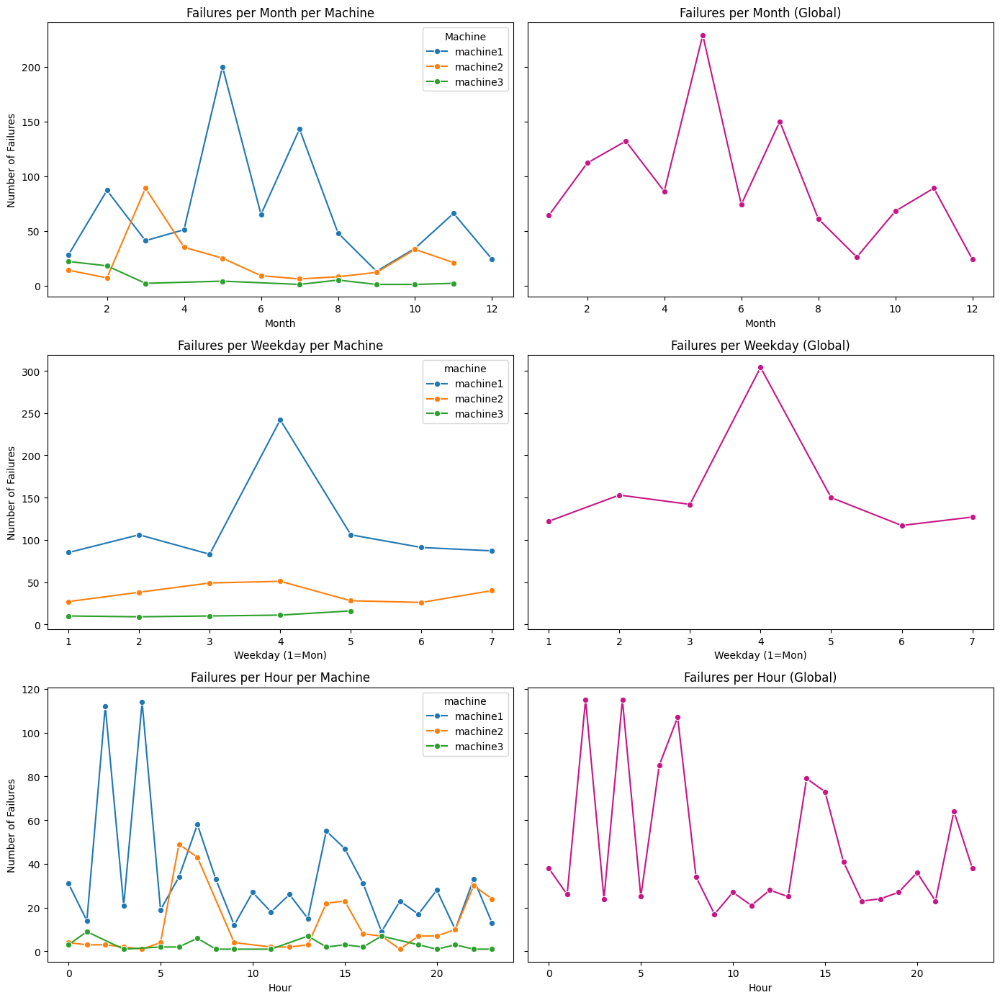

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Make a working copy
df = df_alarm_grouped.copy()

# Ensure datetime format
df['createdAt'] = pd.to_datetime(df['createdAt'], utc=True)

# Extract time features
df['year'] = df['createdAt'].dt.year
df['month'] = df['createdAt'].dt.month
df['month_name'] = df['createdAt'].dt.month_name()
df['weekday'] = df['createdAt'].dt.weekday + 1  # Monday = 1
df['weekday_name'] = df['createdAt'].dt.day_name()
df['hour'] = df['createdAt'].dt.hour

# Filter only failure events
failures = df[df['alarmActivated'] == 1]

# === Seasonality Data ===
# Monthly
failures_per_month = failures.groupby(['machine', 'month']).size().reset_index(name='failures_count')
global_failures_per_month = failures.groupby('month').size().reset_index(name='failures_count')

# Weekday
failures_per_weekday = failures.groupby(['machine', 'weekday']).size().reset_index(name='failures_count')
global_failures_per_weekday = failures.groupby('weekday').size().reset_index(name='failures_count')

# Hourly
failures_per_hour = failures.groupby(['machine', 'hour']).size().reset_index(name='failures_count')
global_failures_per_hour = failures.groupby('hour').size().reset_index(name='failures_count')

# === Plot setup: 3 rows (one per time unit), 2 columns (machine + global) ===
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(14, 14), sharey='row')

# --- Monthly ---
sns.lineplot(
    ax=axs[0, 0],
    data=failures_per_month,
    x='month', y='failures_count',
    hue='machine', marker='o'
)
axs[0, 0].set_title("Failures per Month per Machine")
axs[0, 0].set_xlabel("Month")
axs[0, 0].set_ylabel("Number of Failures")
axs[0, 0].legend(title="Machine")

sns.lineplot(
    ax=axs[0, 1],
    data=global_failures_per_month,
    x='month', y='failures_count',
    marker='o', color='mediumvioletred'
)
axs[0, 1].set_title("Failures per Month (Global)")
axs[0, 1].set_xlabel("Month")
axs[0, 1].set_ylabel("")

# --- Weekday ---
sns.lineplot(
    ax=axs[1, 0],
    data=failures_per_weekday,
    x='weekday', y='failures_count',
    hue='machine', marker='o'
)
axs[1, 0].set_title("Failures per Weekday per Machine")
axs[1, 0].set_xlabel("Weekday (1=Mon)")
axs[1, 0].set_ylabel("Number of Failures")

sns.lineplot(
    ax=axs[1, 1],
    data=global_failures_per_weekday,
    x='weekday', y='failures_count',
    marker='o', color='mediumvioletred'
)
axs[1, 1].set_title("Failures per Weekday (Global)")
axs[1, 1].set_xlabel("Weekday (1=Mon)")
axs[1, 1].set_ylabel("")

# --- Hourly ---
sns.lineplot(
    ax=axs[2, 0],
    data=failures_per_hour,
    x='hour', y='failures_count',
    hue='machine', marker='o'
)
axs[2, 0].set_title("Failures per Hour per Machine")
axs[2, 0].set_xlabel("Hour")
axs[2, 0].set_ylabel("Number of Failures")

sns.lineplot(
    ax=axs[2, 1],
    data=global_failures_per_hour,
    x='hour', y='failures_count',
    marker='o', color='mediumvioletred'
)
axs[2, 1].set_title("Failures per Hour (Global)")
axs[2, 1].set_xlabel("Hour")
axs[2, 1].set_ylabel("")

plt.tight_layout()
plt.show()


#### Failures per Month by Failure ID (Per Machine)

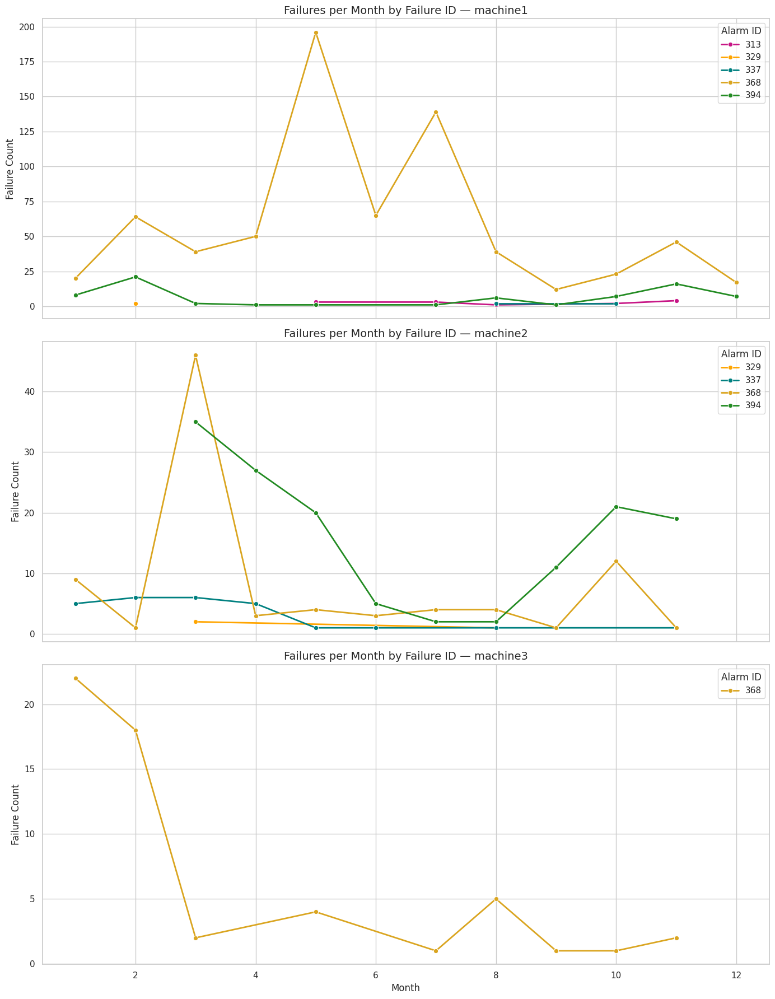

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Unique failure IDs
failure_ids = sorted(df['alarmFaultId'].unique())
color_list = ['mediumvioletred', 'orange', 'teal', 'goldenrod', 'forestgreen']
id_to_color = {fid: color_list[i % len(color_list)] for i, fid in enumerate(failure_ids)}

# Get unique machines
machines = failures_per_month_id['machine'].unique()

# Plot setup
sns.set(style="whitegrid")
fig, axes = plt.subplots(len(machines), 1, figsize=(14, 18), sharex=True)

# Loop through each machine
for i, machine in enumerate(machines):
    ax = axes[i]
    data_machine = failures_per_month_id[failures_per_month_id['machine'] == machine]

    sns.lineplot(
        data=data_machine,
        x='month',
        y='failures_count',
        hue='alarmFaultId',
        marker='o',
        ax=ax,
        palette=id_to_color,
        linewidth=2,
        errorbar=None
    )

    ax.set_title(f'Failures per Month by Failure ID — {machine}', fontsize=14)
    ax.set_xlabel('Month', fontsize=12)
    ax.set_ylabel('Failure Count', fontsize=12)
    ax.legend(title='Alarm ID', loc='upper right')

plt.tight_layout()
plt.show()


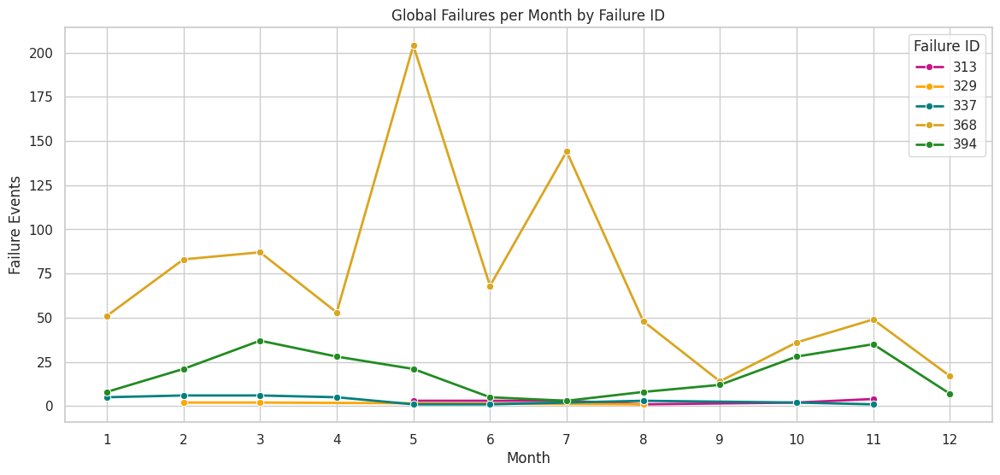

In [ ]:
# Monthly Failures per Failure ID (global)
plt.figure(figsize=(14, 6))
sns.lineplot(
    data=global_failures_per_month_id,
    x='month',
    y='failures_count',
    hue='alarmFaultId',
    marker='o',
    linewidth=2,
    errorbar=None,
    palette=id_to_color
)
plt.title('Global Failures per Month by Failure ID')
plt.xlabel('Month')
plt.ylabel('Failure Events')
plt.legend(title='Failure ID')
plt.xticks(range(1, 13))
plt.show()

#### Top Alarm Types by Weekday

In [ ]:
# Failures only
failures = df[df['alarmActivated'] == 1]

# Count alarmFaultId by weekday
top_alarm_by_weekday = (
    failures.groupby(['weekday', 'alarmFaultId'])
    .size()
    .reset_index(name='count')
    .sort_values(['weekday', 'count'], ascending=[True, False])
    .drop_duplicates('weekday')
    .sort_values('weekday')
)

# Map weekday numbers to names for readability
weekday_map = {1: 'Mon', 2: 'Tue', 3: 'Wed', 4: 'Thu', 5: 'Fri', 6: 'Sat', 7: 'Sun'}
top_alarm_by_weekday['weekday_name'] = top_alarm_by_weekday['weekday'].map(weekday_map)

# Display
print("Top Alarm Types Triggered by Weekday:")
display(top_alarm_by_weekday[['weekday_name', 'alarmFaultId', 'count']])

Top Alarm Types Triggered by Weekday:


,weekday_name,alarmFaultId,count
2,Mon,368,99
6,Tue,368,104
10,Wed,368,95
15,Thu,368,270
20,Fri,368,113
24,Sat,368,90
29,Sun,368,83


#### Zoom: 368 Alarm (Hourly) by Machine

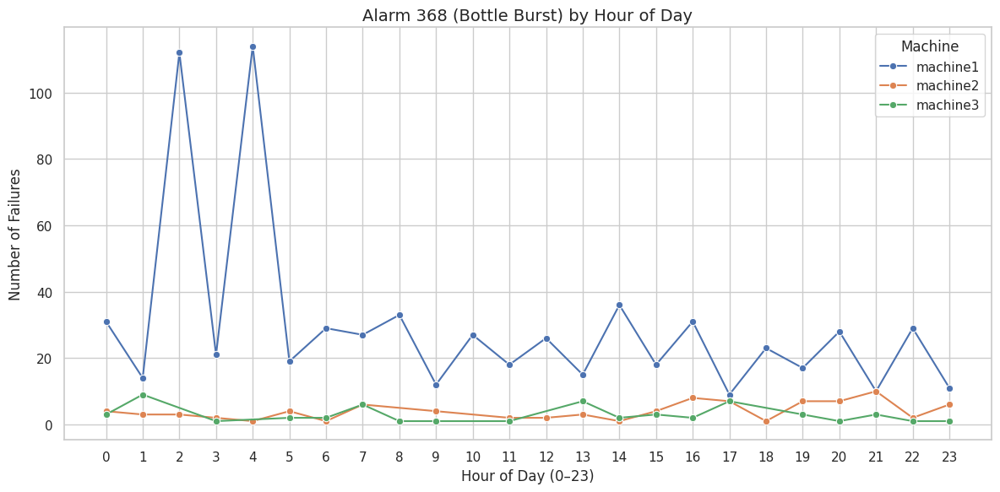

In [ ]:
# Alarm 368 Only — Failures by Hour (All Machines): Zooming into the "bottle burst" failure pattern

# Filter only alarm 368 failures
failures_368 = df[(df['alarmActivated'] == 1) & (df['alarmFaultId'] == 368)]

# Group by hour and machine
hourly_368 = (
    failures_368.groupby(['hour', 'machine'])
    .size()
    .reset_index(name='failures_count')
)

# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=hourly_368, x='hour', y='failures_count', hue='machine', marker='o')

plt.title("Alarm 368 (Bottle Burst) by Hour of Day", fontsize=14)
plt.xlabel("Hour of Day (0–23)")
plt.ylabel("Number of Failures")
plt.xticks(range(0, 24))
plt.legend(title='Machine')
plt.tight_layout()
plt.show()


#### Shift Analysis by Machine

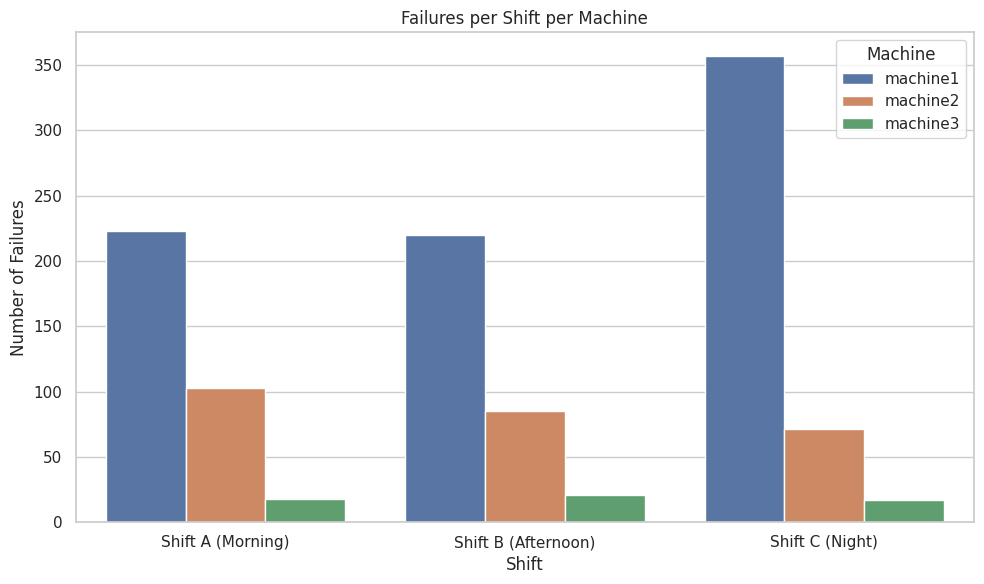

In [ ]:
#  Correlate with Shift Schedules or Time-of-Day Failure Intensity

# Define shifts using the existing 'hour' column in df
def assign_shift(hour):
    if 6 <= hour < 14:
        return 'Shift A (Morning)'
    elif 14 <= hour < 22:
        return 'Shift B (Afternoon)'
    else:
        return 'Shift C (Night)'

# Apply shift
df['shift'] = df['hour'].apply(assign_shift)

# Failures by shift and machine
failures_by_shift = (
    df[df['alarmActivated'] == 1]
    .groupby(['machine', 'shift'])
    .size()
    .reset_index(name='failures_count')
)

# Plot it
plt.figure(figsize=(10, 6))
sns.barplot(data=failures_by_shift, x='shift', y='failures_count', hue='machine')
plt.title('Failures per Shift per Machine')
plt.xlabel('Shift')
plt.ylabel('Number of Failures')
plt.legend(title='Machine')
plt.tight_layout()
plt.show()


#### Heatmap of Failures — Weekday × Hour — Machine 1

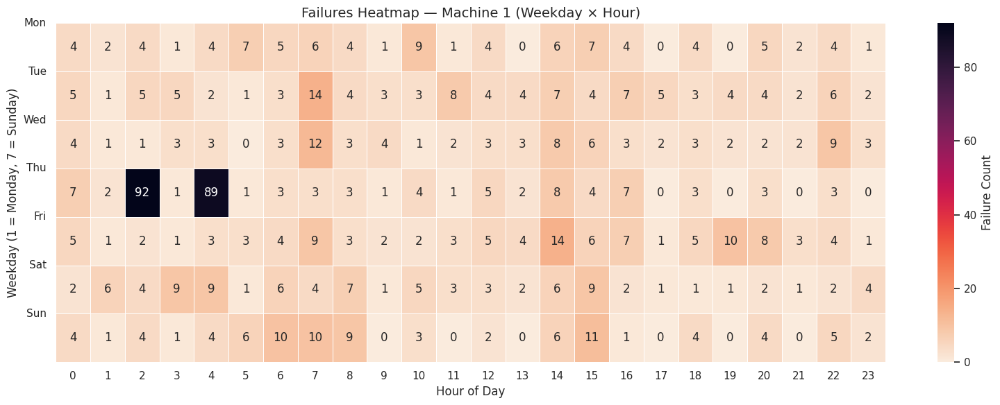

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter only machine1 failures
failures_m1 = df[(df['machine'] == 'machine1') & (df['alarmActivated'] == 1)]

# Create pivot table: weekday (rows) × hour (cols)
heatmap_data = (
    failures_m1.groupby(['weekday', 'hour'])
    .size()
    .reset_index(name='failures_count')
    .pivot(index='weekday', columns='hour', values='failures_count')
    .fillna(0)
)

# Plot heatmap
plt.figure(figsize=(16, 6))
sns.heatmap(heatmap_data, cmap="rocket_r", annot=True, fmt=".0f", linewidths=0.5, cbar_kws={'label': 'Failure Count'})

# Labeling
plt.title("Failures Heatmap — Machine 1 (Weekday × Hour)", fontsize=14)
plt.xlabel("Hour of Day")
plt.ylabel("Weekday (1 = Monday, 7 = Sunday)")
plt.yticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=0)
plt.tight_layout()
plt.show()

### New Dataframe for Alarms

Group by createdAt + machine to create one row per unique event timestamp-machine  called df_alarm_agg_events

In [ ]:
# Dynamically collect all _failure and _recovery columns with correct format
extra_agg_dict = {
    col: (col, 'sum') for col in df.columns if '_failure' in col or '_recovery' in col
}

# Now the full aggregation
df_alarm_agg_events = (
    df.groupby(['createdAt', 'machine'])
    .agg(
        Distinct_AlarmFaultId=('alarmFaultId', 'nunique'),
        Distinct_ValveNumber=('valveNumber', 'nunique'),
        Count_AlarmEvents=('alarmActivated', 'count'),
        Sum_Recovery=('alarmActivated', lambda x: (x == 0).sum()),
        Sum_Failure=('alarmActivated', lambda x: (x == 1).sum()),
        Distinct_Valve_Failures=('valveNumber', lambda x: x[df.loc[x.index, 'alarmActivated'] == 1].nunique()),
        Shift_A_Failures=('shift', lambda x: ((x == 'Shift A (Morning)') & (df.loc[x.index, 'alarmActivated'] == 1)).sum()),
        Shift_B_Failures=('shift', lambda x: ((x == 'Shift B (Afternoon)') & (df.loc[x.index, 'alarmActivated'] == 1)).sum()),
        Shift_C_Failures=('shift', lambda x: ((x == 'Shift C (Night)') & (df.loc[x.index, 'alarmActivated'] == 1)).sum()),
        failure_flag=('alarmActivated', lambda x: int((x == 1).any())),
        **extra_agg_dict  # plug in dynamic _failure/_recovery columns
    )
    .reset_index()
    .sort_values(['createdAt', 'machine'])
)

# Build criticity map per timestamp and machine
failure_criticity_map = (
    df[df['alarmActivated'] == 1]
    .groupby(['createdAt', 'machine'])['criticityId']
    .apply(lambda x: sorted(set(x)))
    .to_dict()
)

# Criticity classification function remains the same
def classify_combined_criticity(criticity_list):
    s = set(criticity_list)
    if s == {1}:
        return 1, "Low Risk"
    elif s == {3}:
        return 2, "Mid Risk"
    elif s == {2}:
        return 3, "High Risk"
    elif s == {1, 3}:
        return 2, "Mid Risk"
    elif s == {1, 2}:
        return 3, "High Risk"
    elif s == {2, 3}:
        return 4, "Compound Risk"
    elif s == {1, 2, 3}:
        return 5, "Full Severity Mix"
    else:
        return 0, "0"

# Apply criticity classification
criticity_levels = [
    classify_combined_criticity(failure_criticity_map.get((ts, m), []))
    for ts, m in zip(df_alarm_agg_events['createdAt'], df_alarm_agg_events['machine'])
]
df_alarm_agg_events['combined_criticity'] = [lvl[0] for lvl in criticity_levels]
df_alarm_agg_events['combined_criticity_desc'] = [lvl[1] for lvl in criticity_levels]

# First failure per cycle (with machine info)
first_cycle_failures = (
    df[(df['alarmActivated'] == 1) & (df['cycleID'].notna())]
    .sort_values('createdAt')
    .drop_duplicates(subset='cycleID', keep='first')
)

cycle_start_counts = (
    first_cycle_failures
    .groupby(['createdAt', 'machine'])['cycleID']
    .count()
    .rename('count_cycle_starts')
    .reset_index()
)

df_alarm_agg_events = df_alarm_agg_events.merge(cycle_start_counts, on=['createdAt', 'machine'], how='left')
df_alarm_agg_events['count_cycle_starts'] = df_alarm_agg_events['count_cycle_starts'].fillna(0).astype(int)

first_cycle_368 = (
    df[
        (df['alarmActivated'] == 1) &
        (df['368_failure'] > 0) &
        (df['cycleID'].notna())
    ]
    .sort_values('createdAt')
    .drop_duplicates(subset='cycleID', keep='first')
)

cycle_start_368_counts = (
    first_cycle_368
    .groupby(['createdAt', 'machine'])['cycleID']
    .count()
    .rename('count_cycle_starts_368')
    .reset_index()
)

df_alarm_agg_events = df_alarm_agg_events.merge(cycle_start_368_counts, on=['createdAt', 'machine'], how='left')
df_alarm_agg_events['count_cycle_starts_368'] = df_alarm_agg_events['count_cycle_starts_368'].fillna(0).astype(int)

cycle_closed_counts = (
    df[(df['alarmActivated'] == 0) & (df['log_duration'].notna())]
    .groupby(['createdAt', 'machine'])['cycleID']
    .nunique()
    .rename('count_cycle_closed')
    .reset_index()
)

df_alarm_agg_events = df_alarm_agg_events.merge(cycle_closed_counts, on=['createdAt', 'machine'], how='left')
df_alarm_agg_events['count_cycle_closed'] = df_alarm_agg_events['count_cycle_closed'].fillna(0).astype(int)

# Preview
print("Aggregated dataframe for event summary created:")
display(df_alarm_agg_events)


Aggregated dataframe for event summary created:


,createdAt,machine,Distinct_AlarmFaultId,Distinct_ValveNumber,Count_AlarmEvents,Sum_Recovery,Sum_Failure,Distinct_Valve_Failures,Shift_A_Failures,Shift_B_Failures,...,313_recovery,329_failure,329_recovery,337_failure,337_recovery,combined_criticity,combined_criticity_desc,count_cycle_starts,count_cycle_starts_368,count_cycle_closed
0,2024-01-02 13:00:00+00:00,machine3,1,1,1,0,1,1,1,0,...,0,0,0,0,0,3,High Risk,1,1,0
1,2024-01-02 15:00:00+00:00,machine3,1,1,1,0,1,1,0,1,...,0,0,0,0,0,3,High Risk,0,0,0
2,2024-01-02 19:00:00+00:00,machine3,1,1,1,0,1,1,0,1,...,0,0,0,0,0,3,High Risk,1,1,0
3,2024-01-03 19:00:00+00:00,machine2,1,1,1,0,1,1,0,1,...,0,0,0,0,0,3,High Risk,1,1,0
4,2024-01-03 23:00:00+00:00,machine2,1,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
864,2025-03-28 05:00:00+00:00,machine2,1,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
865,2025-03-28 23:00:00+00:00,machine2,1,3,3,2,1,1,0,0,...,0,0,0,0,0,1,Low Risk,1,0,2
866,2025-03-29 23:00:00+00:00,machine2,1,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
867,2025-03-30 06:00:00+00:00,machine2,1,1,1,0,1,1,1,0,...,0,1,0,0,0,2,Mid Risk,1,0,0


#### Filter Machine 1 for future strategic approach

In [ ]:
# Keep agg events of Machine 1 in a new dataframe

df_alarm_agg_events_m1 = df_alarm_agg_events[(df_alarm_agg_events["machine"] == "machine1")]
print(df_alarm_agg_events_m1.shape)
df_alarm_agg_events_m1

(486, 27)


,createdAt,machine,Distinct_AlarmFaultId,Distinct_ValveNumber,Count_AlarmEvents,Sum_Recovery,Sum_Failure,Distinct_Valve_Failures,Shift_A_Failures,Shift_B_Failures,...,313_recovery,329_failure,329_recovery,337_failure,337_recovery,combined_criticity,combined_criticity_desc,count_cycle_starts,count_cycle_starts_368,count_cycle_closed
15,2024-01-13 11:00:00+00:00,machine1,1,1,1,0,1,1,1,0,...,0,0,0,0,0,3,High Risk,1,1,0
16,2024-01-13 13:00:00+00:00,machine1,1,1,1,0,1,1,1,0,...,0,0,0,0,0,3,High Risk,0,0,0
30,2024-01-19 11:00:00+00:00,machine1,1,1,1,0,1,1,1,0,...,0,0,0,0,0,3,High Risk,0,0,0
31,2024-01-19 13:00:00+00:00,machine1,1,1,1,0,1,1,1,0,...,0,0,0,0,0,3,High Risk,0,0,0
50,2024-01-30 11:00:00+00:00,machine1,1,6,6,0,6,6,6,0,...,0,0,0,0,0,3,High Risk,6,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,2025-03-12 23:00:00+00:00,machine1,1,2,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
816,2025-03-16 07:00:00+00:00,machine1,1,6,6,0,6,6,6,0,...,0,0,0,0,0,3,High Risk,6,6,0
817,2025-03-16 09:00:00+00:00,machine1,1,6,6,6,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6
843,2025-03-26 07:00:00+00:00,machine1,1,5,5,0,5,5,5,0,...,0,0,0,0,0,3,High Risk,5,5,0


### Performance Dataset

In [ ]:
# Check if there are duplicate rows in performance based on timestamp + machine
perf_dupes = df_perf_all.duplicated(subset=['timestamp', 'machine'], keep=False)
num_dupes = perf_dupes.sum()

print(f"Duplicate rows in performance dataset (based on timestamp + machine): {num_dupes}")

Duplicate rows in performance dataset (based on timestamp + machine): 0


In [ ]:
# Convert timestamp
df_perf_all['timestamp'] = pd.to_datetime(df_perf_all['timestamp'], utc=True, errors='coerce')
df_perf_all['hour'] = df_perf_all['timestamp'].dt.hour
df_perf_all['month'] = df_perf_all['timestamp'].dt.month
df_perf_all['year'] = df_perf_all['timestamp'].dt.year
df_perf_all['day_of_week'] = df_perf_all['timestamp'].dt.dayofweek

# Create performance deviation features
df_perf_all['speed_deviation'] = (df_perf_all['avgprocessspeed'] - df_perf_all['designspeed']) / df_perf_all['designspeed']

# Create speed ratio features (using exact names from your dataset)
df_perf_all['speed_ratio_avg'] = df_perf_all['avgprocessspeed'] / df_perf_all['designspeed']
df_perf_all['speed_ratio_max'] = df_perf_all['maxprocessspeed'] / df_perf_all['designspeed']

# Create time utilization features
df_perf_all['downtime_ratio'] = df_perf_all['equipmentdowntime'] / df_perf_all['workingtime']

# Create quality composite metric
df_perf_all['effective_quality'] = df_perf_all['qualityrate'] * (1 - df_perf_all['rejectionrate'])

In [ ]:
# Ensure rolling features exist & are robust to duplicate timestamps
# Uses your working performance DataFrame: df  (or swap to df_perf_all if that's what you use downstream)

# === Rolling features for speed_deviation (per machine; safe with duplicate timestamps) ===
df_perf_all = df_perf_all.sort_values(['machine', 'timestamp']).copy()

def _add_speed_dev_rollups(g):
    t = g.sort_values('timestamp').copy()
    t = t.set_index('timestamp')
    # trailing, time-based windows; use min_periods=1 so early rows aren’t all NaN
    t['speed_deviation_last_6h']  = t['speed_deviation'].rolling('6h',  min_periods=1).mean()
    t['speed_deviation_last_12h'] = t['speed_deviation'].rolling('12h', min_periods=1).mean()
    return t.reset_index()

df_perf_all = (
    df_perf_all
    .groupby('machine', group_keys=False)
    .apply(_add_speed_dev_rollups)
    .sort_values(['machine', 'timestamp'])
    .reset_index(drop=True)
)

print("Ready: speed_deviation_last_6h / speed_deviation_last_12h added.")

Ready: speed_deviation_last_6h / speed_deviation_last_12h added.


/tmp/ipython-input-3743817274.py:18: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_add_speed_dev_rollups)


In [ ]:
df = df_perf_all.copy()

In [ ]:
# Count NaN values
null_count = df.isnull().sum().sum()
print("Number of NaN values:", null_count)

# Count inf values
import numpy as np

# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

inf_count = np.isinf(numeric_df).sum().sum()
print("Number of inf/-inf values in numeric columns:", inf_count)

df_cleaned = df.copy()

# Replace inf values with NaN in numeric columns only
df_cleaned[numeric_df.columns] = df_cleaned[numeric_df.columns].replace([np.inf, -np.inf], np.nan)

# Drop rows with NaN values
df_cleaned = df_cleaned.dropna()

df_cleaned = df.replace([np.inf, -np.inf], np.nan).dropna()
print("Cleaned DataFrame shape:", df_cleaned.shape)

Number of NaN values: 280
Number of inf/-inf values in numeric columns: 10
Cleaned DataFrame shape: (18320, 44)


In [ ]:
import numpy as np

# Select only numeric columns
numeric_df_perf = df_cleaned.select_dtypes(include=[np.number])

# Remove constant or near-zero-variance features
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler

selector = VarianceThreshold(threshold=0.01)
selector.fit(numeric_df_perf)

low_variance_cols = numeric_df_perf.columns[~selector.get_support()]
print("Low-variance columns to consider dropping:", low_variance_cols.tolist())

Low-variance columns to consider dropping: ['reactiontime', 'rank']


### Broad Performance Analysis

#### Exploratory Data Analysis (EDA) & Time Series Analysis

In [ ]:
# =============================================
# Exploratory Data Analysis (EDA) & Time Series Analysis
# =============================================
df = df_cleaned

#1. Numerical Summary
print("\n=== Numerical Summary ===")
print("\nFull statistics for all numerical columns")
print(df.select_dtypes(include=['float64', 'int64']).describe().transpose())


=== Numerical Summary ===

Full statistics for all numerical columns
                                    count          mean            std  \
availability                      18320.0     89.292623      25.030670   
operationalavailability           18320.0     55.350803      28.580902   
efficiency                        18320.0     54.936907      29.095769   
oee                               18320.0     52.244316      29.333386   
qualityrate                       18320.0     99.845580       2.867202   
runningtime                       18320.0   1953.434989    1029.126037   
mtbf                              18320.0   1748.938589    1078.689370   
mttr                              18320.0     71.924921     217.204173   
rejectionrate                     18320.0      0.025436       1.004348   
processed                         18320.0  22573.520251   13164.177315   
produce                           18320.0  22569.292849   13165.311671   
workingtime                       18320.0 

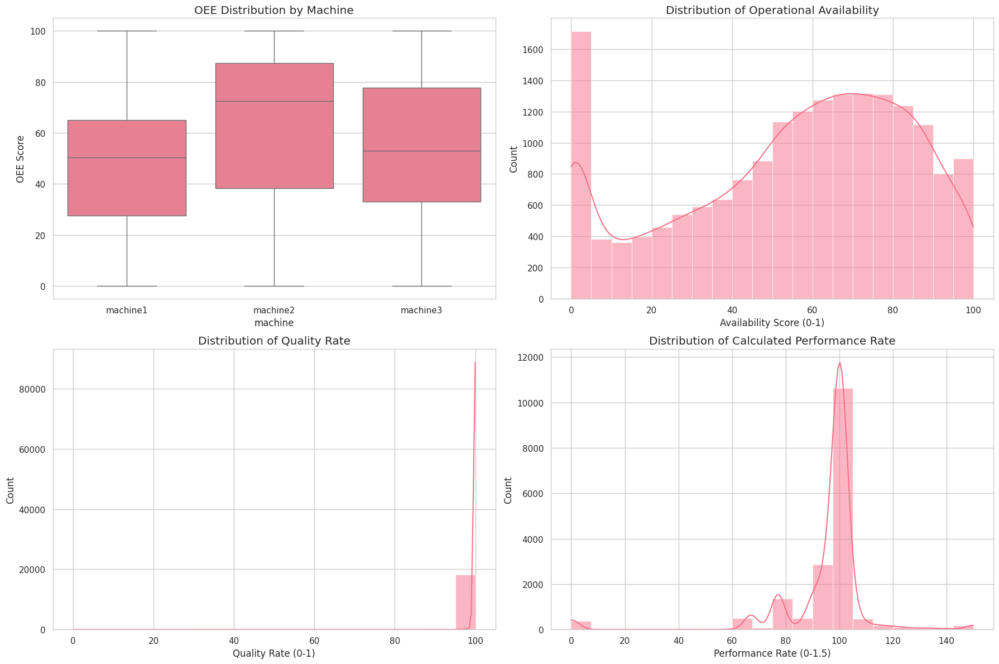

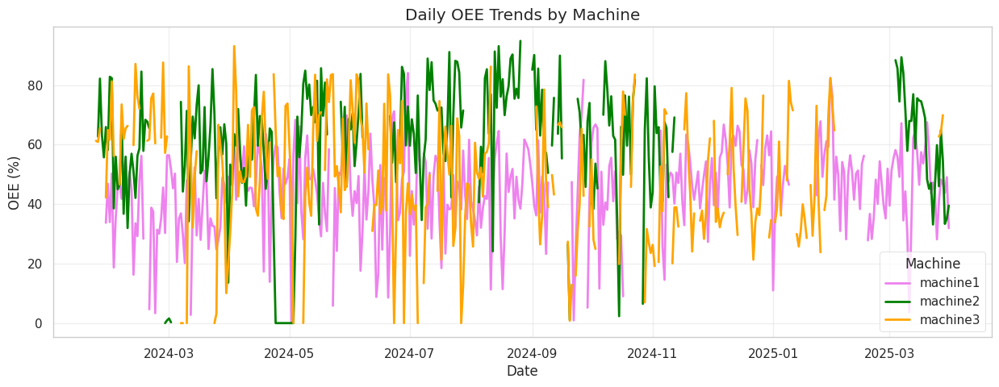

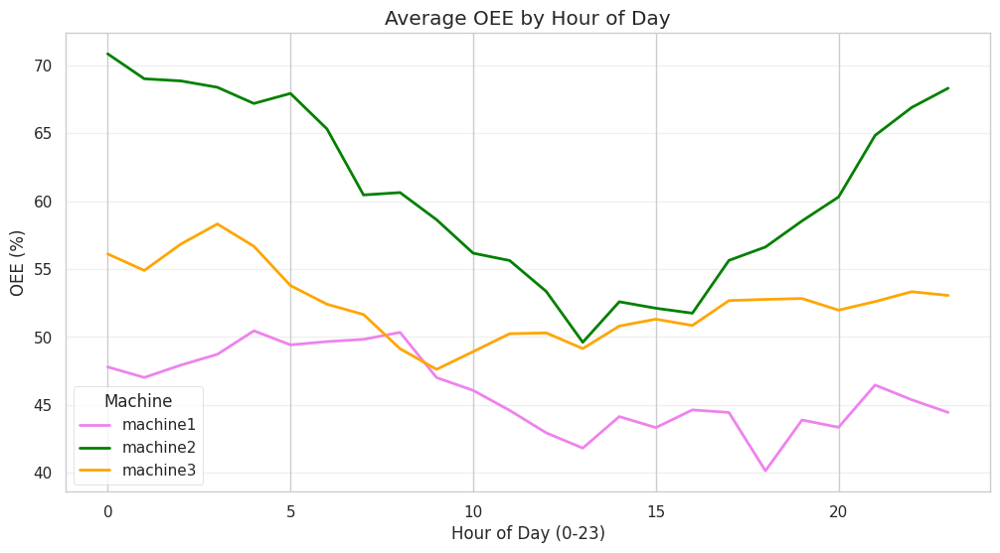

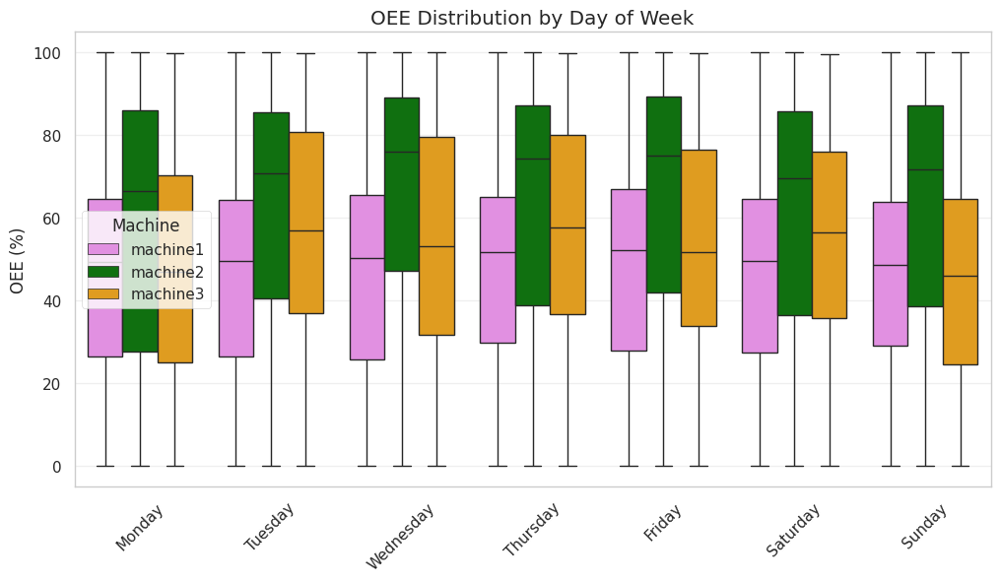

<Figure size 1200x600 with 0 Axes>

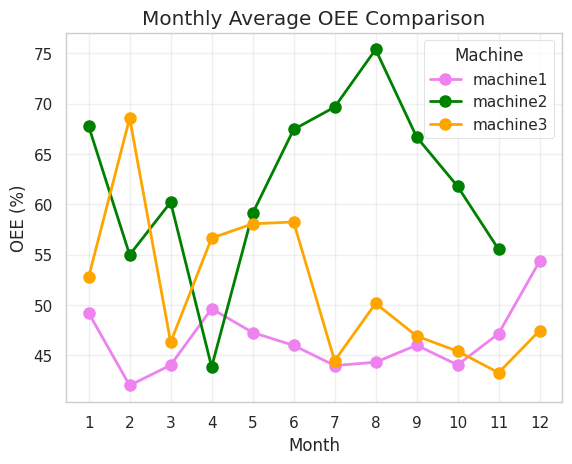

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def full_oee_analysis(df):
    # === Check required column ===
    if 'machine' not in df.columns:
        raise ValueError("Please run Chapter 1 first to prepare the data")

    # === Derived Feature: Performance Rate ===
    df['performance_rate'] = 10000 * df['oee'] / (df['operationalavailability'] * df['qualityrate'])
    df['performance_rate'] = df['performance_rate'].replace([np.inf, -np.inf], np.nan).clip(0, 150)

    # === Set Up Styles ===
    plt.style.use('ggplot')
    sns.set_style("whitegrid")
    sns.set_palette("husl")

    # Custom color palette
    machine_colors = {
        'machine1': 'violet',
        'machine2': 'green',
        'machine3': 'orange'
    }

    # === 1. Distribution Overview ===
    plt.figure(figsize=(18, 12))

    plt.subplot(2, 2, 1)
    sns.boxplot(data=df, x='machine', y='oee')
    plt.title('OEE Distribution by Machine')
    plt.ylabel('OEE Score')

    plt.subplot(2, 2, 2)
    sns.histplot(df['operationalavailability'], kde=True, bins=20)
    plt.title('Distribution of Operational Availability')
    plt.xlabel('Availability Score (0-1)')

    plt.subplot(2, 2, 3)
    sns.histplot(df['qualityrate'], kde=True, bins=20)
    plt.title('Distribution of Quality Rate')
    plt.xlabel('Quality Rate (0-1)')

    plt.subplot(2, 2, 4)
    sns.histplot(df['performance_rate'], kde=True, bins=20)
    plt.title('Distribution of Calculated Performance Rate')
    plt.xlabel('Performance Rate (0-1.5)')

    plt.tight_layout()
    plt.show()

    # === 2. Daily OEE Trends ===
    daily_oee = df.set_index('timestamp').groupby('machine')['oee'].resample('D').mean().unstack(level=0)
    plt.figure(figsize=(15, 5))
    for machine in daily_oee.columns:
        plt.plot(daily_oee.index, daily_oee[machine],
                 color=machine_colors.get(machine, 'gray'),
                 label=machine, linewidth=2)
    plt.title('Daily OEE Trends by Machine')
    plt.ylabel('OEE (%)')
    plt.xlabel('Date')
    plt.legend(title='Machine')
    plt.grid(True, alpha=0.3)
    plt.show()

    # === 3. Hourly Pattern ===
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df, x='hour', y='oee', hue='machine',
                 palette=machine_colors, estimator='mean',
                 errorbar=None, linewidth=2)
    plt.title('Average OEE by Hour of Day')
    plt.ylabel('OEE (%)')
    plt.xlabel('Hour of Day (0-23)')
    plt.legend(title='Machine')
    plt.grid(axis='y', alpha=0.3)
    plt.show()

    # === 4. Day of Week Analysis ===
    df['day_name'] = df['timestamp'].dt.day_name()
    day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df, x='day_name', y='oee', hue='machine',
                order=day_order, palette=machine_colors,
                showfliers=False)
    plt.title('OEE Distribution by Day of Week')
    plt.xlabel('')
    plt.ylabel('OEE (%)')
    plt.xticks(rotation=45)
    plt.legend(title='Machine')
    plt.grid(axis='y', alpha=0.3)
    plt.show()

    # === 5. Monthly OEE Trend ===
    monthly_oee = df.groupby(['month', 'machine'])['oee'].mean().unstack()
    plt.figure(figsize=(12, 6))
    monthly_oee.plot(kind='line',
                     color=machine_colors.values(),
                     marker='o', linewidth=2, markersize=8)
    plt.title('Monthly Average OEE Comparison')
    plt.ylabel('OEE (%)')
    plt.xlabel('Month')
    plt.legend(title='Machine')
    plt.grid(True, alpha=0.3)
    plt.xticks(range(1, 13))
    plt.show()

full_oee_analysis(df)


Text(0, 0.5, 'Performance Rate')

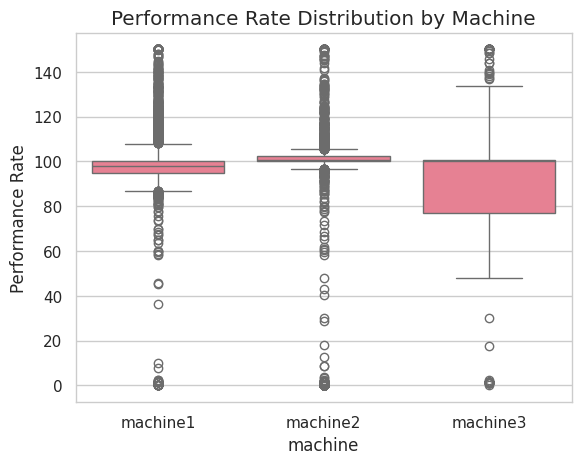

In [ ]:
    plt.figure()
    sns.boxplot(data=df, x='machine', y='performance_rate')
    plt.title('Performance Rate Distribution by Machine')
    plt.ylabel('Performance Rate')

#### Correlation Analysis (All Machines - Performance Dataset)


=== POSITIVE IMPACT on OEE ===
Features where increase improves OEE:
netoperatingtime           0.977775
speed_deviation            0.970104
speed_ratio_avg            0.970104
efficiency                 0.954957
processed                  0.898114
produce                    0.898046
avgprocessspeed            0.898028
operationalavailability    0.889651
runningtime                0.867005
speed_deviation_last_6h    0.744160
Name: oee, dtype: float64

=== NEGATIVE IMPACT on OEE ===
Features where increase reduces OEE (sorted by strongest negative):
downtime_ratio                     -0.526498
equipmentdowntime                  -0.511955
induceddowntime                    -0.485095
planneddowntime                    -0.457734
externaltime                       -0.110613
mttr                               -0.103555
internaldowntime                   -0.102665
hour                               -0.062077
designspeed                        -0.051404
productiontimeexpectedproduction   -0.0

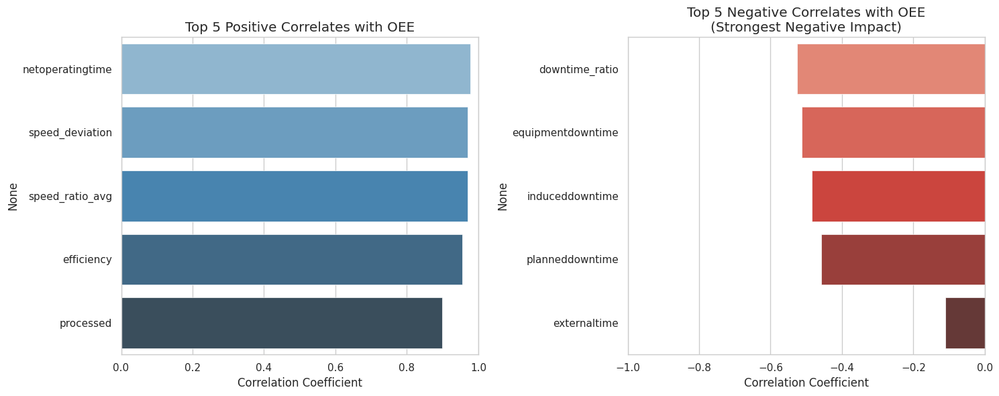

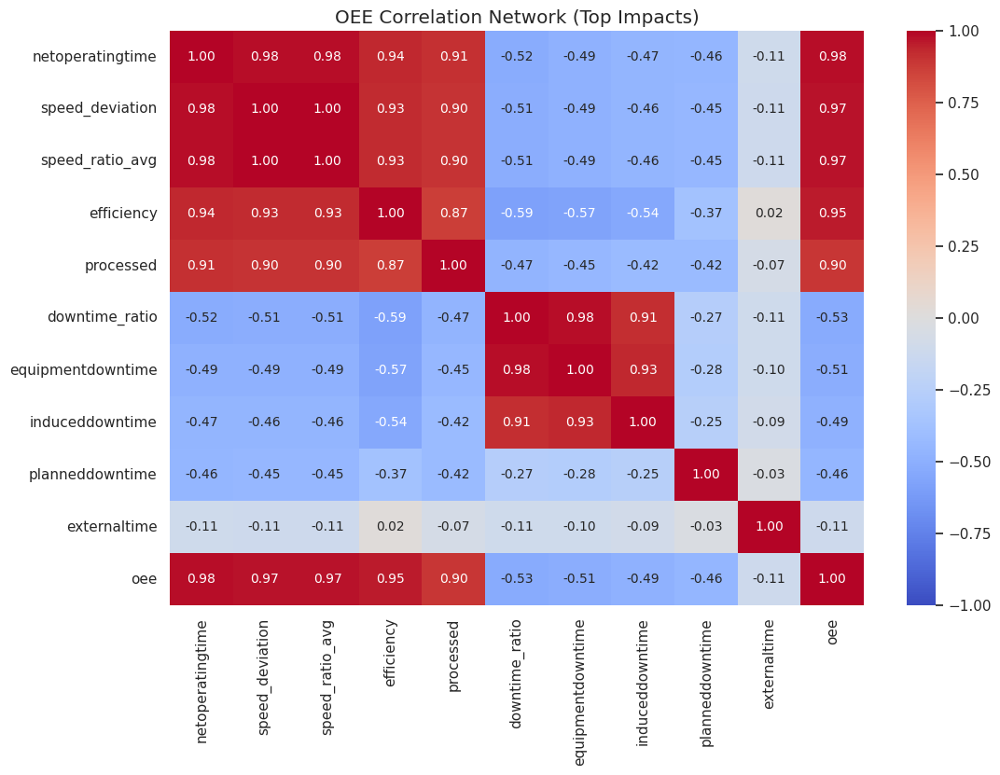


Investigating top relationships...


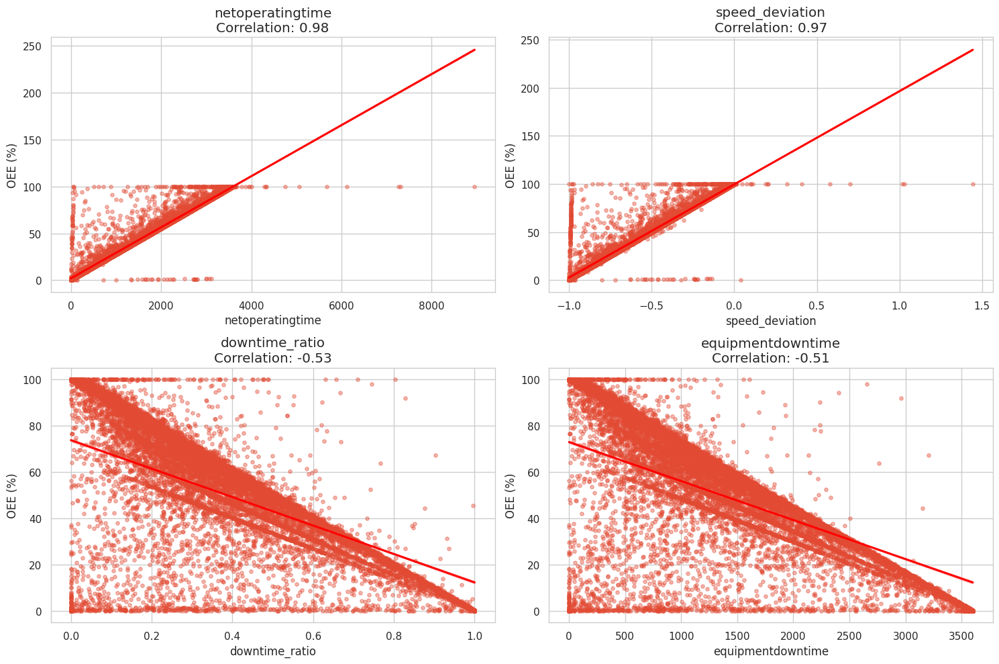

In [ ]:
# =============================================
# Correlation Analysis (Signed Impacts)
# =============================================
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def analyze_correlations(df):
    # Verify we have the prepared data
    if 'machine' not in df.columns:
        raise ValueError("Please run Chapter 1 first to prepare the data")

    # Set up the plotting style
    plt.style.use('ggplot')
    sns.set_style("whitegrid")

    # 1. Prepare correlation data
    numerical_df = df.select_dtypes(include=[np.number])
    corr_matrix = numerical_df.corr()
    oee_corr = corr_matrix['oee'].sort_values(ascending=False)

    # 2. Separate positive and negative correlations
    positive_corr = oee_corr[oee_corr > 0].drop('oee')
    negative_corr = oee_corr[oee_corr < 0].sort_values()  # Sort ascending to get most negative first

    print("\n=== POSITIVE IMPACT on OEE ===")
    print("Features where increase improves OEE:")
    print(positive_corr.head(10))

    print("\n=== NEGATIVE IMPACT on OEE ===")
    print("Features where increase reduces OEE (sorted by strongest negative):")
    print(negative_corr.head(10))

    # 3. Visualize top impacts
    plt.figure(figsize=(15, 6))

    # Positive impacts
    plt.subplot(1, 2, 1)
    sns.barplot(x=positive_corr.head(5).values,
                y=positive_corr.head(5).index,
                hue=positive_corr.head(5).index,
                palette='Blues_d',
                legend=False)
    plt.title('Top 5 Positive Correlates with OEE')
    plt.xlabel('Correlation Coefficient')
    plt.xlim(0, 1)

    # Negative impacts (now showing strongest negatives first)
    plt.subplot(1, 2, 2)
    sns.barplot(x=negative_corr.head(5).values,
                y=negative_corr.head(5).index,
                hue=negative_corr.head(5).index,
                palette='Reds_d',
                legend=False)
    plt.title('Top 5 Negative Correlates with OEE\n(Strongest Negative Impact)')
    plt.xlabel('Correlation Coefficient')
    plt.xlim(-1, 0)

    plt.tight_layout()
    plt.show()

    # 4. Full correlation matrix (focused on OEE)
    plt.figure(figsize=(12, 8))

    # Combine top positive and negative features
    top_features = list(positive_corr.head(5).index) + list(negative_corr.head(5).index) + ['oee']
    sns.heatmap(corr_matrix.loc[top_features, top_features],
                annot=True, fmt=".2f", cmap='coolwarm',
                center=0, vmin=-1, vmax=1,
                annot_kws={"size": 10})
    plt.title("OEE Correlation Network (Top Impacts)")
    plt.show()

    # 5. Example relationship plots
    print("\nInvestigating top relationships...")
    example_features = list(positive_corr.head(2).index) + list(negative_corr.head(2).index)

    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    for ax, feature in zip(axes.flatten(), example_features):
        sns.regplot(data=df, x=feature, y='oee',
                   scatter_kws={'alpha':0.4, 's':15},
                   line_kws={'color':'red'}, ax=ax)
        corr_value = corr_matrix.loc['oee', feature]
        ax.set_title(f"{feature}\nCorrelation: {corr_value:.2f}")
        ax.set_ylabel('OEE (%)')

    plt.tight_layout()
    plt.show()

analyze_correlations(df)

In [ ]:
# Extract the number from recipe & machine
df['recipe'] = df['recipe'].astype(str).str.replace('recipe_', '', case=False).astype(int)

### ONLY MACHINE 1 - Performance Dataset

In [ ]:
print("Rows for machine 1:", df[df['machine'] == 'machine1'].shape[0])

Rows for machine 1: 7662


In [ ]:
df_m1 = df[df['machine'] == 'machine1'].copy()

### Correlation Analysis (Machine 1) - Leverage on this for Section 4.3


 Correlation with OEE:

oee                                 1.000000
operationalavailability             0.973195
produce                             0.964387
processed                           0.964387
avgprocessspeed                     0.964383
netoperatingtime                    0.960386
runningtime                         0.942748
speed_deviation                     0.941730
speed_ratio_avg                     0.941730
efficiency                          0.912880
mtbf                                0.800097
speed_deviation_last_6h             0.637425
maxprocessspeed                     0.513188
speed_deviation_last_12h            0.512121
speed_ratio_max                     0.496864
effectivetime                       0.464718
availability                        0.454946
MachineSpeed_max                    0.341729
minprocessspeed                     0.315556
workingtime                         0.218484
recipe                              0.093350
performance_rate              

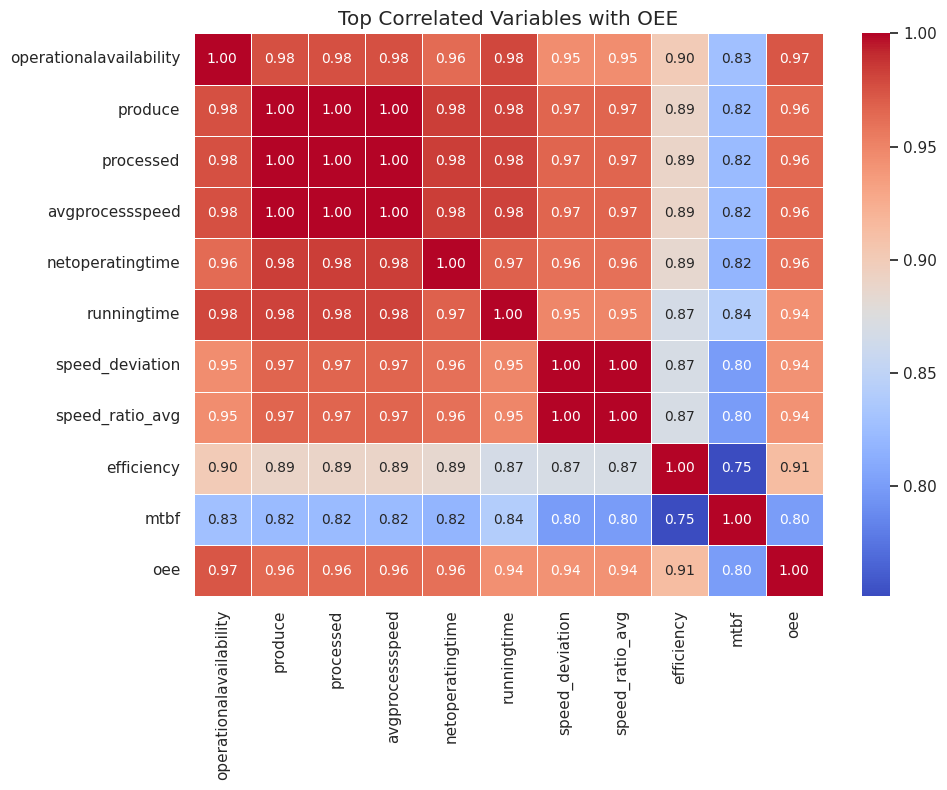

In [ ]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure all columns are visible in output
pd.set_option('display.max_columns', None)

# Select only numerical columns
merged_numcol = df_m1._get_numeric_data().columns
num_data = df_m1[merged_numcol]

# Compute correlation matrix
correlation = num_data.corr()

# Sort correlation values with respect to 'oee'
correlation_with_oee = correlation['oee'].sort_values(ascending=False)

# Print correlations
print("\n Correlation with OEE:\n")
print(correlation_with_oee)

# Optional: Visualize top 10 most correlated variables with OEE
top_corr = correlation_with_oee.drop('oee').abs().sort_values(ascending=False).head(10).index
top_corr_matrix = df_m1[top_corr.tolist() + ['oee']].corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(top_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Top Correlated Variables with OEE")
plt.tight_layout()
plt.show()


=== POSITIVE IMPACT on OEE ===
Features where an increase tends to improve OEE:
operationalavailability    0.973195
produce                    0.964387
processed                  0.964387
avgprocessspeed            0.964383
netoperatingtime           0.960386
runningtime                0.942748
speed_deviation            0.941730
speed_ratio_avg            0.941730
efficiency                 0.912880
mtbf                       0.800097
Name: oee, dtype: float64

=== NEGATIVE IMPACT on OEE ===
Features where an increase tends to reduce OEE:
downtime_ratio      -0.532772
equipmentdowntime   -0.512489
induceddowntime     -0.484167
planneddowntime     -0.443476
externaltime        -0.115066
mttr                -0.105455
internaldowntime    -0.084016
hour                -0.075350
designspeed         -0.002487
Name: oee, dtype: float64


/tmp/ipython-input-2342196049.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=positive_corr.head(5).values,
/tmp/ipython-input-2342196049.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=negative_corr.head(5).values,


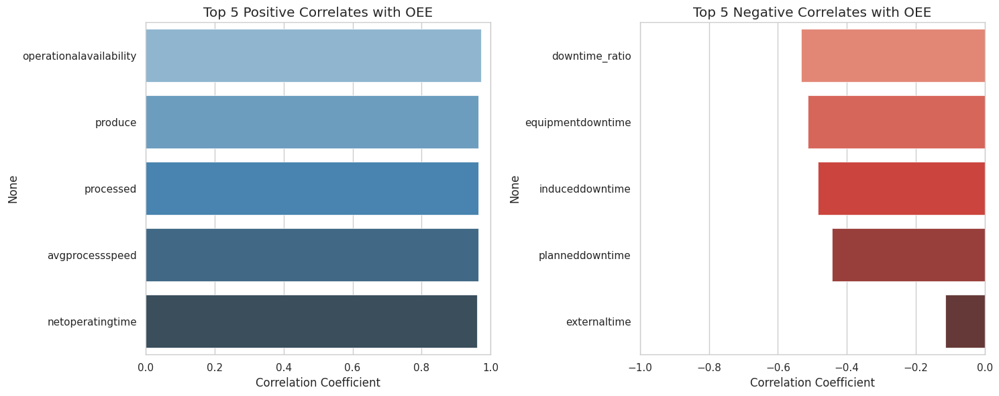

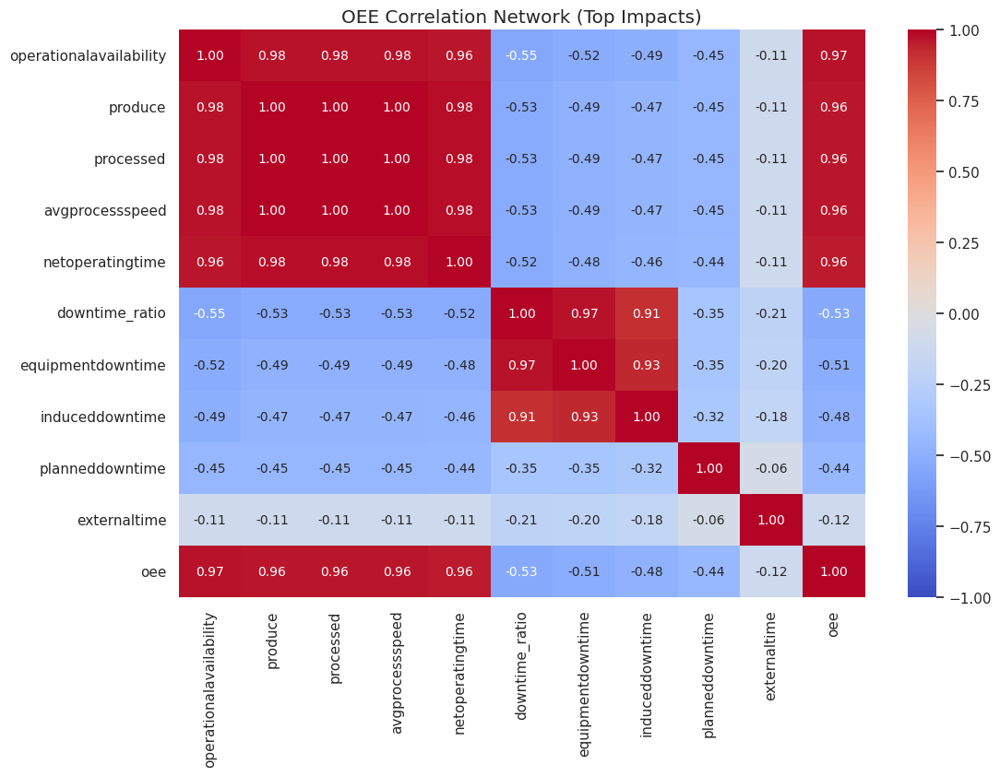


 Investigating top relationships with OEE...



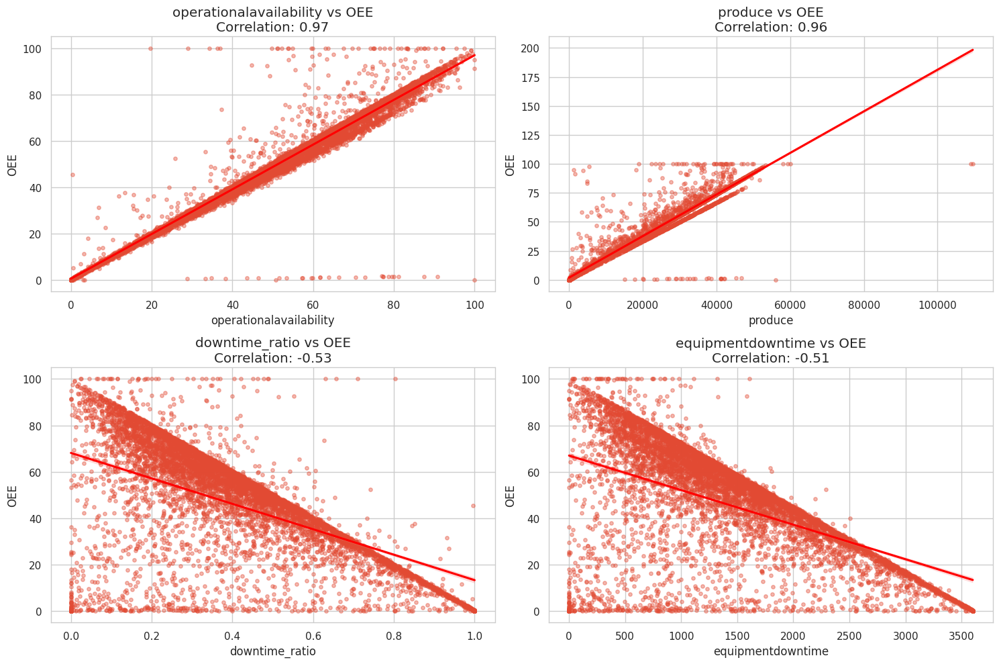

In [ ]:
# =============================================
# Correlation Analysis
# =============================================
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def analyze_correlations(df_m1):
    # Optional: validate OEE exists
    if 'oee' not in df_m1.columns:
        raise ValueError("The dataset must contain the 'oee' column.")

    # Set up the plotting style
    plt.style.use('ggplot')
    sns.set_style("whitegrid")

    # 1. Prepare correlation data
    numerical_df_m1 = df_m1.select_dtypes(include=[np.number])
    corr_matrix = numerical_df_m1.corr()
    oee_corr = corr_matrix['oee'].sort_values(ascending=False)

    # 2. Separate positive and negative correlations
    positive_corr = oee_corr[oee_corr > 0].drop('oee')
    negative_corr = oee_corr[oee_corr < 0].sort_values()  # Most negative first

    print("\n=== POSITIVE IMPACT on OEE ===")
    print("Features where an increase tends to improve OEE:")
    print(positive_corr.head(10))

    print("\n=== NEGATIVE IMPACT on OEE ===")
    print("Features where an increase tends to reduce OEE:")
    print(negative_corr.head(10))

    # 3. Visualize top impacts
    plt.figure(figsize=(15, 6))

    # Top Positive Correlates
    plt.subplot(1, 2, 1)
    sns.barplot(x=positive_corr.head(5).values,
                y=positive_corr.head(5).index,
                palette='Blues_d')
    plt.title('Top 5 Positive Correlates with OEE')
    plt.xlabel('Correlation Coefficient')
    plt.xlim(0, 1)

    # Top Negative Correlates
    plt.subplot(1, 2, 2)
    sns.barplot(x=negative_corr.head(5).values,
                y=negative_corr.head(5).index,
                palette='Reds_d')
    plt.title('Top 5 Negative Correlates with OEE')
    plt.xlabel('Correlation Coefficient')
    plt.xlim(-1, 0)

    plt.tight_layout()
    plt.show()

    # 4. Heatmap of Top Impacts
    top_features = list(positive_corr.head(5).index) + list(negative_corr.head(5).index) + ['oee']

    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix.loc[top_features, top_features],
                annot=True, fmt=".2f", cmap='coolwarm',
                center=0, vmin=-1, vmax=1,
                annot_kws={"size": 10})
    plt.title("OEE Correlation Network (Top Impacts)")
    plt.show()

    # 5. Relationship Plots for Top Features
    print("\n Investigating top relationships with OEE...\n")
    example_features = list(positive_corr.head(2).index) + list(negative_corr.head(2).index)

    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    for ax, feature in zip(axes.flatten(), example_features):
        sns.regplot(data=df_m1, x=feature, y='oee',
                    scatter_kws={'alpha': 0.4, 's': 15},
                    line_kws={'color': 'red'}, ax=ax)
        corr_value = corr_matrix.loc['oee', feature]
        ax.set_title(f"{feature} vs OEE\nCorrelation: {corr_value:.2f}")
        ax.set_ylabel('OEE')

    plt.tight_layout()
    plt.show()

# Call the function with your cleaned DataFrame
analyze_correlations(df_m1)


### Hidden Patterns in Performance (Machine 1)


=== Hidden Pattern Analysis: Machine 1 ===

=== Interaction Effects ===


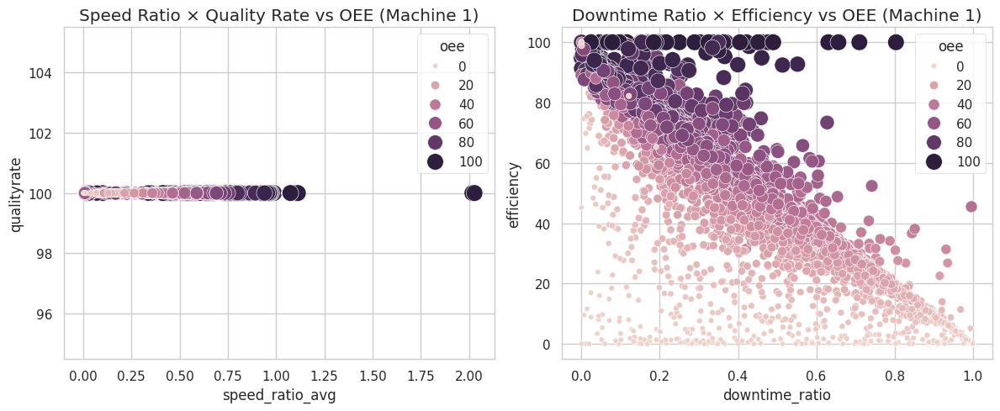


=== Principal Component Analysis ===


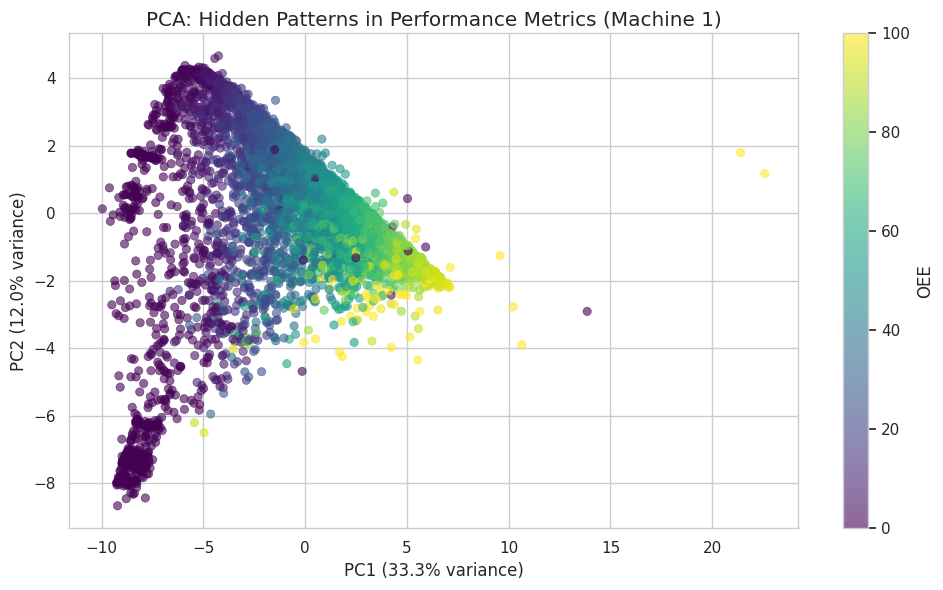


Top Features Driving PC1 (Main Pattern):
produce             0.974790
processed           0.974790
avgprocessspeed     0.974790
netoperatingtime    0.965425
speed_ratio_avg     0.961730
dtype: float64

Top Features Driving PC2 (Secondary Pattern):
equipmentdowntime    0.862445
downtime_ratio       0.821450
induceddowntime      0.811914
effectivetime        0.756892
planneddowntime     -0.613868
dtype: float64

=== Non-Linear Relationships ===


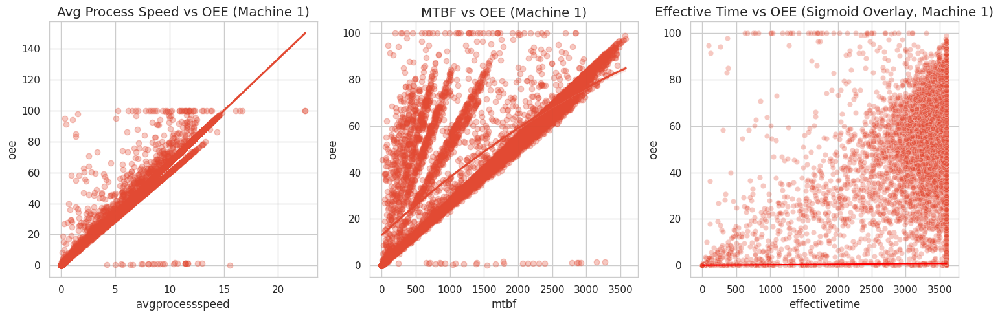

In [ ]:
# =============================================
# Hidden Relationships Analysis (Final Optimized)
# =============================================
def analyze_hidden_patterns(df_m1):
    import seaborn as sns
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd
    from sklearn.decomposition import PCA
    from sklearn.preprocessing import StandardScaler
    from scipy.special import expit

    # Set up the plotting style
    plt.style.use('ggplot')
    sns.set_style("whitegrid")

    print("\n=== Hidden Pattern Analysis: Machine 1 ===")

    # 1. Interaction Effects
    print("\n=== Interaction Effects ===")
    df_m1['speed_quality'] = np.clip(df_m1['speed_ratio_avg'] * df_m1['qualityrate'], 0, 1.5)
    df_m1['downtime_eff'] = np.clip(df_m1['downtime_ratio'] * df_m1['efficiency'], 0, 1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    sns.scatterplot(data=df_m1, x='speed_ratio_avg', y='qualityrate',
                    hue='oee', size='oee', sizes=(20, 200), ax=ax1)
    ax1.set_title('Speed Ratio × Quality Rate vs OEE (Machine 1)')

    sns.scatterplot(data=df_m1, x='downtime_ratio', y='efficiency',
                    hue='oee', size='oee', sizes=(20, 200), ax=ax2)
    ax2.set_title('Downtime Ratio × Efficiency vs OEE (Machine 1)')

    plt.tight_layout()
    plt.show()

    # 2. PCA with Feature Loadings
    print("\n=== Principal Component Analysis ===")
    numerical_cols = df_m1.select_dtypes(include=[np.number]).columns
    features = [col for col in numerical_cols if col not in
                ['oee', 'operationalavailability', 'qualityrate', 'performance_rate']]

    X = StandardScaler().fit_transform(df_m1[features].fillna(0))
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(X)

    # PCA scatterplot
    plt.figure(figsize=(10, 6))
    plt.scatter(principal_components[:, 0], principal_components[:, 1],
                c=df_m1['oee'], cmap='viridis', alpha=0.6)
    plt.colorbar(label='OEE')
    plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)')
    plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)')
    plt.title('PCA: Hidden Patterns in Performance Metrics (Machine 1)')
    plt.tight_layout()
    plt.show()

    # Feature contributions to PCs
    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
    pc1_features = pd.Series(loadings[:, 0], index=features).sort_values(key=abs, ascending=False).head(5)
    pc2_features = pd.Series(loadings[:, 1], index=features).sort_values(key=abs, ascending=False).head(5)

    print("\nTop Features Driving PC1 (Main Pattern):")
    print(pc1_features)

    print("\nTop Features Driving PC2 (Secondary Pattern):")
    print(pc2_features)

    # 3. Non-Linear Relationships
    print("\n=== Non-Linear Relationships ===")
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

    sns.regplot(data=df_m1, x=np.clip(df_m1['avgprocessspeed'], 0, df_m1['designspeed']*1.5),
                y='oee', lowess=True, ax=ax1, scatter_kws={'alpha': 0.3})
    ax1.set_title('Avg Process Speed vs OEE (Machine 1)')

    sns.regplot(data=df_m1, x='mtbf', y='oee', order=2, ax=ax2, scatter_kws={'alpha': 0.3})
    ax2.set_title('MTBF vs OEE (Machine 1)')

    x_vals = np.linspace(df_m1['effectivetime'].min(), df_m1['effectivetime'].max(), 100)
    sns.scatterplot(data=df_m1, x='effectivetime', y='oee', ax=ax3, alpha=0.3)
    ax3.plot(x_vals, expit((x_vals - x_vals.mean()) / x_vals.std()), color='red')
    ax3.set_title('Effective Time vs OEE (Sigmoid Overlay, Machine 1)')

    plt.tight_layout()
    plt.show()

# Run it
analyze_hidden_patterns(df_m1)


In [ ]:
print(df_m1.columns.tolist())


['timestamp', 'availability', 'operationalavailability', 'efficiency', 'oee', 'qualityrate', 'runningtime', 'mtbf', 'mttr', 'rejectionrate', 'processed', 'produce', 'workingtime', 'netoperatingtime', 'effectivetimeexpectedproduction', 'internaldowntime', 'internalstops', 'nodatatime', 'externaltime', 'planneddowntime', 'productiontimeexpectedproduction', 'induceddowntime', 'reactiontime', 'equipmentdowntime', 'effectivetime', 'designspeed', 'avgprocessspeed', 'maxprocessspeed', 'minprocessspeed', 'rank', 'recipe', 'MachineSpeed_max', 'machine', 'hour', 'month', 'year', 'day_of_week', 'speed_deviation', 'speed_ratio_avg', 'speed_ratio_max', 'downtime_ratio', 'effective_quality', 'speed_deviation_last_6h', 'speed_deviation_last_12h', 'performance_rate', 'day_name', 'speed_quality', 'downtime_eff']


Addressing multicollinearity: Avoiding redundant features by dropping some in favor of representative ones, or using PCA to combine them – this insight was applied in the feature selection step of modeling.

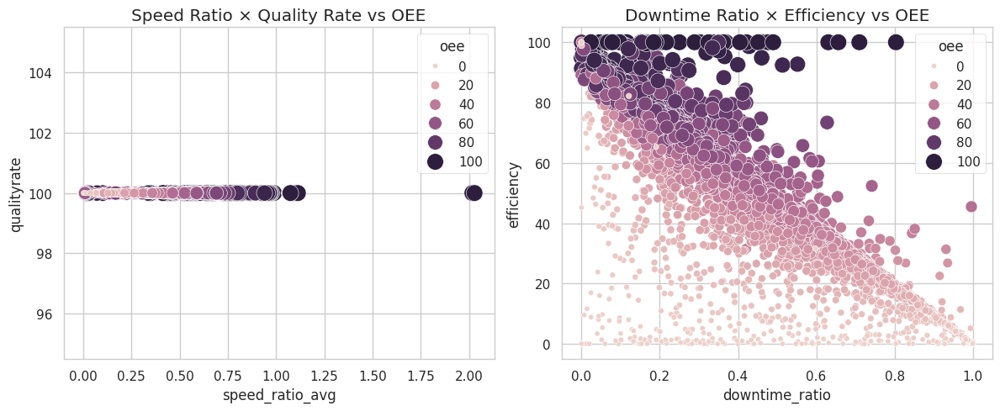


=== Principal Component Analysis (Cleaned Feature Set) ===


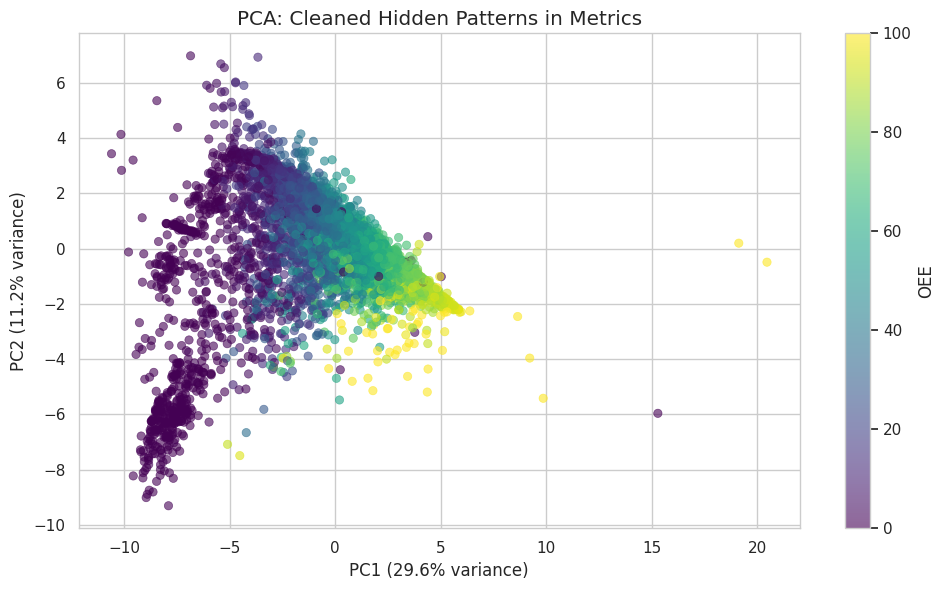


Top Features Driving PC1:
avgprocessspeed    0.947351
speed_deviation    0.941535
speed_ratio_avg    0.941535
runningtime        0.928220
efficiency         0.897468
dtype: float64

Top Features Driving PC2:
equipmentdowntime    0.831403
downtime_ratio       0.782288
effectivetime        0.695616
workingtime          0.557906
downtime_eff         0.533999
dtype: float64

=== Non-Linear Relationships ===


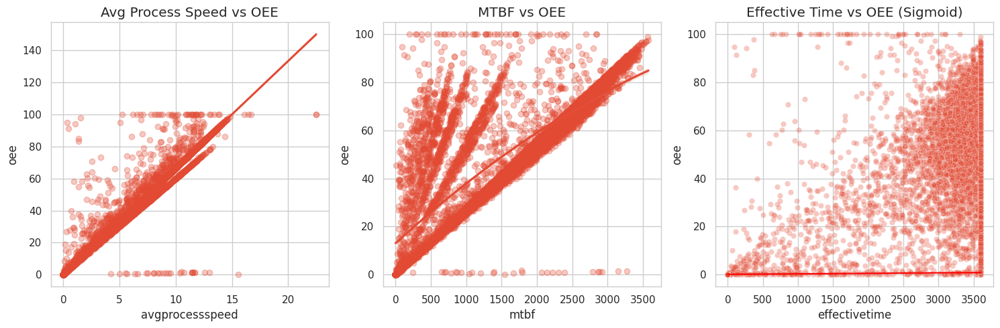

In [ ]:
# Key Improvements:
# Drops collinear features like processed, produce, induceddowntime >	Reduces noise and redundancy
# Keeps avgprocessspeed, equipmentdowntime, downtime_ratio, efficiency > More interpretable and stable
# PCA on cleaned set > Captures patterns more clearly
# Nonlinear overlays preserved > Highlights saturation or decay patterns

def analyze_hidden_patterns_cleaned(df_m1):
    import seaborn as sns
    import matplotlib.pyplot as plt
    import numpy as np
    import pandas as pd
    from sklearn.decomposition import PCA
    from sklearn.preprocessing import StandardScaler
    from scipy.special import expit

    # Add interaction features if missing
    if 'speed_quality' not in df_m1.columns:
        df_m1['speed_quality'] = np.clip(df_m1['speed_ratio_avg'] * df_m1['qualityrate'], 0, 1.5)
    if 'downtime_eff' not in df_m1.columns:
        df_m1['downtime_eff'] = np.clip(df_m1['downtime_ratio'] * df_m1['efficiency'], 0, 1)

    plt.style.use('ggplot')
    sns.set_style("whitegrid")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    sns.scatterplot(data=df_m1, x='speed_ratio_avg', y='qualityrate',
                    hue='oee', size='oee', sizes=(20, 200), ax=ax1)
    ax1.set_title('Speed Ratio × Quality Rate vs OEE')

    sns.scatterplot(data=df_m1, x='downtime_ratio', y='efficiency',
                    hue='oee', size='oee', sizes=(20, 200), ax=ax2)
    ax2.set_title('Downtime Ratio × Efficiency vs OEE')

    plt.tight_layout()
    plt.show()

    # 2. PCA on De-Collinearized Set
    print("\n=== Principal Component Analysis (Cleaned Feature Set) ===")
    numerical_cols = df_m1.select_dtypes(include=[np.number]).columns

    # Manually filter out redundant features
    redundant = [
        'processed', 'produce', 'netoperatingtime',
        'induceddowntime', 'planneddowntime', 'externaltime'
    ]
    exclude = ['oee', 'performance_rate', 'operationalavailability', 'qualityrate']
    features = [col for col in numerical_cols if col not in redundant + exclude]

    # PCA
    X = StandardScaler().fit_transform(df_m1[features].fillna(0))
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(X)

    # Scatterplot of PCA
    plt.figure(figsize=(10, 6))
    plt.scatter(principal_components[:, 0], principal_components[:, 1],
                c=df_m1['oee'], cmap='viridis', alpha=0.6)
    plt.colorbar(label='OEE')
    plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)')
    plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)')
    plt.title('PCA: Cleaned Hidden Patterns in Metrics')
    plt.tight_layout()
    plt.show()

    # Top contributing features to PCs
    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
    pc1_features = pd.Series(loadings[:, 0], index=features).sort_values(key=abs, ascending=False).head(5)
    pc2_features = pd.Series(loadings[:, 1], index=features).sort_values(key=abs, ascending=False).head(5)

    print("\nTop Features Driving PC1:")
    print(pc1_features)

    print("\nTop Features Driving PC2:")
    print(pc2_features)

    # 3. Nonlinear Trends
    print("\n=== Non-Linear Relationships ===")
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

    sns.regplot(data=df_m1, x=np.clip(df_m1['avgprocessspeed'], 0, df_m1['designspeed']*1.5),
                y='oee', lowess=True, ax=ax1, scatter_kws={'alpha': 0.3})
    ax1.set_title('Avg Process Speed vs OEE')

    sns.regplot(data=df_m1, x='mtbf', y='oee', order=2, ax=ax2, scatter_kws={'alpha': 0.3})
    ax2.set_title('MTBF vs OEE')

    x_vals = np.linspace(df_m1['effectivetime'].min(), df_m1['effectivetime'].max(), 100)
    sns.scatterplot(data=df_m1, x='effectivetime', y='oee', ax=ax3, alpha=0.3)
    ax3.plot(x_vals, expit((x_vals - x_vals.mean()) / x_vals.std()), color='red')
    ax3.set_title('Effective Time vs OEE (Sigmoid)')

    plt.tight_layout()
    plt.show()

# Run this after preparing
analyze_hidden_patterns_cleaned(df_m1)

### 4.2 | Defining Normal vs. Anomalous Operating Conditions (Based on Machine 1)

##### Rule-Based

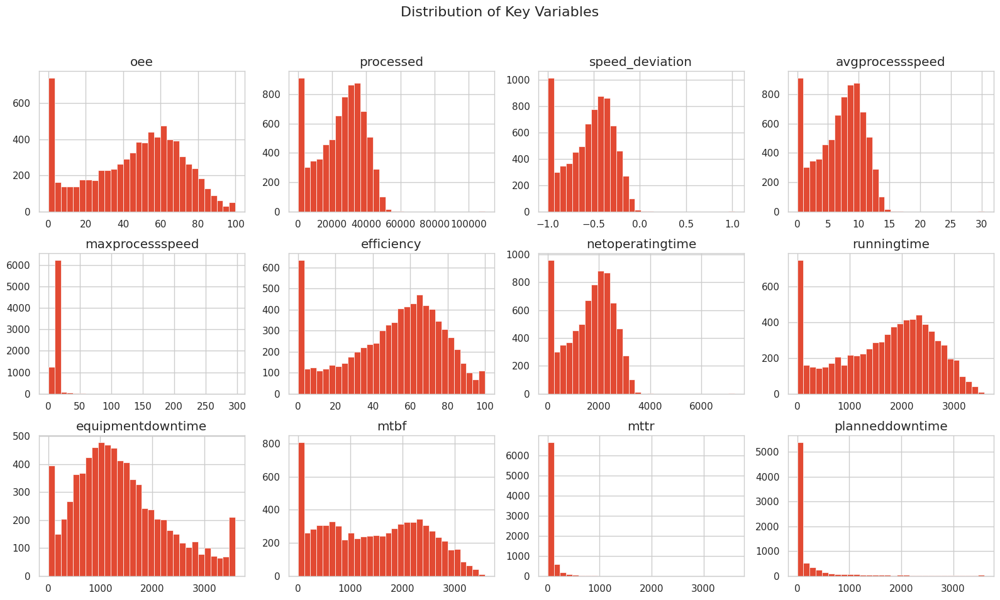

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select variables of interest
columns_to_plot = [
    'oee', 'processed', 'speed_deviation',
    'avgprocessspeed', 'maxprocessspeed', 'efficiency',
    'netoperatingtime', 'runningtime','equipmentdowntime',
    'mtbf', 'mttr', 'planneddowntime',
]

# Plot histograms
df_m1[columns_to_plot].hist(bins=30, figsize=(16, 10), layout=(3, 4))
plt.suptitle('Distribution of Key Variables', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [ ]:
# STEP 1: Define binary flags
df_m1["is_stopped_unexpectedly"] = (df_m1["runningtime"] == 0) & (df_m1["workingtime"] >= 3600) & (df_m1["planneddowntime"] == 0)
df_m1["is_planned_stop"] = (df_m1["workingtime"] < 3600) | (df_m1["planneddowntime"] > 0)
df_m1["is_running_but_no_output"] = (df_m1["runningtime"] > 0) & (df_m1["processed"] == 0)
df_m1["is_underperforming"] = (df_m1["oee"] < 30) & (df_m1["runningtime"] > 0)
df_m1["is_low_speed"] = df_m1["avgprocessspeed"] < 5
df_m1["is_fully_stopped"] = (
    (df_m1["runningtime"] == 0) &
    (df_m1["processed"] == 0) &
    (df_m1["availability"] == 0) &
    (df_m1["oee"] == 0)
)

df_m1['is_normal'] = (
    (df_m1['oee'] >= 40) &
    (df_m1['efficiency'] >= 50) &
    (df_m1['processed'] >= 20000) &
    (df_m1['speed_deviation'].between(-0.6, -0.2)) &
    (df_m1['avgprocessspeed'].between(5, 12)) &
    (df_m1['netoperatingtime'] > 1000) &
    (df_m1['runningtime'] > 1000) &
    (df_m1['equipmentdowntime'] < 1500) &
    (df_m1['mttr'] < 1000)
)


# STEP 2: Create a final label column for interpretability
def classify_row(row):
    if row["is_stopped_unexpectedly"]:
        return "Stopped Unexpectedly"
    elif row["is_planned_stop"]:
        return "Planned Downtime"
    elif row["is_running_but_no_output"]:
        return "Running, No Output"
    elif row["is_underperforming"]:
        return "Underperforming"
    else:
        return "Normal Operation"

df_m1["status_label"] = df_m1.apply(classify_row, axis=1)

df_m1["is_anomaly"] = df_m1["status_label"].isin([
    "Stopped Unexpectedly",
    "Running, No Output",
    "Underperforming"
])

In [ ]:
# Find rows labeled as both normal and anomaly (should be zero)
conflict_rows = df_m1[df_m1["is_normal"] & df_m1["is_anomaly"]]
print(f" Conflicting rows (normal AND anomaly): {len(conflict_rows)}")


 Conflicting rows (normal AND anomaly): 0


In [ ]:
# 1. Summary count per machine status
status_counts = df_m1["status_label"].value_counts().reset_index()
status_counts.columns = ["status_label", "count"]
status_counts["percentage"] = round((status_counts["count"] / len(df_m1)) * 100, 2)

print("Machine Status Breakdown:")
display(status_counts)

# 2. Anomaly flag counts
anomaly_counts = df_m1["is_anomaly"].value_counts().reset_index()
anomaly_counts.columns = ["is_anomaly", "count"]
anomaly_counts["percentage"] = round((anomaly_counts["count"] / len(df_m1)) * 100, 2)

print("\nAnomaly Flag Summary:")
display(anomaly_counts)

# 3. Optional: summary of key metrics by each status_label
print("\nSummary stats per status:")
metrics = ['oee', 'efficiency', 'processed', 'runningtime', 'workingtime','avgprocessspeed']
summary_by_status = df_m1.groupby("status_label")[metrics].describe().round(2)
display(summary_by_status)


Machine Status Breakdown:


,status_label,count,percentage
0,Normal Operation,3471,45.30
1,Planned Downtime,3243,42.33
2,Underperforming,850,11.09
3,Stopped Unexpectedly,98,1.28



Anomaly Flag Summary:


,is_anomaly,count,percentage
0,False,6714,87.63
1,True,948,12.37



Summary stats per status:


oee                                            \
                       count   mean    std    min    25%    50%    75%   
status_label                                                             
Normal Operation      3471.0  59.14  14.97  30.01  47.57  59.40  69.88   
Planned Downtime      3243.0  41.67  27.26   0.00  18.98  45.16  62.37   
Stopped Unexpectedly    98.0   0.00   0.00   0.00   0.00   0.00   0.00   
Underperforming        850.0  14.71   9.45   0.02   6.05  15.31  22.81   

                             efficiency                                     \
                         max      count   mean    std    min    25%    50%   
status_label                                                                 
Normal Operation       98.89     3471.0  61.00  15.29  30.01  49.30  61.45   
Planned Downtime      100.00     3243.0  50.11  28.78   0.00  30.09  55.34   
Stopped Unexpectedly    0.00       98.0   0.01   0.03   0.00   0.00   0.00   
Underperforming        29.98      850.0  17.85  14.97   0.02   7.48  16.62   

                                    processed                               \
                        75%     max     count      mean       std      min   
status_label                                                                 
Normal Operation      72.14  100.00    3471.0  32228.61   8090.46  16204.0   
Planned Downtime      72.00  100.00    3243.0  21445.89  14318.84      0.0   
Stopped Unexpectedly   0.00    0.21      98.0      3.19     16.35      0.0   
Underperforming       25.61  100.00     850.0   8708.31   6363.32      9.0   

                                                          runningtime  \
                          25%      50%      75%       max       count   
status_label                                                            
Normal Operation      25982.5  32389.0  38055.5   53401.0      3471.0   
Planned Downtime       8946.5  23275.0  32891.5  109560.0      3243.0   
Stopped Unexpectedly      0.0      0.0      0.0     115.0        98.0   
Underperforming        3701.0   8591.0  13040.5   46735.0       850.0   

                                                                        \
                         mean     std     min     25%     50%      75%   
status_label                                                             
Normal Operation      2205.87  548.61  1062.0  1796.0  2218.0  2616.00   
Planned Downtime      1414.51  946.98     0.0   569.0  1520.0  2189.00   
Stopped Unexpectedly     0.00    0.00     0.0     0.0     0.0     0.00   
Underperforming        596.41  438.40     1.0   254.0   588.0   894.75   

                             workingtime                                   \
                         max       count     mean     std     min     25%   
status_label                                                                
Normal Operation      3577.0      3471.0  3600.00    0.00  3600.0  3600.0   
Planned Downtime      3431.0      3243.0  3250.39  679.58     2.0  3171.5   
Stopped Unexpectedly     0.0        98.0  3600.00    0.00  3600.0  3600.0   
Underperforming       3270.0       850.0  3600.00    0.00  3600.0  3600.0   

                                             avgprocessspeed                   \
                         50%     75%     max           count  mean   std  min   
status_label                                                                    
Normal Operation      3600.0  3600.0  3600.0          3471.0  8.95  2.25  4.5   
Planned Downtime      3600.0  3600.0  3600.0          3243.0  5.96  3.98  0.0   
Stopped Unexpectedly  3600.0  3600.0  3600.0            98.0  0.00  0.00  0.0   
Underperforming       3600.0  3600.0  3600.0           850.0  2.42  1.77  0.0   

                                                
                       25%   50%    75%    max  
status_label                                    
Normal Operation      7.22  9.00  10.57  14.83  
Planned Downtime      2.49  6.47   9.14  30.43  
Stopped Unexpectedly  0.00  

In [ ]:
# Crosstab to compare
comparison = pd.crosstab(df_m1["is_anomaly"], df_m1["status_label"])
print("\n Anomaly vs Status Label:")
display(comparison)


 Anomaly vs Status Label:


status_label,Normal Operation,Planned Downtime,Stopped Unexpectedly,Underperforming
is_anomaly,,,,
False,3471,3243,0,0
True,0,0,98,850


In [ ]:
# Specific conditions like OEE = 0:
df_zero_oee_eff = df_m1[(df_m1['oee'] == 0) | (df_m1['efficiency'] == 0)]
print(f"\nTotal rows with OEE or Efficiency = 0: {len(df_zero_oee_eff)}")
print("Of those, how many are labeled fully stopped:")
print(df_zero_oee_eff["is_fully_stopped"].sum())



Total rows with OEE or Efficiency = 0: 402
Of those, how many are labeled fully stopped:
351


##### PCA + KMeans
A solid strategy to test your hypothesis and profile machine states based on behavioral patterns (e.g., stopped, underperforming, running smoothly, etc.).*texto en cursiva*

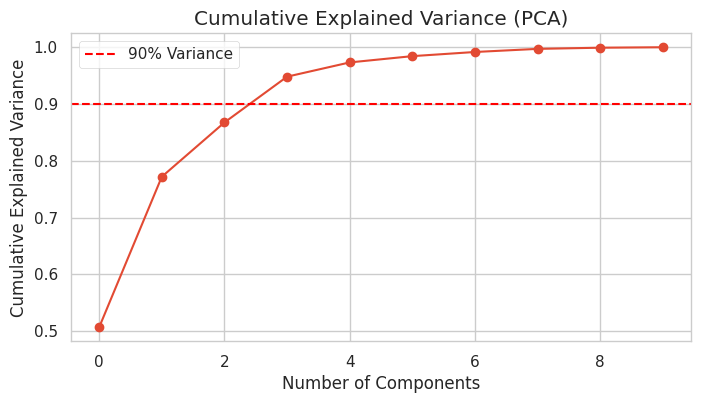

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Use cleaned and non-redundant features
features = [
    # --- Speed / Performance ---
    'avgprocessspeed',          # Best single indicator of real speed
    'speed_ratio_avg',          # Normalized vs design speed
    'efficiency',               # Clean performance ratio (less collinear than OEE)

    # --- Downtime / Availability ---
    'downtime_ratio',           # Best normalized downtime metric
    'equipmentdowntime',        # Representative absolute downtime measure

    # --- Maintenance / Reliability ---
    'mtbf',                     # Mean Time Between Failures
    'mttr',                     # Mean Time To Repair

    # --- Time Utilization ---
    'effectivetime',            # Reflects time actually contributing to production

    # --- Composite Engineered Features ---
    'speed_quality',            # Interaction: speed × qualityrate
    'downtime_eff'              # Interaction: downtime × efficiency

    # add more if needed but avoid: processed, produce, netoperatingtime, planneddowntime...
]


X = df_m1[features].fillna(0)
X_scaled = StandardScaler().fit_transform(X)

# Step 2: PCA without setting n_components (full decomposition)
pca = PCA()
pca.fit(X_scaled)

# Step 3: Plot explained variance
plt.figure(figsize=(8, 4))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.axhline(0.90, color='red', linestyle='--', label='90% Variance')
plt.title("Cumulative Explained Variance (PCA)")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Scale + PCA with 3 components
X_scaled = StandardScaler().fit_transform(df_m1[features].fillna(0))
X_pca = PCA(n_components=3).fit_transform(X_scaled)

# Cluster operating states
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=42)
df_m1["pca_cluster"] = kmeans.fit_predict(X_pca)

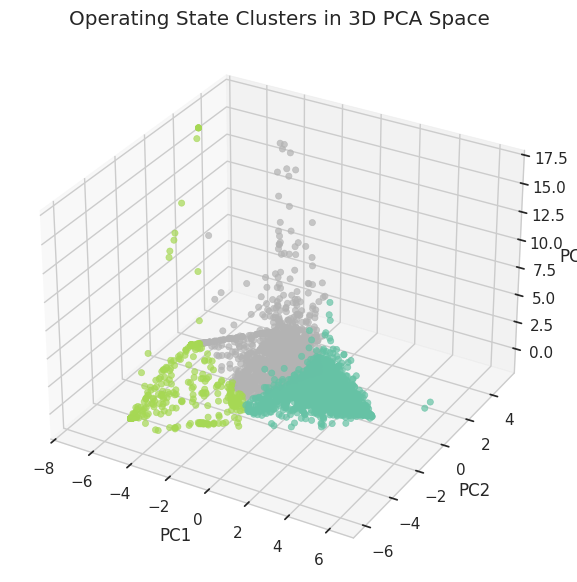

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2],
           c=df_m1['pca_cluster'], cmap='Set2', alpha=0.7)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title("Operating State Clusters in 3D PCA Space")
plt.show()

In [ ]:
# Step 1: Fit PCA and retain object
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# Step 2: KMeans clustering (unchanged)
kmeans = KMeans(n_clusters=3, random_state=42)
df_m1["pca_cluster"] = kmeans.fit_predict(X_pca)

# Step 3: Top contributing features (explaining each PC)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

pc1_features = pd.Series(loadings[:, 0], index=features).sort_values(key=abs, ascending=False).head(5)
pc2_features = pd.Series(loadings[:, 1], index=features).sort_values(key=abs, ascending=False).head(5)
pc3_features = pd.Series(loadings[:, 2], index=features).sort_values(key=abs, ascending=False).head(5)

print("\nTop Features Driving PC1:")
print(pc1_features)

print("\nTop Features Driving PC2:")
print(pc2_features)

print("\nTop Features Driving PC3:")
print(pc3_features)


Top Features Driving PC1:
avgprocessspeed    0.958602
speed_ratio_avg    0.946873
efficiency         0.937567
mtbf               0.859455
speed_quality      0.645148
dtype: float64

Top Features Driving PC2:
equipmentdowntime    0.810122
effectivetime        0.789728
downtime_ratio       0.778780
downtime_eff         0.615685
speed_quality        0.556246
dtype: float64

Top Features Driving PC3:
mttr                 0.960371
downtime_eff        -0.088163
speed_quality       -0.072208
equipmentdowntime   -0.068637
avgprocessspeed      0.068085
dtype: float64


In [ ]:
cluster_map = {
    0: "Normal",
    1: "Degraded",
    2: "Downtime"
}
df_m1["pca_cluster_label"] = df_m1["pca_cluster"].map(cluster_map)

In [ ]:
display(df_m1.groupby("pca_cluster")["oee"].describe())


,count,mean,std,min,25%,50%,75%,max
pca_cluster,,,,,,,,
0,4479.0,63.027777,14.736167,0.0,54.062963,62.633849,72.540741,100.000000
1,602.0,1.578899,6.555387,0.0,0.000000,0.000000,0.399108,94.814815
2,2581.0,26.994484,14.535333,0.0,15.420370,28.650000,38.979630,65.310789


In [ ]:
pd.crosstab(df_m1["status_label"], df_m1["pca_cluster_label"])

pca_cluster_label,Degraded,Downtime,Normal
status_label,,,
Normal Operation,0,815,2656
Planned Downtime,477,960,1806
Stopped Unexpectedly,96,2,0
Underperforming,29,804,17


In [ ]:
# Crosstab to compare manual vs PCA+KMeans
comparison = pd.crosstab(df_m1["is_anomaly"], df_m1["pca_cluster_label"])
print("\n Anomaly vs PCA Cluster Label:")
display(comparison)


 Anomaly vs PCA Cluster Label:


pca_cluster_label,Degraded,Downtime,Normal
is_anomaly,,,
False,477,1775,4462
True,125,806,17


In [ ]:
cluster_summary = df_m1.groupby("pca_cluster_label")[[
    "oee", "efficiency", "avgprocessspeed", "processed", "equipmentdowntime",
    "downtime_ratio", "mtbf", "mttr",
    "effectivetime", "speed_ratio_avg",
    "speed_quality", "downtime_eff"
]].mean().round(2)

display(cluster_summary)


,oee,efficiency,avgprocessspeed,processed,equipmentdowntime,downtime_ratio,mtbf,mttr,effectivetime,speed_ratio_avg,speed_quality,downtime_eff
pca_cluster_label,,,,,,,,,,,,
Degraded,1.58,10.81,0.15,544.63,927.05,0.30,36.26,55.95,964.71,0.01,0.30,0.18
Downtime,26.99,29.39,4.00,14398.38,2241.40,0.64,780.53,101.40,3214.63,0.26,1.45,0.99
Normal,63.03,68.56,9.39,33785.85,981.44,0.28,2011.86,37.30,3262.35,0.61,1.50,1.00


In [ ]:
match = df_m1[
    (df_m1["is_anomaly"]) & (df_m1["pca_cluster_label"] == "Degraded")
]
precision = len(match) / df_m1["is_anomaly"].sum()
print(f"\n Precision of anomaly alignment with cluster: {precision:.2%}")


 Precision of anomaly alignment with cluster: 13.19%


#### Machine Learning (only performance metrics (Machine 1) - Insights for Section 5)


Selected 34 features:
['availability', 'efficiency', 'runningtime', 'mtbf', 'mttr', 'workingtime', 'effectivetimeexpectedproduction', 'internaldowntime', 'internalstops', 'nodatatime', 'externaltime', 'planneddowntime', 'productiontimeexpectedproduction', 'induceddowntime', 'equipmentdowntime', 'effectivetime', 'designspeed', 'maxprocessspeed', 'minprocessspeed', 'recipe', 'MachineSpeed_max', 'hour', 'month', 'year', 'day_of_week', 'speed_deviation', 'speed_ratio_avg', 'speed_ratio_max', 'downtime_ratio', 'speed_deviation_last_6h', 'speed_deviation_last_12h', 'speed_quality', 'downtime_eff', 'pca_cluster']


/tmp/ipython-input-3818867415.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=importance.head(10), x='Importance', y='Feature', palette='Blues_d')


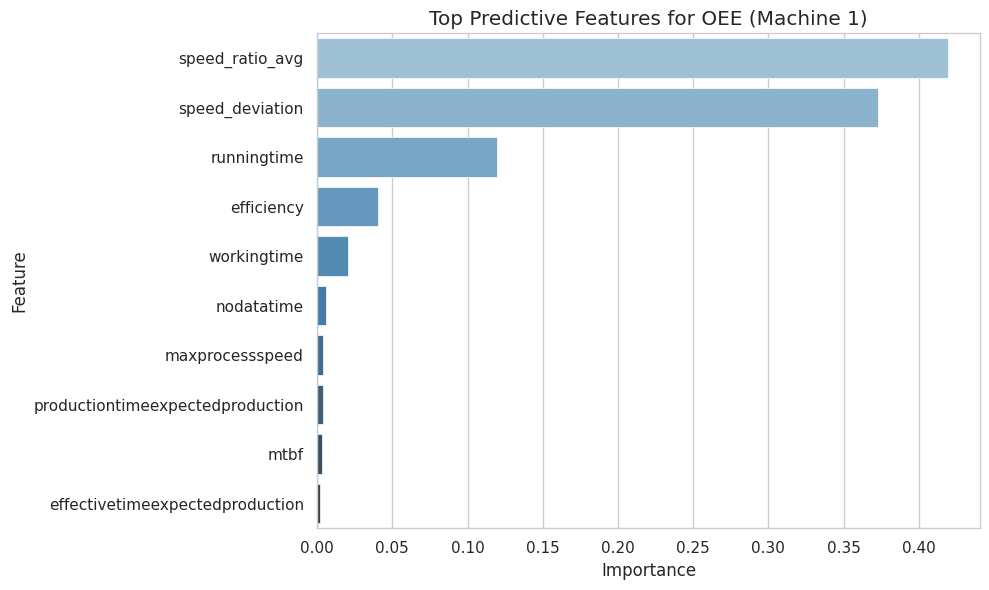


Model Evaluation (Machine 1):
R² Score: 0.964
RMSE: 4.746


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

def run_ml_analysis_machine1(df_m1):
    # 1. Clean copy and drop redundant/circular features
    df = df_m1.copy()
    drop_cols = ['operationalavailability', 'qualityrate', 'performance_rate']
    df = df.drop(columns=[col for col in drop_cols if col in df.columns], errors='ignore')

    # 2. Feature Selection based on correlation with OEE
    numerical_df = df.select_dtypes(include=[np.number])
    if 'oee' not in numerical_df.columns:
        raise ValueError("Missing target column: 'oee'")

    corr_matrix = numerical_df.corr()
    features = [col for col in numerical_df.columns if (abs(corr_matrix.loc[col, 'oee']) < 0.95 and col != 'oee')]

    print(f"\nSelected {len(features)} features:")
    print(features)

    # 3. Train-Test Split + Model
    X = df[features].fillna(0)
    y = df['oee']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)

    # 4. Feature Importance
    importance = pd.DataFrame({
        'Feature': X.columns,
        'Importance': rf.feature_importances_
    }).sort_values('Importance', ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(data=importance.head(10), x='Importance', y='Feature', palette='Blues_d')
    plt.title('Top Predictive Features for OEE (Machine 1)')
    plt.tight_layout()
    plt.show()

    # 5. Evaluation
    y_pred = rf.predict(X_test)
    print(f"\nModel Evaluation (Machine 1):")
    print(f"R² Score: {r2_score(y_test, y_pred):.3f}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.3f}")

    return importance, rf, X_test

# Run the analysis for Machine 1
feature_importance_m1, rf_model_m1, X_test_m1 = run_ml_analysis_machine1(df_m1)



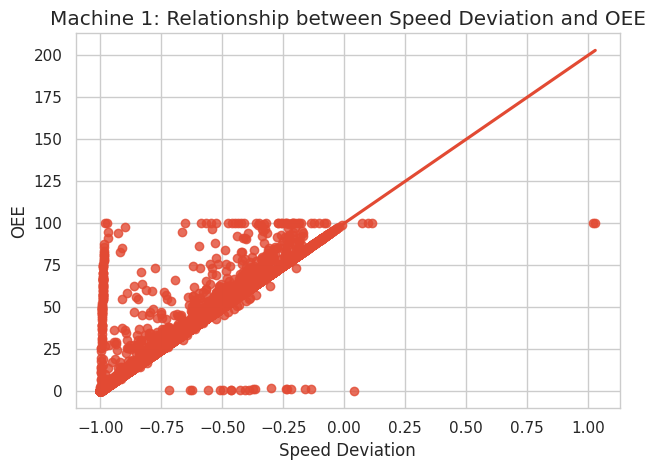

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.regplot(data=df_m1, x='speed_deviation', y='oee', lowess=True)
plt.title('Machine 1: Relationship between Speed Deviation and OEE')
plt.xlabel('Speed Deviation')
plt.ylabel('OEE')
plt.tight_layout()
plt.show()


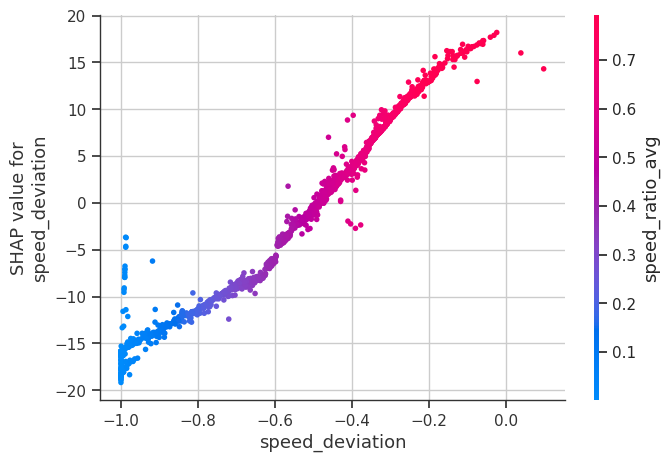

In [ ]:
import shap

# 1. SHAP explainer
explainer = shap.TreeExplainer(rf_model_m1)

# 2. Compute SHAP values
shap_values = explainer.shap_values(X_test_m1)

# 3. Dependence plot for a specific feature
shap.dependence_plot('speed_deviation', shap_values, X_test_m1)

#### Insights (Only Machine 1)

In [ ]:
def generate_insights_machine1(df_m1, feature_importance):
    if not isinstance(df_m1, pd.DataFrame):
        raise ValueError("First argument must be a DataFrame")
    if not isinstance(feature_importance, pd.DataFrame):
        raise ValueError("Second argument must be feature importance DataFrame")

    print("=== Key Insights for Machine 1 ===")

    # Top Features
    top_features = feature_importance.head(3)
    print("\nTop 3 Predictive Factors for OEE:")
    for i, (feat, imp) in enumerate(zip(top_features['Feature'], top_features['Importance']), 1):
        print(f"{i}. {feat} (importance: {imp:.3f})")

    # Peak time insight
    if 'timestamp' in df_m1.columns:
        df_m1['hour'] = df_m1['timestamp'].dt.hour
        peak_hour = df_m1.groupby('hour')['oee'].mean().idxmax()
        print(f"\nPeak OEE Hour for Machine 1: {peak_hour}:00")

    print("\n=== Recommendations for Machine 1 ===")
    print(f"1. Focus on optimizing '{top_features.iloc[0]['Feature']}' (highest impact on OEE)")
    if 'timestamp' in df_m1.columns:
        print(f"2. Schedule critical tasks around {peak_hour}:00 for best performance")

# Example call
generate_insights_machine1(df_m1, feature_importance_m1)


=== Key Insights for Machine 1 ===

Top 3 Predictive Factors for OEE:
1. speed_ratio_avg (importance: 0.420)
2. speed_deviation (importance: 0.373)
3. runningtime (importance: 0.119)

Peak OEE Hour for Machine 1: 4:00

=== Recommendations for Machine 1 ===
1. Focus on optimizing 'speed_ratio_avg' (highest impact on OEE)
2. Schedule critical tasks around 4:00 for best performance


## 3.4 | Merging Strategy

> Note: Perf Original had 18,584 rows but we removed NaN and inf values at the begining of performance dataset analysis:
* Number of NaN values: 272
* Number of inf/-inf values in numeric columns: 10
* So, the cleaned DataFrame shape: (18320, 42)

### "Time Grid" Extension (extended coverage)

In [ ]:
df

,timestamp,availability,operationalavailability,efficiency,oee,qualityrate,runningtime,mtbf,mttr,rejectionrate,processed,produce,workingtime,netoperatingtime,effectivetimeexpectedproduction,internaldowntime,internalstops,nodatatime,externaltime,planneddowntime,productiontimeexpectedproduction,induceddowntime,reactiontime,equipmentdowntime,effectivetime,designspeed,avgprocessspeed,maxprocessspeed,minprocessspeed,rank,recipe,MachineSpeed_max,machine,hour,month,year,day_of_week,speed_deviation,speed_ratio_avg,speed_ratio_max,downtime_ratio,effective_quality,speed_deviation_last_6h,speed_deviation_last_12h,performance_rate,day_name
0,2024-01-29 09:00:00+00:00,95.276873,65.000000,77.157708,64.598148,100.0,2340,2340.0,116.0,0.0,34883,34883,3600,2325.533333,45210.0,116,1,0,320,266,50010,558,0,674,3014,15.000000,9.68972,15.01000,2.92667,1,2,90,machine1,9,1,2024,0,-0.354019,0.645981,1.000667,0.187222,100.0,-0.354019,-0.354019,99.381766,Monday
1,2024-01-29 10:00:00+00:00,80.035492,50.111111,59.257812,50.566667,100.0,1804,902.0,225.0,0.0,27306,27306,3600,1820.400000,46080.0,450,2,0,0,528,46080,818,0,1268,3072,15.000000,7.58500,15.02333,1.46000,1,2,90,machine1,10,1,2024,0,-0.494333,0.505667,1.001555,0.352222,100.0,-0.424176,-0.424176,100.909091,Monday
2,2024-01-29 11:00:00+00:00,100.000000,41.777778,49.653493,41.529630,100.0,1504,1504.0,0.0,0.0,22426,22426,3600,1495.066667,45165.0,0,0,0,589,0,54000,1507,0,1507,3011,15.000000,6.22945,14.96000,0.53000,1,2,90,machine1,11,1,2024,0,-0.584703,0.415297,0.997333,0.418611,100.0,-0.477685,-0.477685,99.406028,Monday
3,2024-01-29 12:00:00+00:00,0.000000,0.000000,0.000000,0.000000,100.0,0,0.0,0.0,0.0,0,0,3593,0.000000,0.0,0,0,0,3578,15,53670,0,0,0,0,15.000000,0.00000,0.00000,0.00000,1,2,90,machine1,12,1,2024,0,-1.000000,0.000000,0.000000,0.000000,100.0,-0.608264,-0.608264,NaN,Monday
4,2024-01-29 13:00:00+00:00,0.000000,0.000000,0.000000,0.000000,100.0,0,0.0,0.0,0.0,0,0,3546,0.000000,0.0,0,0,0,0,3546,0,0,0,0,0,15.000000,0.00000,0.00000,0.00000,1,2,75,machine1,13,1,2024,0,-1.000000,0.000000,0.000000,0.000000,100.0,-0.686611,-0.686611,NaN,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18579,2025-03-31 19:00:00+00:00,100.000000,49.638889,38.890000,38.890000,100.0,1787,1787.0,0.0,0.0,11667,11667,3600,1400.040000,30000.0,0,0,0,0,0,30000,1813,0,1813,3600,8.333333,3.24083,6.39667,0.08000,1,4,38,machine3,19,3,2025,0,-0.611100,0.388900,0.767600,0.503611,100.0,-0.535500,-0.627330,78.345831,Monday
18580,2025-03-31 20:00:00+00:00,100.000000,75.444444,58.570000,58.570000,100.0,2716,2716.0,0.0,0.0,17571,17571,3600,2108.520000,30000.0,0,0,0,0,0,30000,884,0,884,3600,8.333333,4.88083,6.39333,0.19667,1,4,38,machine3,20,3,2025,0,-0.414300,0.585700,0.767200,0.245556,100.0,-0.517500,-0.607964,77.633284,Monday
18581,2025-03-31 21:00:00+00:00,100.000000,48.250000,37.330000,37.330000,100.0,1737,1737.0,0.0,0.0,11199,11199,3600,1343.880000,30000.0,0,0,0,0,0,30000,1863,0,1863,3600,8.333333,3.11083,6.39667,2.03667,1,4,38,machine3,21,3,2025,0,-0.626700,0.373300,0.767600,0.517500,100.0,-0.539767,-0.574155,77.367876,Monday
18582,2025-03-31 22:00:00+00:00,100.000000,64.916667,50.496667,50.496667,100.0,2337,2337.0,0.0,0.0,15149,15149,3600,1817.880000,30000.0,0,0,0,0,0,30000,1263,0,1263,3600,8.333333,4.20806,6.40000,1.10000,1,4,38,machine3,22,3,2025,0,-0.495033,0.504967,0.768000,0.350833,100.0,-0.527880,-0.532191,77.786906,Monday


In [ ]:
# Generate full hourly grid from alarm and performance time ranges
min_ts = min(df_alarm_agg_events['createdAt'].min(), df['timestamp'].min())
max_ts = max(df_alarm_agg_events['createdAt'].max(), df['timestamp'].max())

timestamp_range = pd.date_range(start=min_ts, end=max_ts, freq='h', tz='UTC')
machines = df_alarm_agg_events['machine'].unique()

# Create complete timestamp x machine grid
df_timegrid = pd.MultiIndex.from_product(
    [timestamp_range, machines],
    names=['timestamp', 'machine']
).to_frame(index=False)

# Create strict match flag based on original performance records
strict_matches = set(df[['timestamp', 'machine']].itertuples(index=False, name=None))
df_timegrid['strict_match_flag'] = df_timegrid.apply(
    lambda row: 1 if (row['timestamp'], row['machine']) in strict_matches else 0, axis=1
)

print("Time grid with strict_match_flag created.")
display(df_timegrid)


Time grid with strict_match_flag created.


,timestamp,machine,strict_match_flag
0,2024-01-02 13:00:00+00:00,machine3,0
1,2024-01-02 13:00:00+00:00,machine2,0
2,2024-01-02 13:00:00+00:00,machine1,0
3,2024-01-02 14:00:00+00:00,machine3,0
4,2024-01-02 14:00:00+00:00,machine2,0
...,...,...,...
32716,2025-03-31 22:00:00+00:00,machine2,0
32717,2025-03-31 22:00:00+00:00,machine1,1
32718,2025-03-31 23:00:00+00:00,machine3,1
32719,2025-03-31 23:00:00+00:00,machine2,1


In [ ]:
# Merge df_perf_all and df_alarm_agg_events on the extended grid
df_perf_enriched_extended = (
    df_timegrid
    .merge(df, on=['timestamp', 'machine'], how='left')
    .merge(df_alarm_agg_events, left_on=['timestamp', 'machine'], right_on=['createdAt', 'machine'], how='left')
    .drop(columns=['createdAt'])  # drop duplicate key
)

display(df_perf_enriched_extended)

,timestamp,machine,strict_match_flag,availability,operationalavailability,efficiency,oee,qualityrate,runningtime,mtbf,mttr,rejectionrate,processed,produce,workingtime,netoperatingtime,effectivetimeexpectedproduction,internaldowntime,internalstops,nodatatime,externaltime,planneddowntime,productiontimeexpectedproduction,induceddowntime,reactiontime,equipmentdowntime,effectivetime,designspeed,avgprocessspeed,maxprocessspeed,minprocessspeed,rank,recipe,MachineSpeed_max,hour,month,year,day_of_week,speed_deviation,speed_ratio_avg,speed_ratio_max,downtime_ratio,effective_quality,speed_deviation_last_6h,speed_deviation_last_12h,performance_rate,day_name,Distinct_AlarmFaultId,Distinct_ValveNumber,Count_AlarmEvents,Sum_Recovery,Sum_Failure,Distinct_Valve_Failures,Shift_A_Failures,Shift_B_Failures,Shift_C_Failures,failure_flag,368_failure,368_recovery,394_failure,394_recovery,313_failure,313_recovery,329_failure,329_recovery,337_failure,337_recovery,combined_criticity,combined_criticity_desc,count_cycle_starts,count_cycle_starts_368,count_cycle_closed
0,2024-01-02 13:00:00+00:00,machine3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,High Risk,1.0,1.0,0.0
1,2024-01-02 13:00:00+00:00,machine2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2024-01-02 13:00:00+00:00,machine1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2024-01-02 14:00:00+00:00,machine3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2024-01-02 14:00:00+00:00,machine2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32716,2025-03-31 22:00:00+00:00,machine2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32717,2025-03-31 22:00:00+00:00,machine1,1,100.0,14.111111,12.864815,12.864815,100.0,508.0,508.0,0.0,0.0,6947.0,6947.0,3600.0,463.133333,54000.000000,0.0,0.0,0.0,0.0,0.0,54000.0,3092.0,0.0,3092.0,3600.0,15.000000,1.92972,9.70667,0.14333,1.0,168.0,90.0,22.0,3.0,2025.0,0.0,-0.871352,0.128648,0.647111,0.858889,100.0,-0.683015,-0.771156,91.167979,Monday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32718,2025-03-31 23:00:00+00:00,machine3,1,100.0,64.694444,50.056667,50.056667,100.0,2329.0,2329.0,0.0,0.0,15017.0,15017.0,3600.0,1802.040000,30000.000000,0.0,0.0,0.0,0.0,0.0,30000.0,1271.0,0.0,1271.0,3600.0,8.333333,4.17139,6.39667,1.16333,1.0,4.0,38.0,23.0,3.0,2025.0,0.0,-0.499433,0.500567,0.7676

### Data Quality Check

In [ ]:
# How many records were added to performance because they didn’t exist in the original dataset?

# Total rows in extended dataset
total_extended = len(df_perf_enriched_extended)

# Total rows in original performance dataset
total_original = len(df_perf_all)

# How many were added?
added_rows = total_extended - total_original

print(f"Total rows in extended dataset: {total_extended}")
print(f"Total original performance rows: {total_original}")
print(f"Newly added rows (not in original): {added_rows}")

Total rows in extended dataset: 32721
Total original performance rows: 18584
Newly added rows (not in original): 14137


In [ ]:
# How many alarm events from the aggregated alarm dataset matched with performance records?

# Records with alarm data (e.g., Count_AlarmEvents > 0)
alarm_present = df_perf_enriched_extended['Count_AlarmEvents'] > 0

# Of those, how many are also strict matches?
matched_alarms_with_perf = df_perf_enriched_extended[alarm_present & (df_perf_enriched_extended['strict_match_flag'] == 1)]

print(f"Alarm records with matching performance data: {len(matched_alarms_with_perf)}")

num_matched = len(matched_alarms_with_perf)
total_original = len(df_perf_all)

print(f"Percentage of performance records matched: {num_matched / total_original * 100:.2f}%")

# 3. How many alarms didn't match (before grid extension)?
# Alarm data present but no original performance record
unmatched_alarms = df_perf_enriched_extended[alarm_present & (df_perf_enriched_extended['strict_match_flag'] == 0)]

print(f"Alarm records that had no matching performance before grid extension: {len(unmatched_alarms)}")

Alarm records with matching performance data: 740
Percentage of performance records matched: 3.98%
Alarm records that had no matching performance before grid extension: 129


In [ ]:
qc_summary = pd.DataFrame({
    "Metric": [
        "Total extended dataset rows",
        "Total original performance rows",
        "Rows added by extension",
        "Alarm rows with performance match",
        "Alarm rows with no performance match"
    ],
    "Count": [
        total_extended,
        total_original,
        added_rows,
        len(matched_alarms_with_perf),
        len(unmatched_alarms)
    ]
})

display(qc_summary)

,Metric,Count
0,Total extended dataset rows,32721
1,Total original performance rows,18584
2,Rows added by extension,14137
3,Alarm rows with performance match,740
4,Alarm rows with no performance match,129


In [ ]:
# How many alarm records from the original alarm dataset matched with performance records?

# Create hour-based timestamp key in the raw alarm data
df_alarm_all['timestamp'] = df_alarm_all['createdAt'].dt.floor('h')

# Create a key for matching in performance
perf_keys = set(df_perf_all[['timestamp', 'machine']].itertuples(index=False, name=None))

# Step 3: Check which alarm rows match with performance rows
df_alarm_all['matches_perf'] = df_alarm_all.apply(
    lambda row: (row['timestamp'], row['machine']) in perf_keys, axis=1
)

# Step 4: Count matches
total_alarms = len(df_alarm_all)
matched_alarms = df_alarm_all['matches_perf'].sum()
unmatched_alarms = total_alarms - matched_alarms

print(f"Total alarm rows: {total_alarms}")
print(f"Matched alarm rows (in perf dataset): {matched_alarms}")
print(f"Unmatched alarm rows (no perf record before extension): {unmatched_alarms}")

Total alarm rows: 2842
Matched alarm rows (in perf dataset): 2346
Unmatched alarm rows (no perf record before extension): 496


In [ ]:
alarm_qc_summary = pd.DataFrame({
    'Type': ['Total alarms', 'Matched with performance', 'Unmatched with performance'],
    'Count': [total_alarms, matched_alarms, unmatched_alarms],
    'Pct': [f"{(x/total_alarms)*100:.2f}%" for x in [total_alarms, matched_alarms, unmatched_alarms]]
})

display(alarm_qc_summary)

,Type,Count,Pct
0,Total alarms,2842,100.00%
1,Matched with performance,2346,82.55%
2,Unmatched with performance,496,17.45%


In [ ]:
machines = df_perf_enriched_extended['machine'].unique()

qc_by_machine = []

for m in machines:
    df_m = df_perf_enriched_extended[df_perf_enriched_extended['machine'] == m]

    total_extended = len(df_m)
    total_original = len(df_perf_all[df_perf_all['machine'] == m])
    strict_matches = df_m['strict_match_flag'].sum()
    added_rows = total_extended - strict_matches

    alarm_present = df_m['Count_AlarmEvents'] > 0
    matched_alarms = df_m[alarm_present & (df_m['strict_match_flag'] == 1)]
    unmatched_alarms = df_m[alarm_present & (df_m['strict_match_flag'] == 0)]

    qc_by_machine.append({
        "Machine": m,
        "Total extended dataset rows": total_extended,
        "Total original performance rows": total_original,
        "Rows missing": added_rows,
        "Alarm rows with performance match": len(matched_alarms),
        "Alarm rows with no performance match": len(unmatched_alarms),
        "% matched alarms (of original perf)": f"{len(matched_alarms) / total_original * 100:.2f}%" if total_original > 0 else "-"
    })

df_qc_by_machine = pd.DataFrame(qc_by_machine)
display(df_qc_by_machine)

,Machine,Total extended dataset rows,Total original performance rows,Rows missing,Alarm rows with performance match,Alarm rows with no performance match,% matched alarms (of original perf)
0,machine3,10907,5523,5516,44,32,0.80%
1,machine2,10907,5292,5640,267,40,5.05%
2,machine1,10907,7769,3245,429,57,5.52%


In [ ]:
df_alarm_all['timestamp'] = df_alarm_all['createdAt'].dt.floor('h')

perf_keys = set(df_perf_all[['timestamp', 'machine']].itertuples(index=False, name=None))

df_alarm_all['matches_perf'] = df_alarm_all.apply(
    lambda row: (row['timestamp'], row['machine']) in perf_keys, axis=1
)

alarm_qc_by_machine = []

for m in df_alarm_all['machine'].unique():
    df_m = df_alarm_all[df_alarm_all['machine'] == m]
    total = len(df_m)
    matched = df_m['matches_perf'].sum()
    unmatched = total - matched

    alarm_qc_by_machine.append({
        "Machine": m,
        "Total alarms": total,
        "Matched with performance": matched,
        "Unmatched with performance": unmatched,
        "Matched %": f"{(matched / total) * 100:.2f}%",
        "Unmatched %": f"{(unmatched / total) * 100:.2f}%"
    })

df_alarm_qc_machine = pd.DataFrame(alarm_qc_by_machine)
display(df_alarm_qc_machine)

,Machine,Total alarms,Matched with performance,Unmatched with performance,Matched %,Unmatched %
0,machine3,102,68,34,66.67%,33.33%
1,machine2,1212,1052,160,86.80%,13.20%
2,machine1,1528,1226,302,80.24%,19.76%


## Strategic Focus Moving Forward

> Given that Machine 1 not only exhibits the highest data quality and completeness, but also concentrates the largest volume and variety of alarms across the dataset, our analysis adopts a Pareto-style (80/20) prioritization. By focusing on Machine 1 for exploratory modeling, we leverage the most information-rich and behaviorally diverse subset, enabling deeper insights into failure dynamics and OEE patterns. This targeted approach also helps minimize the influence of structural inconsistencies and missing signal present in Machine 2 and Machine 3, reducing the risk of noise and leakage in downstream modeling.

### Merged Performance + Agg Alarm Events - Machine 1

In [ ]:
# Make sure df_alarm_agg_events_m1 is a proper copy
df_alarm_agg_events_m1 = df_alarm_agg_events_m1.copy()
df_alarm_agg_events_m1['createdAt'] = pd.to_datetime(df_alarm_agg_events_m1['createdAt'], utc=True, errors='coerce')

# Same for df_m1
df_m1 = df_m1.copy()
df_m1['timestamp'] = pd.to_datetime(df_m1['timestamp'], utc=True, errors='coerce')

# Create full hourly grid between alarm and performance data
min_ts = min(df_alarm_agg_events_m1['createdAt'].min(), df_m1['timestamp'].min())
max_ts = max(df_alarm_agg_events_m1['createdAt'].max(), df_m1['timestamp'].max())

timestamp_range = pd.date_range(start=min_ts, end=max_ts, freq='h', tz='UTC')
df_timegrid = pd.DataFrame({'timestamp': timestamp_range})

# Mark which timestamps come from real performance records
strict_matches = set(df_m1['timestamp'])
df_timegrid['strict_match_flag'] = df_timegrid['timestamp'].isin(strict_matches).astype(int)

print("Time grid with strict_match_flag created:")
display(df_timegrid.head())


Time grid with strict_match_flag created:


,timestamp,strict_match_flag
0,2024-01-13 11:00:00+00:00,0
1,2024-01-13 12:00:00+00:00,0
2,2024-01-13 13:00:00+00:00,0
3,2024-01-13 14:00:00+00:00,0
4,2024-01-13 15:00:00+00:00,0


In [ ]:
# Merge df_m1 and df_alarm_agg_events_m1 directly (no time grid)
df_merge_m1 = (
    df_timegrid
    .merge(df_m1, on='timestamp', how='left')
    .merge(df_alarm_agg_events_m1,  left_on='timestamp', right_on='createdAt', how='left')
    .drop(columns=['createdAt'])  # Drop duplicate timestamp column from df_alarm_agg_events
)

display(df_merge_m1)

,timestamp,strict_match_flag,availability,operationalavailability,efficiency,oee,qualityrate,runningtime,mtbf,mttr,rejectionrate,processed,produce,workingtime,netoperatingtime,effectivetimeexpectedproduction,internaldowntime,internalstops,nodatatime,externaltime,planneddowntime,productiontimeexpectedproduction,induceddowntime,reactiontime,equipmentdowntime,effectivetime,designspeed,avgprocessspeed,maxprocessspeed,minprocessspeed,rank,recipe,MachineSpeed_max,machine_x,hour,month,year,day_of_week,speed_deviation,speed_ratio_avg,speed_ratio_max,downtime_ratio,effective_quality,speed_deviation_last_6h,speed_deviation_last_12h,performance_rate,day_name,speed_quality,downtime_eff,is_stopped_unexpectedly,is_planned_stop,is_running_but_no_output,is_underperforming,is_low_speed,is_fully_stopped,is_normal,status_label,is_anomaly,pca_cluster,pca_cluster_label,machine_y,Distinct_AlarmFaultId,Distinct_ValveNumber,Count_AlarmEvents,Sum_Recovery,Sum_Failure,Distinct_Valve_Failures,Shift_A_Failures,Shift_B_Failures,Shift_C_Failures,failure_flag,368_failure,368_recovery,394_failure,394_recovery,313_failure,313_recovery,329_failure,329_recovery,337_failure,337_recovery,combined_criticity,combined_criticity_desc,count_cycle_starts,count_cycle_starts_368,count_cycle_closed
0,2024-01-13 11:00:00+00:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,machine1,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,High Risk,1.0,1.0,0.0
1,2024-01-13 12:00:00+00:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2024-01-13 13:00:00+00:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,machine1,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,High Risk,0.0,0.0,0.0
3,2024-01-13 14:00:00+00:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2024-01-13 15:00:00+00:00,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10640,2025-03-31 19:00:00+00:00,1,100.0,28.361111,26.420370,26.420370,100.0,1021.0,1021.0,0.0,0.0,14267.0,14267.0,3600.0,951.133333,54000.0,0.0,0.0,0.0,0.0,0.0,54000.0,2579.0,0.0,2579.0,3600.0,15.0,3.96306,13.95333,0.47000,1.0,168.0,90.0,machine1,19.0,3.0,2025.0,0.0,-0.735796,0.264204,0.930222,0.716389,100.0,-0.920236,-0.920236,93.157036,Monday,1.5,1.0,False,False,False,True,True,False,False,Underperforming,True,2.0,Downtime,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

### Feature Eng. - Enrich Merged Dataset

In [ ]:
# Fill all NaN values in your DataFrame with 0
df_merge_m1.fillna(0, inplace=True)

In [ ]:
# Step 1: Compute cumulative cycle counts
df_merge_m1 = df_merge_m1.sort_values('timestamp').copy()

df_merge_m1['cum_starts'] = df_merge_m1['count_cycle_starts'].cumsum()
df_merge_m1['cum_closes'] = df_merge_m1['count_cycle_closed'].cumsum()

# Step 2: Active cycles = starts - closes
df_merge_m1['count_active_cycles'] = (
    df_merge_m1['cum_starts'] - df_merge_m1['cum_closes']
)

# Step 3: Compute failure streak
def compute_failure_streak(group):
    streak = 0
    result = []
    for val in group:
        if val > 0:
            streak += 1
        else:
            streak = 0
        result.append(streak)
    return result

df_merge_m1['failure_streak_duration'] = compute_failure_streak(
    df_merge_m1['count_active_cycles']
)

# Step 4: Drop helpers (optional)
df_merge_m1.drop(columns=['cum_starts', 'cum_closes'], inplace=True)

print("Calculated count_active_cycles and failure_streak_duration")

df_merge_m1

Calculated count_active_cycles and failure_streak_duration


,timestamp,strict_match_flag,availability,operationalavailability,efficiency,oee,qualityrate,runningtime,mtbf,mttr,rejectionrate,processed,produce,workingtime,netoperatingtime,effectivetimeexpectedproduction,internaldowntime,internalstops,nodatatime,externaltime,planneddowntime,productiontimeexpectedproduction,induceddowntime,reactiontime,equipmentdowntime,effectivetime,designspeed,avgprocessspeed,maxprocessspeed,minprocessspeed,rank,recipe,MachineSpeed_max,machine_x,hour,month,year,day_of_week,speed_deviation,speed_ratio_avg,speed_ratio_max,downtime_ratio,effective_quality,speed_deviation_last_6h,speed_deviation_last_12h,performance_rate,day_name,speed_quality,downtime_eff,is_stopped_unexpectedly,is_planned_stop,is_running_but_no_output,is_underperforming,is_low_speed,is_fully_stopped,is_normal,status_label,is_anomaly,pca_cluster,pca_cluster_label,machine_y,Distinct_AlarmFaultId,Distinct_ValveNumber,Count_AlarmEvents,Sum_Recovery,Sum_Failure,Distinct_Valve_Failures,Shift_A_Failures,Shift_B_Failures,Shift_C_Failures,failure_flag,368_failure,368_recovery,394_failure,394_recovery,313_failure,313_recovery,329_failure,329_recovery,337_failure,337_recovery,combined_criticity,combined_criticity_desc,count_cycle_starts,count_cycle_starts_368,count_cycle_closed,count_active_cycles,failure_streak_duration
0,2024-01-13 11:00:00+00:00,0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.00000,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,machine1,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,High Risk,1.0,1.0,0.0,1.0,1
1,2024-01-13 12:00:00+00:00,0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.00000,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,2
2,2024-01-13 13:00:00+00:00,0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.00000,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,machine1,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,High Risk,0.0,0.0,0.0,1.0,3
3,2024-01-13 14:00:00+00:00,0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.00000,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,4
4,2024-01-13 15:00:00+00:00,0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.00000,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10640,2025-03-31 19:00:00+00:00,1,100.0,28.361111,26.420370,26.420370,100.0,1021.0,1021.0,0.0,0.0,14267.0,14267.0,3600.0,951.133333,54000.0,0.0,0.0,0.0,0.0,0.0,54000.0,2579.0,0.0,2579.0,3600.0,15.0,3.96306,13.95333,0.47000,1.0,168.0,90.0,mac

In [ ]:
import pandas as pd

# Step 1: Convert timestamp to date (if not already)
df_merge_m1['date'] = df_merge_m1['timestamp'].dt.date

# Step 2: Filter only Machine 1 and a specific date (Feb 14, 2024)
df_check = df_merge_m1[(df_merge_m1['date'] == pd.to_datetime('2024-02-14').date())]

# Step 3: Select key columns to inspect
cols_to_view = [
    'timestamp',
    'Sum_Failure',
    'Sum_Recovery',
    'count_cycle_starts',
    'count_cycle_closed',
    'count_active_cycles',
    'failure_streak_duration'
]

# Display sorted results
display(df_check[cols_to_view].sort_values('timestamp').reset_index(drop=True))


,timestamp,Sum_Failure,Sum_Recovery,count_cycle_starts,count_cycle_closed,count_active_cycles,failure_streak_duration
0,2024-02-14 00:00:00+00:00,0.0,0.0,0.0,0.0,25.0,758
1,2024-02-14 01:00:00+00:00,0.0,0.0,0.0,0.0,25.0,759
2,2024-02-14 02:00:00+00:00,0.0,0.0,0.0,0.0,25.0,760
3,2024-02-14 03:00:00+00:00,0.0,0.0,0.0,0.0,25.0,761
4,2024-02-14 04:00:00+00:00,0.0,0.0,0.0,0.0,25.0,762
5,2024-02-14 05:00:00+00:00,0.0,0.0,0.0,0.0,25.0,763
6,2024-02-14 06:00:00+00:00,0.0,0.0,0.0,0.0,25.0,764
7,2024-02-14 07:00:00+00:00,0.0,0.0,0.0,0.0,25.0,765
8,2024-02-14 08:00:00+00:00,0.0,0.0,0.0,0.0,25.0,766
9,2024-02-14 09:00:00+00:00,3.0,0.0,2.0,0.0,27.0,767


In [ ]:
df_merge_strict_m1 = df_merge_m1[(df_merge_m1["strict_match_flag"] == 1)]
print(df_merge_strict_m1.shape)
df_merge_strict_m1

(7662, 89)


,timestamp,strict_match_flag,availability,operationalavailability,efficiency,oee,qualityrate,runningtime,mtbf,mttr,rejectionrate,processed,produce,workingtime,netoperatingtime,effectivetimeexpectedproduction,internaldowntime,internalstops,nodatatime,externaltime,planneddowntime,productiontimeexpectedproduction,induceddowntime,reactiontime,equipmentdowntime,effectivetime,designspeed,avgprocessspeed,maxprocessspeed,minprocessspeed,rank,recipe,MachineSpeed_max,machine_x,hour,month,year,day_of_week,speed_deviation,speed_ratio_avg,speed_ratio_max,downtime_ratio,effective_quality,speed_deviation_last_6h,speed_deviation_last_12h,performance_rate,day_name,speed_quality,downtime_eff,is_stopped_unexpectedly,is_planned_stop,is_running_but_no_output,is_underperforming,is_low_speed,is_fully_stopped,is_normal,status_label,is_anomaly,pca_cluster,pca_cluster_label,machine_y,Distinct_AlarmFaultId,Distinct_ValveNumber,Count_AlarmEvents,Sum_Recovery,Sum_Failure,Distinct_Valve_Failures,Shift_A_Failures,Shift_B_Failures,Shift_C_Failures,failure_flag,368_failure,368_recovery,394_failure,394_recovery,313_failure,313_recovery,329_failure,329_recovery,337_failure,337_recovery,combined_criticity,combined_criticity_desc,count_cycle_starts,count_cycle_starts_368,count_cycle_closed,count_active_cycles,failure_streak_duration,date
382,2024-01-29 09:00:00+00:00,1,95.276873,65.000000,77.157708,64.598148,100.0,2340.0,2340.0,116.0,0.0,34883.0,34883.0,3600.0,2325.533333,45210.0,116.0,1.0,0.0,320.0,266.0,50010.0,558.0,0.0,674.0,3014.0,15.0,9.68972,15.01000,2.92667,1.0,2.0,90.0,machine1,9.0,1.0,2024.0,0.0,-0.354019,0.645981,1.000667,0.187222,100.0,-0.354019,-0.354019,99.381766,Monday,1.5,1.0,False,True,False,False,False,False,True,Planned Downtime,False,0.0,Normal,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,383,2024-01-29
383,2024-01-29 10:00:00+00:00,1,80.035492,50.111111,59.257812,50.566667,100.0,1804.0,902.0,225.0,0.0,27306.0,27306.0,3600.0,1820.400000,46080.0,450.0,2.0,0.0,0.0,528.0,46080.0,818.0,0.0,1268.0,3072.0,15.0,7.58500,15.02333,1.46000,1.0,2.0,90.0,machine1,10.0,1.0,2024.0,0.0,-0.494333,0.505667,1.001555,0.352222,100.0,-0.424176,-0.424176,100.909091,Monday,1.5,1.0,False,True,False,False,False,False,True,Planned Downtime,False,0.0,Normal,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,384,2024-01-29
384,2024-01-29 11:00:00+00:00,1,100.000000,41.777778,49.653493,41.529630,100.0,1504.0,1504.0,0.0,0.0,22426.0,22426.0,3600.0,1495.066667,45165.0,0.0,0.0,0.0,589.0,0.0,54000.0,1507.0,0.0,1507.0,3011.0,15.0,6.22945,14.96000,0.53000,1.0,2.0,90.0,machine1,11.0,1.0,2024.0,0.0,-0.584703,0.415297,0.997333,0.418611,100.0,-0.477685,-0.477685,99.406028,Monday,1.5,1.0,False,False,False,False,False,False,False,Normal Operation,False,0.0,Normal,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,385,2024-01-29
385,2024-01-29 12:00:00+00:00,1,0.000000,0.000000,0.000000,0.000000,100.0,0.0,0.0,0.0,0.0,0.0,0.0,3593.0,0.000000,0.0,0.0,0.0,0.0,3578.0,15.0,53670.0,0.0,0.0,0.0,0.0,15.0,0.00000,0.00000,0.00000,1.0,2.0,90.0,machine1,12.0,1.0,2024.0,0.0,-1.000000,0.000000,0.000000,0.000000,100.0,-0.608264,-0.608264,0.000000,Monday,0.0,0.0,False,True,False,False,True,True,False,Planned Downtime,False,1.0,Degraded,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,386,2024-01-29
386,2024-01-29 13:00:00+00:00,1,0.000000,0.000000,0.000000,0.000000,100.0,0.0,0.0,0.0,0.0,0.0,0.0,3546.0,0.000000,0.0,0.0,0.0,0.0,0.0,3546.0,0.0,0.0,0.0,0.0,0.0,15.0,0.00000,0.00000,0.00000,1.0,2.0,75.0,machine1,13.0,1.0,2024.0,0.0,-1.000000,0.000000,0.000000,0.000000,100.0,-0.686611,-0.686611,0.000000,Monday,0.0,0.0,False,True,False,False,True,True,False,Planned Downtime,False,1.0,Degraded,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0

# 4 | Methodology

## Machine 1

In [ ]:
# Make a safe working copy
df = df_merge_strict_m1.copy()

## Feature Eng.

In [ ]:
df.columns.tolist()

['timestamp',
 'strict_match_flag',
 'availability',
 'operationalavailability',
 'efficiency',
 'oee',
 'qualityrate',
 'runningtime',
 'mtbf',
 'mttr',
 'rejectionrate',
 'processed',
 'produce',
 'workingtime',
 'netoperatingtime',
 'effectivetimeexpectedproduction',
 'internaldowntime',
 'internalstops',
 'nodatatime',
 'externaltime',
 'planneddowntime',
 'productiontimeexpectedproduction',
 'induceddowntime',
 'reactiontime',
 'equipmentdowntime',
 'effectivetime',
 'designspeed',
 'avgprocessspeed',
 'maxprocessspeed',
 'minprocessspeed',
 'rank',
 'recipe',
 'MachineSpeed_max',
 'machine_x',
 'hour',
 'month',
 'year',
 'day_of_week',
 'speed_deviation',
 'speed_ratio_avg',
 'speed_ratio_max',
 'downtime_ratio',
 'effective_quality',
 'speed_deviation_last_6h',
 'speed_deviation_last_12h',
 'performance_rate',
 'day_name',
 'speed_quality',
 'downtime_eff',
 'is_stopped_unexpectedly',
 'is_planned_stop',
 'is_running_but_no_output',
 'is_underperforming',
 'is_low_speed',
 'is_

In [ ]:
# Extract time features using the correct syntax
df['year'] = df['timestamp'].dt.year
df['month'] = df['timestamp'].dt.month
df['month_name'] = df['timestamp'].dt.month_name()
df['week'] = df['timestamp'].dt.isocalendar().week
df['weekday'] = df['timestamp'].dt.weekday + 1       # Monday = 1
df['weekday_name'] = df['timestamp'].dt.day_name()
df['hour'] = df['timestamp'].dt.hour

# --- 1. Exact past OEE values ---
df['oee_lag_3'] = df['oee'].shift(3)
df['oee_lag_6'] = df['oee'].shift(6)
df['oee_lag_12'] = df['oee'].shift(12)

# --- 2. Exact future OEE values ---
df['oee_lead_1'] = df['oee'].shift(-1)
df['oee_lead_3'] = df['oee'].shift(-3)
df['oee_lead_6'] = df['oee'].shift(-6)
df['oee_lead_12'] = df['oee'].shift(-12)

# --- 3. Moving averages over future windows (for impact detection) ---
df['oee_plus_1'] = df['oee'].shift(-1).rolling(window=1, min_periods=1).mean()
df['oee_plus_3'] = df['oee'].shift(-1).rolling(window=3, min_periods=1).mean()
df['oee_plus_6'] = df['oee'].shift(-1).rolling(window=6, min_periods=1).mean()
df['oee_plus_12'] = df['oee'].shift(-1).rolling(window=12, min_periods=1).mean()

# --- 4. Moving averages over past windows (for trend context) ---
df['oee_minus_3'] = df['oee'].shift(1).rolling(window=3, min_periods=1).mean()
df['oee_minus_6'] = df['oee'].shift(1).rolling(window=6, min_periods=1).mean()
df['oee_minus_12'] = df['oee'].shift(1).rolling(window=12, min_periods=1).mean()

# --- 5. compared to future average (impact) ---
df['oee_drop_post_3'] = df['oee'] - df['oee_plus_3']
df['oee_drop_post_6'] = df['oee'] - df['oee_plus_6']
df['oee_drop_post_12'] = df['oee'] - df['oee_plus_12']

# --- 6. compared to past average (degradation trend) ---
df['oee_drop_pre_3'] = df['oee'] - df['oee_minus_3']
df['oee_drop_pre_6'] = df['oee'] - df['oee_minus_6']
df['oee_drop_pre_12'] = df['oee'] - df['oee_minus_12']

# Create rolling failure features
df['failures_last_6h'] = df['Sum_Failure'].rolling(window=6, min_periods=1).sum()
df['failures_last_12h'] = df['Sum_Failure'].rolling(window=12, min_periods=1).sum()

# Create rolling failure features
df['failure_cycle_start_368_last_6h'] = df['count_cycle_starts_368'].rolling(window=6, min_periods=1).sum()
df['failure_cycle_start_368_last_12h'] = df['count_cycle_starts_368'].rolling(window=12, min_periods=1).sum()

# Binary: was there any anomaly in the last 6 or 12 hours?
df['anomaly_last_6h'] = df['is_anomaly'].rolling(window=6, min_periods=1).max().shift(1).fillna(0)
df['anomaly_last_12h'] = df['is_anomaly'].rolling(window=12, min_periods=1).max().shift(1).fillna(0)

# Make binary indicators for each cluster
df["was_degraded"] = (df["pca_cluster_label"] == "Degraded").astype(int)
df["was_planned"] = (df["pca_cluster_label"] == "Downtime").astype(int)
df["was_normal"] = (df["pca_cluster_label"] == "Normal").astype(int)

# Binary: has this cluster occurred recently?
df["degraded_last_6h"] = df["was_degraded"].rolling(window=6, min_periods=1).max().shift(1).fillna(0)
df["degraded_last_12h"] = df["was_degraded"].rolling(window=12, min_periods=1).max().shift(1).fillna(0)
df["downtime_last_6h"] = df["was_planned"].rolling(window=6, min_periods=1).max().shift(1).fillna(0)
df["downtime_last_12h"] = df["was_planned"].rolling(window=12, min_periods=1).max().shift(1).fillna(0)

# Count: how many times was the machine in that cluster
df["degraded_count_6h"] = df["was_degraded"].rolling(window=6, min_periods=1).sum().shift(1).fillna(0)
df["degraded_count_12h"] = df["was_degraded"].rolling(window=12, min_periods=1).sum().shift(1).fillna(0)

# Combined Early Warning Features (Composite)
df['risk_flag_last_6h'] = df[['anomaly_last_6h', 'degraded_last_6h']].max(axis=1)
df['risk_count_last_6h'] = df['is_anomaly'].rolling(6, min_periods=1).sum().shift(1).fillna(0) + \
                           df['was_degraded'].rolling(6, min_periods=1).sum().shift(1).fillna(0)

df['risk_flag_last_12h'] = df[['anomaly_last_12h', 'degraded_last_12h']].max(axis=1)
df['risk_count_last_12h'] = df['is_anomaly'].rolling(12, min_periods=1).sum().shift(1).fillna(0) + \
                           df['was_degraded'].rolling(12, min_periods=1).sum().shift(1).fillna(0)

In [ ]:
df.columns.tolist()

['timestamp',
 'strict_match_flag',
 'availability',
 'operationalavailability',
 'efficiency',
 'oee',
 'qualityrate',
 'runningtime',
 'mtbf',
 'mttr',
 'rejectionrate',
 'processed',
 'produce',
 'workingtime',
 'netoperatingtime',
 'effectivetimeexpectedproduction',
 'internaldowntime',
 'internalstops',
 'nodatatime',
 'externaltime',
 'planneddowntime',
 'productiontimeexpectedproduction',
 'induceddowntime',
 'reactiontime',
 'equipmentdowntime',
 'effectivetime',
 'designspeed',
 'avgprocessspeed',
 'maxprocessspeed',
 'minprocessspeed',
 'rank',
 'recipe',
 'MachineSpeed_max',
 'machine_x',
 'hour',
 'month',
 'year',
 'day_of_week',
 'speed_deviation',
 'speed_ratio_avg',
 'speed_ratio_max',
 'downtime_ratio',
 'effective_quality',
 'speed_deviation_last_6h',
 'speed_deviation_last_12h',
 'performance_rate',
 'day_name',
 'speed_quality',
 'downtime_eff',
 'is_stopped_unexpectedly',
 'is_planned_stop',
 'is_running_but_no_output',
 'is_underperforming',
 'is_low_speed',
 'is_

In [ ]:
import numpy as np

# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Remove constant or near-zero-variance features
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler

selector = VarianceThreshold(threshold=0.01)
selector.fit(numeric_df)

low_variance_cols = numeric_df.columns[~selector.get_support()]
print("Low-variance columns to consider dropping:", low_variance_cols.tolist())

Low-variance columns to consider dropping: ['strict_match_flag', 'qualityrate', 'rejectionrate', 'reactiontime', 'rank', 'effective_quality', '313_failure', '313_recovery', '329_failure', '329_recovery', '337_failure', '337_recovery']


In [ ]:
# 2. Define fixed columns to drop
fixed_cols_to_drop = ['strict_match_flag', 'qualityrate', 'rejectionrate', 'reactiontime', 'rank','effective_quality']

# 3. Identify all columns starting with 'machine' (including 'machine', 'machine_z', etc.)
machine_related_cols = [col for col in df.columns if col.startswith('machine')]

# 4. Combine and drop them
all_cols_to_drop = fixed_cols_to_drop + machine_related_cols
df.drop(columns=all_cols_to_drop, inplace=True, errors='ignore')

# 5. Show remaining columns (optional)
print(f"Dropped columns: {all_cols_to_drop}")
print("Remaining columns:")
display(df.head())


Dropped columns: ['strict_match_flag', 'qualityrate', 'rejectionrate', 'reactiontime', 'rank', 'effective_quality', 'machine_x', 'machine_y']
Remaining columns:


,timestamp,availability,operationalavailability,efficiency,oee,runningtime,mtbf,mttr,processed,produce,workingtime,netoperatingtime,effectivetimeexpectedproduction,internaldowntime,internalstops,nodatatime,externaltime,planneddowntime,productiontimeexpectedproduction,induceddowntime,equipmentdowntime,effectivetime,designspeed,avgprocessspeed,maxprocessspeed,minprocessspeed,recipe,MachineSpeed_max,hour,month,year,day_of_week,speed_deviation,speed_ratio_avg,speed_ratio_max,downtime_ratio,speed_deviation_last_6h,speed_deviation_last_12h,performance_rate,day_name,speed_quality,downtime_eff,is_stopped_unexpectedly,is_planned_stop,is_running_but_no_output,is_underperforming,is_low_speed,is_fully_stopped,is_normal,status_label,is_anomaly,pca_cluster,pca_cluster_label,Distinct_AlarmFaultId,Distinct_ValveNumber,Count_AlarmEvents,Sum_Recovery,Sum_Failure,Distinct_Valve_Failures,Shift_A_Failures,Shift_B_Failures,Shift_C_Failures,failure_flag,368_failure,368_recovery,394_failure,394_recovery,313_failure,313_recovery,329_failure,329_recovery,337_failure,337_recovery,combined_criticity,combined_criticity_desc,count_cycle_starts,count_cycle_starts_368,count_cycle_closed,count_active_cycles,failure_streak_duration,date,month_name,week,weekday,weekday_name,oee_lag_3,oee_lag_6,oee_lag_12,oee_lead_1,oee_lead_3,oee_lead_6,oee_lead_12,oee_plus_1,oee_plus_3,oee_plus_6,oee_plus_12,oee_minus_3,oee_minus_6,oee_minus_12,oee_drop_post_3,oee_drop_post_6,oee_drop_post_12,oee_drop_pre_3,oee_drop_pre_6,oee_drop_pre_12,failures_last_6h,failures_last_12h,failure_cycle_start_368_last_6h,failure_cycle_start_368_last_12h,anomaly_last_6h,anomaly_last_12h,was_degraded,was_planned,was_normal,degraded_last_6h,degraded_last_12h,downtime_last_6h,downtime_last_12h,degraded_count_6h,degraded_count_12h,risk_flag_last_6h,risk_count_last_6h,risk_flag_last_12h,risk_count_last_12h
382,2024-01-29 09:00:00+00:00,95.276873,65.000000,77.157708,64.598148,2340.0,2340.0,116.0,34883.0,34883.0,3600.0,2325.533333,45210.0,116.0,1.0,0.0,320.0,266.0,50010.0,558.0,674.0,3014.0,15.0,9.68972,15.01000,2.92667,2.0,90.0,9,1,2024,0.0,-0.354019,0.645981,1.000667,0.187222,-0.354019,-0.354019,99.381766,Monday,1.5,1.0,False,True,False,False,False,False,True,Planned Downtime,False,0.0,Normal,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,383,2024-01-29,January,5,1,Monday,NaN,NaN,NaN,50.566667,0.000000,56.322222,20.748437,50.566667,50.566667,50.566667,50.566667,NaN,NaN,NaN,14.031481,14.031481,14.031481,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
383,2024-01-29 10:00:00+00:00,80.035492,50.111111,59.257812,50.566667,1804.0,902.0,225.0,27306.0,27306.0,3600.0,1820.400000,46080.0,450.0,2.0,0.0,0.0,528.0,46080.0,818.0,1268.0,3072.0,15.0,7.58500,15.02333,1.46000,2.0,90.0,10,1,2024,0.0,-0.494333,0.505667,1.001555,0.352222,-0.424176,-0.424176,100.909091,Monday,1.5,1.0,False,True,False,False,False,False,True,Planned Downtime,False,0.0,Normal,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,384,2024-01-29,January,5,1,Monday,NaN,NaN,NaN,41.529630,0.000000,41.450000,51.383333,41.529630,46.048148,46.048148,46.048148,64.598148,64.598148,64.598148,4.518519,4.518519,4.518519,-14.031481,-14.031481,-14.031481,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
384,2024-01-29 11:00:00+00:00,100.000000,41.777778,49.653493,41.529630,1504.0,1504.0,0.0,22426.0,22426.0,3600.0,1495.066667,45165.0,0.0,0.0,0.0,589.0,0.0,54000.0,1507.0,1507.0,3011.0,15.0,6.22945,14.96000,0.53000,2.0,90.0,11,1,2024,0.0,-0.584703,0.415297,0.997333,0.418611,-0.477685,-0.477685,99.406028,Monday,1.5,1.0,False,False,False,False,False,False,False,Normal Operation,False,0.0,Normal,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,385,2024-01-29,January,5,1,Monday,NaN,NaN,NaN,0.000000,22.772222,53.166667,50.129630,0.000000,30.698765,30.698765

In [ ]:
# Time and Calendar Features
time_cols = ['timestamp', 'date', 'year', 'month', 'month_name', 'week', 'weekday', 'weekday_name', 'hour']

# Core Performance Metrics
p_cols = ['availability', 'operationalavailability', 'efficiency', 'oee',
 'processed', 'workingtime', 'runningtime', 'effectivetime',
 'effectivetimeexpectedproduction', 'productiontimeexpectedproduction']

# Downtime and Loss Metrics
loss_cols = ['internaldowntime', 'internalstops', 'nodatatime', 'externaltime',
 'planneddowntime', 'induceddowntime', 'equipmentdowntime']

# Speed and Process Rate Metrics
speed_cols = ['designspeed', 'avgprocessspeed', 'maxprocessspeed', 'minprocessspeed',
 'MachineSpeed_max', 'speed_deviation']

# Maintenance and Reliability Indicators
maint_cols = ['mtbf', 'mttr', 'failure_streak_duration']

# Categorical Context
cat_cols = ['recipe', 'status_label', 'pca_cluster', 'pca_cluster_label', 'combined_criticity', 'combined_criticity_desc']

# Manual Anomaly & Condition Flags
anom_cols = ['is_stopped_unexpectedly', 'is_planned_stop', 'is_running_but_no_output',
 'is_underperforming', 'is_low_speed', 'is_fully_stopped', 'is_normal', 'is_anomaly']

# Unsupervised Behavior Clusters & Encodings
cluster_cols = ['pca_cluster', 'pca_cluster_label', 'was_degraded', 'was_planned', 'was_normal',
 'degraded_last_6h', 'degraded_last_12h', 'degraded_count_6h', 'degraded_count_12h', 'downtime_last_6h', 'downtime_last_12h',
 'risk_flag_last_6h', 'risk_count_last_6h', 'failure_cycle_start_368_last_6h', 'failure_cycle_start_368_last_12h']

# Lagged Sensor Data

# Alarm and Failure Summary Features
a_cols = ['Distinct_AlarmFaultId', 'Distinct_ValveNumber', 'Count_AlarmEvents', 'Sum_Recovery', 'Sum_Failure',
 'Distinct_Valve_Failures', 'Shift_A_Failures', 'Shift_B_Failures', 'Shift_C_Failures',
 'failure_flag', '368_failure', '368_recovery', '394_failure', '394_recovery',
 '313_failure', '313_recovery', '329_failure', '329_recovery', '337_failure', '337_recovery']

# Cycle & Event Counters
cycle_cols = ['count_cycle_starts', 'count_cycle_starts_368', 'count_cycle_closed', 'count_active_cycles']

# OEE Lag, Trend, and Impact Features # Predictive or contextual modeling features
# Lags (past exact values)
oeelag_cols = ['oee_lag_3', 'oee_lag_6', 'oee_lag_12']
# Leads (future exact values)
oeelead_cols = ['oee_lead_1', 'oee_lead_3', 'oee_lead_6', 'oee_lead_12']
# Future window averages (impact zone)
oeeplus_cols = ['oee_plus_1', 'oee_plus_3', 'oee_plus_6', 'oee_plus_12']
# Past window averages (trend zone)
oeeminus_cols = ['oee_minus_3', 'oee_minus_6', 'oee_minus_12']
# Drop compared to future (impact detection)
oeedroppost_cols = ['oee_drop_post_3', 'oee_drop_post_6', 'oee_drop_post_12']
# Drop compared to past (degradation)
oeedroppre_cols =['oee_drop_pre_3', 'oee_drop_pre_6', 'oee_drop_pre_12']

# Failure History / Risk Lag Features
risk_cols = ['failures_last_6h', 'failures_last_12h', 'anomaly_last_6h', 'anomaly_last_12h']

# Lagged Sensor Features
sensor_cols = ['processed_lag_1', 'processed_lag_3', 'processed_lag_6', 'processed_lag_12',
 'avgprocessspeed_lag_1', 'avgprocessspeed_lag_3', 'avgprocessspeed_lag_6', 'avgprocessspeed_lag_12']

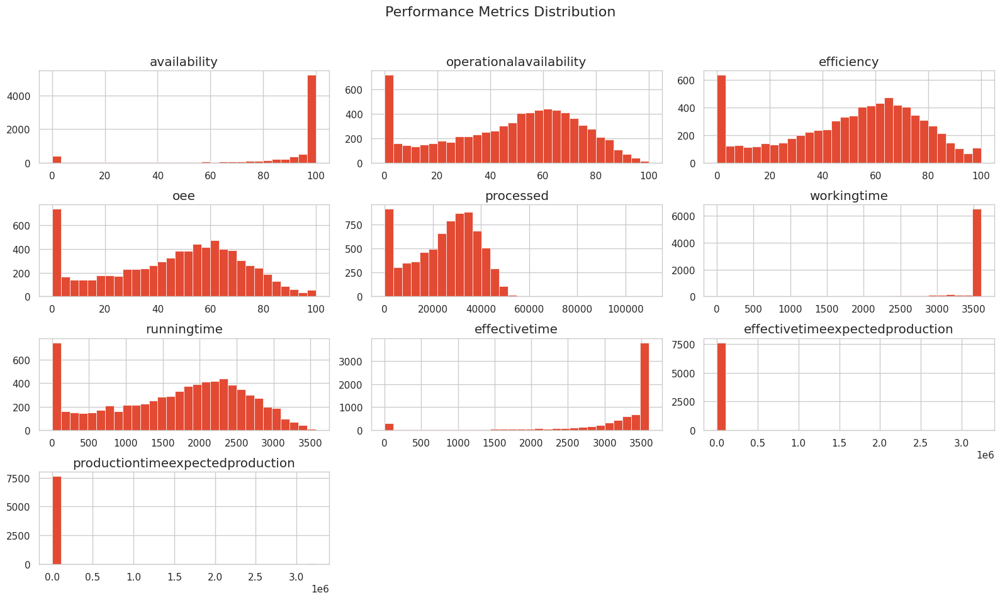

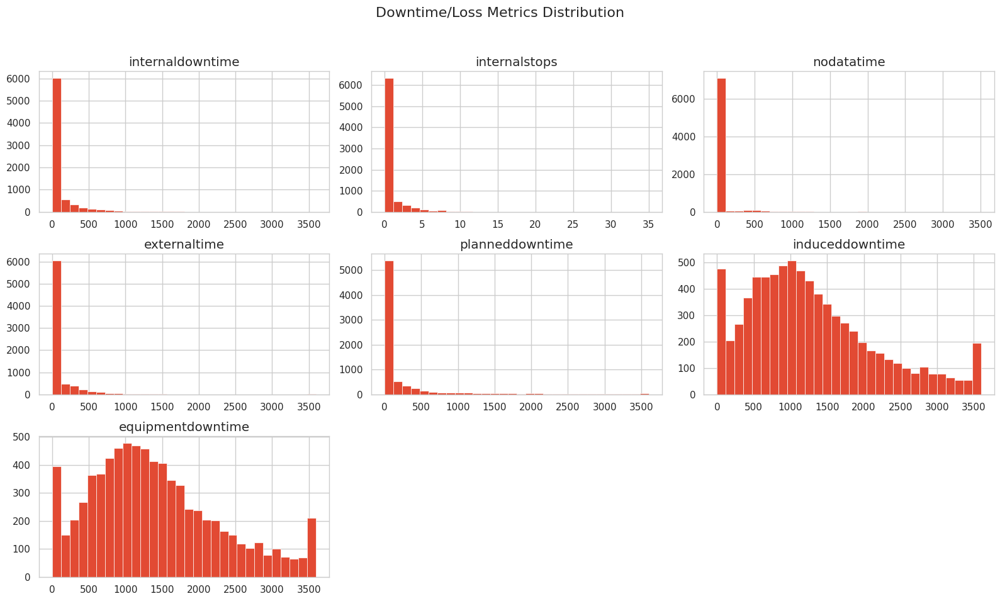

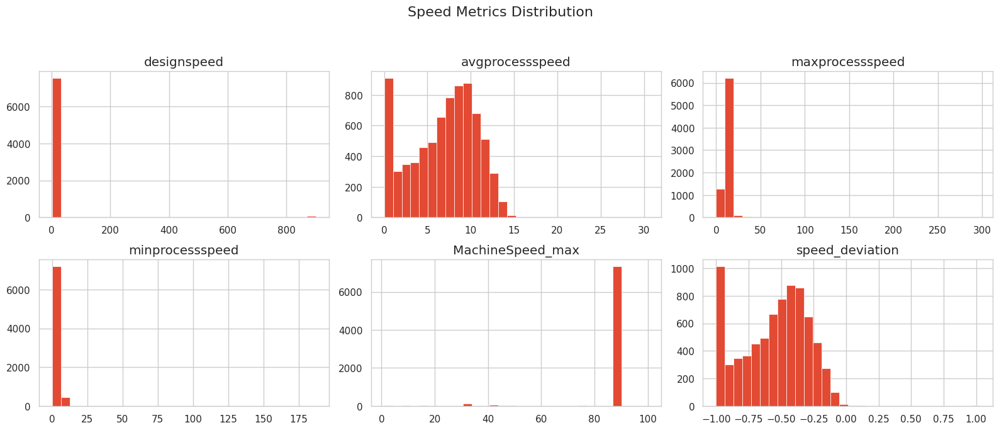

In [ ]:
# Histograms by Feature Group

import matplotlib.pyplot as plt
import seaborn as sns

# Define column groups
p_cols = ['availability', 'operationalavailability', 'efficiency', 'oee',
             'processed', 'workingtime', 'runningtime', 'effectivetime',
             'effectivetimeexpectedproduction', 'productiontimeexpectedproduction']

loss_cols = ['internaldowntime', 'internalstops', 'nodatatime', 'externaltime',
             'planneddowntime', 'induceddowntime', 'equipmentdowntime']

speed_cols = ['designspeed', 'avgprocessspeed', 'maxprocessspeed', 'minprocessspeed',
              'MachineSpeed_max', 'speed_deviation']

# Function to plot histograms
def plot_histograms(df, columns, title):
    df[columns].hist(bins=30, figsize=(16, 10), layout=(len(columns)//3 + 1, 3))
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Run plots
plot_histograms(df, p_cols, "Performance Metrics Distribution")
plot_histograms(df, loss_cols, "Downtime/Loss Metrics Distribution")
plot_histograms(df, speed_cols, "Speed Metrics Distribution")


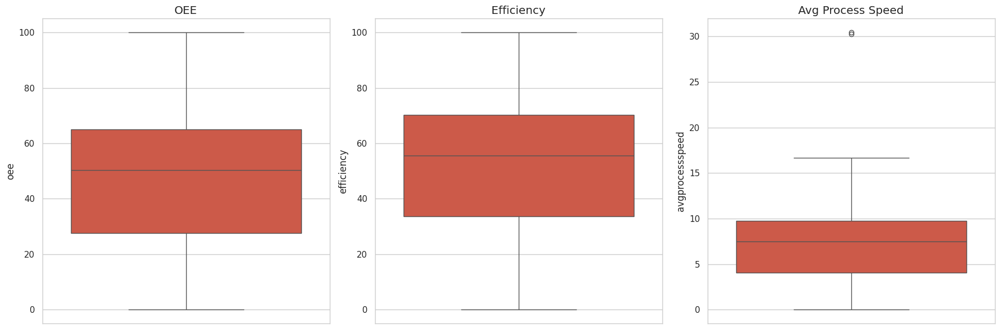

In [ ]:
# Boxplots for Outlier Detection

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
sns.boxplot(y=df['oee'])
plt.title('OEE')

plt.subplot(1, 3, 2)
sns.boxplot(y=df['efficiency'])
plt.title('Efficiency')

plt.subplot(1, 3, 3)
sns.boxplot(y=df['avgprocessspeed'])
plt.title('Avg Process Speed')

plt.tight_layout()
plt.show()


## 4.1 | Alarm Behavior Characterization (additional insights after merge)

In [ ]:
# Step 1: Define relevant alarm ID columns
alarm_cols = ["368_failure", "394_failure", "313_failure", "329_failure", "337_failure"]

# Step 2: Total counts of each alarm
alarm_counts = df[alarm_cols].sum().reset_index()
alarm_counts.columns = ['alarmID', 'Total_Count']

# Step 3: % Distribution of alarms (row-wise is meaningless in single-machine, so we show overall %)
alarm_counts['Percentage (%)'] = round(100 * alarm_counts['Total_Count'] / alarm_counts['Total_Count'].sum(), 2)

# Step 4: Vertical output
alarm_summary_vertical = alarm_counts.set_index('alarmID')

# Display vertically
print("Total alarm counts and overall %:")
display(alarm_summary_vertical)

Total alarm counts and overall %:


,Total_Count,Percentage (%)
alarmID,,
368_failure,645.0,90.34
394_failure,58.0,8.12
313_failure,8.0,1.12
329_failure,1.0,0.14
337_failure,2.0,0.28


In [ ]:
# Total count of 368_failure alarms
total_368_failures = df['368_failure'].sum()
print(f"Total 368_failure count: {total_368_failures}")

# Total count of cycle starts related to 368
total_cycle_starts_368 = df['count_cycle_starts_368'].sum()
print(f"Total count_cycle_starts_368 count: {total_cycle_starts_368}")


Total 368_failure count: 645.0
Total count_cycle_starts_368 count: 202.0


In [ ]:
# Failure rate summary

# Count total and failed rows
failure_hours = df["failure_flag"].sum()
total_hours = df.shape[0]
failure_rate = round(100 * failure_hours / total_hours, 2)

# Build a vertical DataFrame
failure_rate_summary = pd.DataFrame({
    "Total_Hours": [total_hours],
    "Failure_Hours": [failure_hours],
    "Failure_Rate (%)": [failure_rate]
}).T.rename(columns={0: "Value"})

# Display as vertical summary
display(failure_rate_summary)

,Value
Total_Hours,7662.00
Failure_Hours,354.00
Failure_Rate (%),4.62


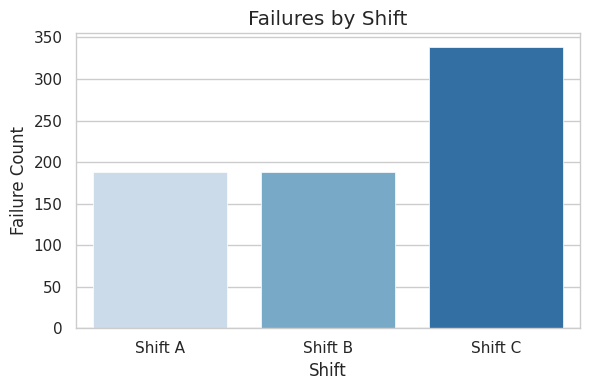

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Shift failure summary
shift_failures = {
    "Shift A": df["Shift_A_Failures"].sum(),
    "Shift B": df["Shift_B_Failures"].sum(),
    "Shift C": df["Shift_C_Failures"].sum()
}

# Clean plot
plt.figure(figsize=(6, 4))
sns.barplot(x=list(shift_failures.keys()), y=list(shift_failures.values()), hue=list(shift_failures.keys()), palette="Blues", legend=False)
plt.title("Failures by Shift")
plt.ylabel("Failure Count")
plt.xlabel("Shift")
plt.tight_layout()
plt.show()

### Time Series Analysis - 368 Failure


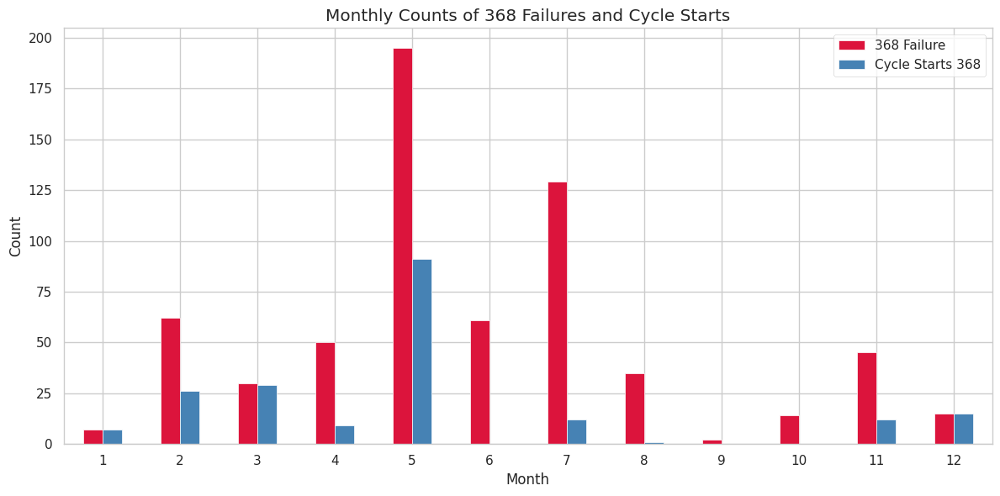

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Aggregate by month
monthly_counts = df.groupby('month')[['368_failure', 'count_cycle_starts_368']].sum()

# Plot
ax = monthly_counts.plot(kind='bar', figsize=(12,6), color=['crimson', 'steelblue'])
plt.title('Monthly Counts of 368 Failures and Cycle Starts')
plt.ylabel('Count')
plt.xlabel('Month')
plt.xticks(rotation=0)
plt.legend(['368 Failure', 'Cycle Starts 368'])
plt.tight_layout()
plt.show()


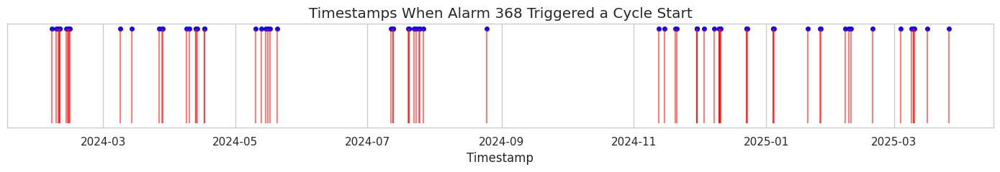

In [ ]:
df["cycle_start_368_occurred"] = (df["count_cycle_starts_368"] > 0).astype(int)

df_triggered = df[df["cycle_start_368_occurred"] == 1]

plt.figure(figsize=(14, 2.5))
plt.vlines(df_triggered["timestamp"], ymin=0, ymax=1, color='red', alpha=0.5)
plt.scatter(df_triggered["timestamp"], [1]*len(df_triggered), color='blue', s=20)

plt.title("Timestamps When Alarm 368 Triggered a Cycle Start")
plt.xlabel("Timestamp")
plt.yticks([])
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()


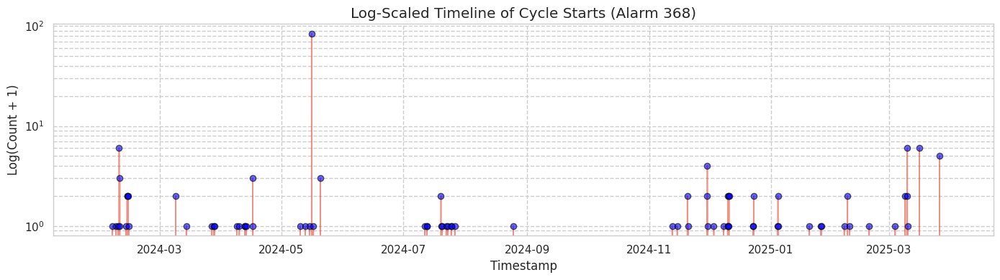

In [ ]:
plt.figure(figsize=(14, 4))
plt.plot(df["timestamp"], df["count_cycle_starts_368"],
         marker='o', linestyle='-', alpha=0.6,
         markerfacecolor='blue', markeredgecolor='black', linewidth=1.2)

plt.yscale('log')  # Log scale
plt.title("Log-Scaled Timeline of Cycle Starts (Alarm 368)")
plt.xlabel("Timestamp")
plt.ylabel("Log(Count + 1)")
plt.grid(True, which='both', linestyle='--')
plt.tight_layout()
plt.show()


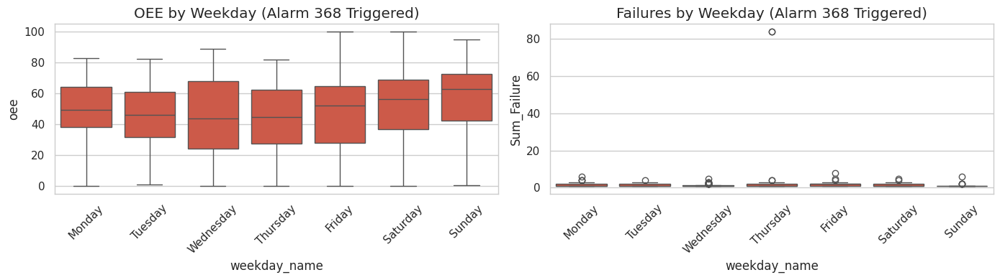

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter rows where alarm 368 was active
df_368 = df[df['368_failure'] > 0].copy()

# Plot OEE and Failures by Weekday (only when alarm 368 is triggered)
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

sns.boxplot(data=df_368, x='weekday_name', y='oee', ax=axes[0],
            order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
axes[0].set_title('OEE by Weekday (Alarm 368 Triggered)')
axes[0].tick_params(axis='x', rotation=45)

sns.boxplot(data=df_368, x='weekday_name', y='Sum_Failure', ax=axes[1],
            order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
axes[1].set_title('Failures by Weekday (Alarm 368 Triggered)')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()



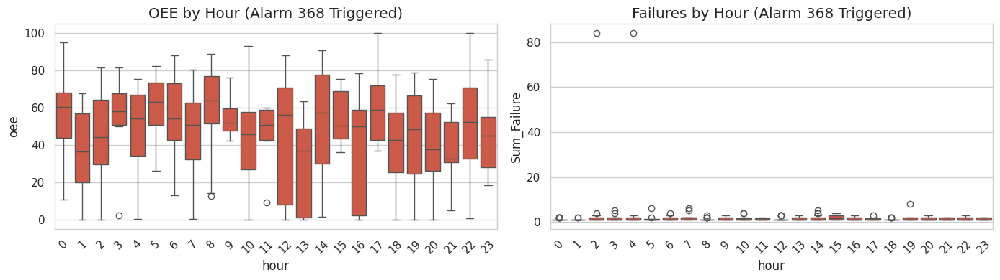

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

sns.boxplot(data=df_368, x='hour', y='oee', ax=axes[0])
axes[0].set_title('OEE by Hour (Alarm 368 Triggered)')
axes[0].tick_params(axis='x', rotation=45)

sns.boxplot(data=df_368, x='hour', y='Sum_Failure', ax=axes[1])
axes[1].set_title('Failures by Hour (Alarm 368 Triggered)')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()



## Insights - 4.4 (Anomaly & Degraded conditions prior failure flag and cycle start)

### Anormaly / Degraded state inspections vs Failure Flag

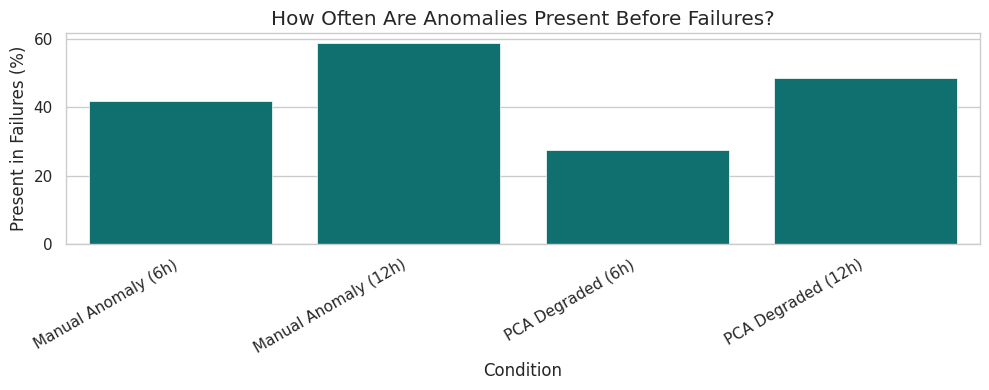

,Condition,Present in Failures (%)
0,Manual Anomaly (6h),41.81
1,Manual Anomaly (12h),58.76
2,PCA Degraded (6h),27.40
3,PCA Degraded (12h),48.59


In [ ]:
# Was the Failure Preceded by Anomaly / Degradation condition of the machine?

# Filter failures only
df_failures = df[df['failure_flag'] == 1].copy()

# Define conditions to test (same logic as before)
conditions = {
    'Manual Anomaly (6h)': df_failures['anomaly_last_6h'] == 1,
    'Manual Anomaly (12h)': df_failures['anomaly_last_12h'] == 1,
    'PCA Degraded (6h)': df_failures['degraded_last_6h'] == 1,
    'PCA Degraded (12h)': df_failures['degraded_last_12h'] == 1,
}

# Compute rates
results = []
for label, condition in conditions.items():
    count = condition.sum()
    total = len(df_failures)
    rate = round(100 * count / total, 2)
    results.append({'Condition': label, 'Present in Failures (%)': rate})

# Convert to DataFrame
reverse_df = pd.DataFrame(results)

# Plot results
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
sns.barplot(data=reverse_df, x='Condition', y='Present in Failures (%)', color='teal')
plt.xticks(rotation=30, ha='right')
plt.title("How Often Are Anomalies Present Before Failures?")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# Display table
display(reverse_df)

The objective is to determine whether the presence of certain anomaly or degradation conditions (e.g., PCA-based degradation or manually flagged anomaly within 6h or 12h) is associated with a higher likelihood of failure.

In [ ]:
import pandas as pd
from scipy.stats import chi2_contingency
from statsmodels.stats.proportion import proportion_confint

# Reuse df_failures from previous step
# We'll define the same conditions on the full dataset (not just failures)
conditions_full = {
    'Manual Anomaly (6h)': 'anomaly_last_6h',
    'Manual Anomaly (12h)': 'anomaly_last_12h',
    'PCA Degraded (6h)': 'degraded_last_6h',
    'PCA Degraded (12h)': 'degraded_last_12h',
}

# Initialize result list
stats_results = []

# Iterate over each condition
for label, column in conditions_full.items():
    # Build contingency table
    # Rows: condition True/False
    # Cols: failure_flag True/False
    contingency = pd.crosstab(df[column] == 1, df['failure_flag'] == 1)

    # Calculate chi2 test
    chi2, p_value, _, _ = chi2_contingency(contingency)

    # Compute rate when condition is True
    condition_true = (df[column] == 1)
    n_true = condition_true.sum()
    n_failures_when_true = df[condition_true & (df['failure_flag'] == 1)].shape[0]
    failure_rate = round(100 * n_failures_when_true / n_true, 2) if n_true else 0

    # Compute baseline failure rate (when condition is False)
    condition_false = (df[column] == 0)
    n_false = condition_false.sum()
    n_failures_when_false = df[condition_false & (df['failure_flag'] == 1)].shape[0]
    baseline_rate = round(100 * n_failures_when_false / n_false, 2) if n_false else 0

    # Confidence interval for failure rate
    ci_low, ci_high = proportion_confint(n_failures_when_true, n_true, method='wilson')

    stats_results.append({
        'Condition': label,
        'Failure Rate (%)': failure_rate,
        'Baseline Failure Rate (%)': baseline_rate,
        '95% CI Lower': round(ci_low * 100, 2),
        '95% CI Upper': round(ci_high * 100, 2),
        'p-value': round(p_value, 4)
    })

# Create final DataFrame
df_stats_summary = pd.DataFrame(stats_results)

display(df_stats_summary)

,Condition,Failure Rate (%),Baseline Failure Rate (%),95% CI Lower,95% CI Upper,p-value
0,Manual Anomaly (6h),4.59,4.64,3.92,5.37,0.9559
1,Manual Anomaly (12h),4.33,5.11,3.79,4.94,0.1287
2,PCA Degraded (6h),4.81,4.55,3.96,5.83,0.6825
3,PCA Degraded (12h),5.31,4.11,4.59,6.14,0.0161


### Anormaly / Degraded state inspections vs Failure cycle start

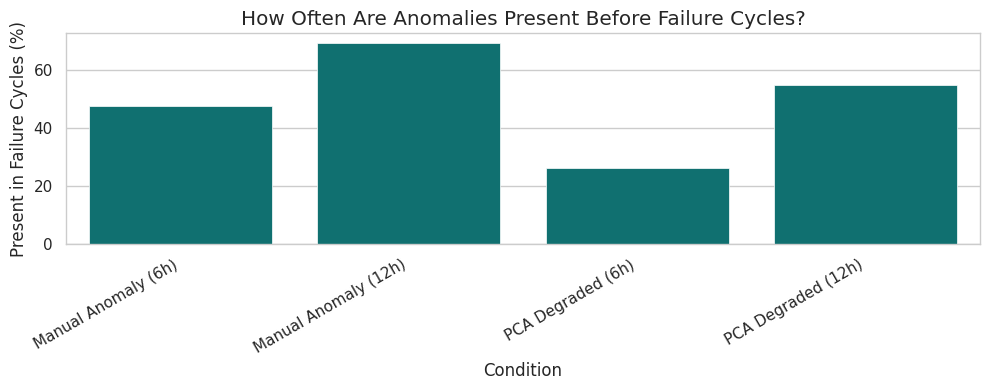

,Condition,Present in Failure Cycles (%)
0,Manual Anomaly (6h),47.75
1,Manual Anomaly (12h),69.37
2,PCA Degraded (6h),26.13
3,PCA Degraded (12h),54.95


In [ ]:
# Filter rows where a failure cycle actually started

# Define the target condition: whether a failure cycle started
df["failure_cycle_start"] = (df["count_cycle_starts"] > 0).astype(int)

df_failures = df[df['failure_cycle_start'] == 1].copy()

# Define anomaly/degradation conditions
conditions = {
    'Manual Anomaly (6h)': df_failures['anomaly_last_6h'] == 1,
    'Manual Anomaly (12h)': df_failures['anomaly_last_12h'] == 1,
    'PCA Degraded (6h)': df_failures['degraded_last_6h'] == 1,
    'PCA Degraded (12h)': df_failures['degraded_last_12h'] == 1,
}

# Compute presence rates
results = []
for label, condition in conditions.items():
    count = condition.sum()
    total = len(df_failures)
    rate = round(100 * count / total, 2)
    results.append({'Condition': label, 'Present in Failure Cycles (%)': rate})

# Create DataFrame
reverse_df = pd.DataFrame(results)

# Plot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
sns.barplot(data=reverse_df, x='Condition', y='Present in Failure Cycles (%)', color='teal')
plt.xticks(rotation=30, ha='right')
plt.title("How Often Are Anomalies Present Before Failure Cycles?")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# Display result
display(reverse_df)


In [ ]:
import pandas as pd
from scipy.stats import chi2_contingency
from statsmodels.stats.proportion import proportion_confint

# Reuse df_failures from previous step
# We'll define the same conditions on the full dataset (not just failures)
conditions_full = {
    'Manual Anomaly (6h)': 'anomaly_last_6h',
    'Manual Anomaly (12h)': 'anomaly_last_12h',
    'PCA Degraded (6h)': 'degraded_last_6h',
    'PCA Degraded (12h)': 'degraded_last_12h',
}

# Initialize result list
stats_results = []

# Iterate over each condition
for label, column in conditions_full.items():
    # Build contingency table
    # Rows: condition True/False
    # Cols: failure_flag True/False
    contingency = pd.crosstab(df[column] == 1, df['failure_cycle_start'] == 1)

    # Calculate chi2 test
    chi2, p_value, _, _ = chi2_contingency(contingency)

    # Compute rate when condition is True
    condition_true = (df[column] == 1)
    n_true = condition_true.sum()
    n_failures_when_true = df[condition_true & (df['failure_cycle_start'] == 1)].shape[0]
    failure_rate = round(100 * n_failures_when_true / n_true, 2) if n_true else 0

    # Compute baseline failure rate (when condition is False)
    condition_false = (df[column] == 0)
    n_false = condition_false.sum()
    n_failures_when_false = df[condition_false & (df['failure_cycle_start'] == 1)].shape[0]
    baseline_rate = round(100 * n_failures_when_false / n_false, 2) if n_false else 0

    # Confidence interval for failure rate
    ci_low, ci_high = proportion_confint(n_failures_when_true, n_true, method='wilson')

    stats_results.append({
        'Condition': label,
        'Failure Cycle Start Rate (%)': failure_rate,
        'Baseline Failure Rate (%)': baseline_rate,
        '95% CI Lower': round(ci_low * 100, 2),
        '95% CI Upper': round(ci_high * 100, 2),
        'p-value': round(p_value, 4)
    })

# Create final DataFrame
df_stats_summary = pd.DataFrame(stats_results)

display(df_stats_summary)

,Condition,Failure Cycle Start Rate (%),Baseline Failure Rate (%),95% CI Lower,95% CI Upper,p-value
0,Manual Anomaly (6h),1.64,1.31,1.26,2.14,0.2631
1,Manual Anomaly (12h),1.60,1.19,1.28,2.00,0.1731
2,PCA Degraded (6h),1.44,1.45,1.00,2.06,1.0000
3,PCA Degraded (12h),1.88,1.13,1.47,2.41,0.0086


## 4.3 | Correlation Analysis

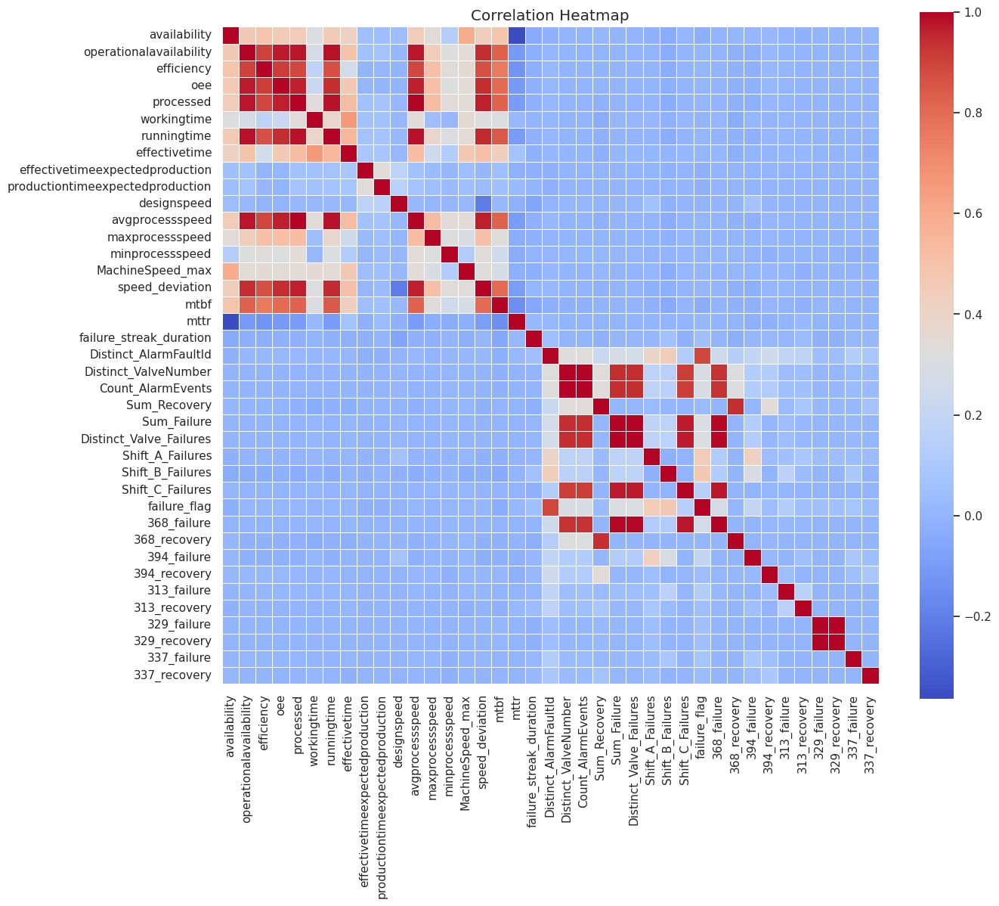

Highly correlated pairs (|ρ| > 0.95):
oee ↔ operationalavailability : ρ = 0.973
processed ↔ operationalavailability : ρ = 0.976
processed ↔ oee : ρ = 0.964
runningtime ↔ operationalavailability : ρ = 0.98
runningtime ↔ processed : ρ = 0.982
avgprocessspeed ↔ operationalavailability : ρ = 0.976
avgprocessspeed ↔ oee : ρ = 0.964
avgprocessspeed ↔ processed : ρ = 1.0
avgprocessspeed ↔ runningtime : ρ = 0.982
speed_deviation ↔ processed : ρ = 0.967
speed_deviation ↔ avgprocessspeed : ρ = 0.967
Count_AlarmEvents ↔ Distinct_ValveNumber : ρ = 1.0
Distinct_Valve_Failures ↔ Sum_Failure : ρ = 1.0
Shift_C_Failures ↔ Sum_Failure : ρ = 0.97
Shift_C_Failures ↔ Distinct_Valve_Failures : ρ = 0.97
368_failure ↔ Sum_Failure : ρ = 0.992
368_failure ↔ Distinct_Valve_Failures : ρ = 0.992
368_failure ↔ Shift_C_Failures : ρ = 0.978
329_recovery ↔ 329_failure : ρ = 1.0


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Select numerical columns of interest
numeric_cols = p_cols + speed_cols + maint_cols + a_cols  # Include only relevant numerical features
df_numeric = df[numeric_cols].copy()

# Optional: remove non-numeric cols if needed (in case some alarm columns are not numerical)
df_numeric = df_numeric.select_dtypes(include=[np.number])

# Step 2: Compute correlation matrix
corr_matrix = df_numeric.corr()

# Step 3: Plot heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=False, fmt='.2f', linewidths=0.5, square=True)
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

# Step 4: Identify highly correlated pairs (|ρ| > 0.95)
threshold = 0.95
high_corr = []

for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            col1 = corr_matrix.columns[i]
            col2 = corr_matrix.columns[j]
            corr_val = corr_matrix.iloc[i, j]
            high_corr.append((col1, col2, round(corr_val, 3)))

# Step 5: Print highly correlated feature pairs
if high_corr:
    print("Highly correlated pairs (|ρ| > 0.95):")
    for col1, col2, val in high_corr:
        print(f"{col1} ↔ {col2} : ρ = {val}")
else:
    print("No feature pairs with correlation above 0.95.")


### Reduce Multicollinearity

In [ ]:
# Core Performance
selected_perf_cols = [
    'oee',            # primary performance indicator
    'efficiency',
    'availability',
    'processed',      # total units processed
    'workingtime',
    'effectivetime'
]

# Speed Metrics (non-redundant)
selected_speed_cols = [
    'avgprocessspeed',    # actual machine speed
    'speed_deviation',    # deviation from design
]

# Downtime & Losses
selected_loss_cols = [
    'internaldowntime',
    'induceddowntime',
    'equipmentdowntime'
]

# Maintenance Indicators
selected_maint_cols = [
    'mtbf',
    'mttr',
    'failure_streak_duration'
]

# Alarm & Failure Summary
selected_alarm_cols = [
    'Sum_Failure',
    'count_cycle_starts',
    'count_cycle_starts_368',
    'count_active_cycles'

]

# Lag/Trend (Optional - only for modeling)
selected_lag_cols = [
    'oee_minus_6',
    'oee_minus_12',
    'oee_drop_post_6',
    'failures_last_6h',
    'failures_last_12h',
    'risk_flag_last_12h',
    'degraded_last_12h',
    'anomaly_last_12h',
    'oee_lag_6',
    'oee_lag_12',
    'oee_drop_pre_6',
    'oee_drop_pre_12',
]

# Combine all selected features into one list
selected_features = (
    selected_perf_cols +
    selected_speed_cols +
    selected_loss_cols +
    selected_maint_cols +
    selected_alarm_cols +
    selected_lag_cols
)

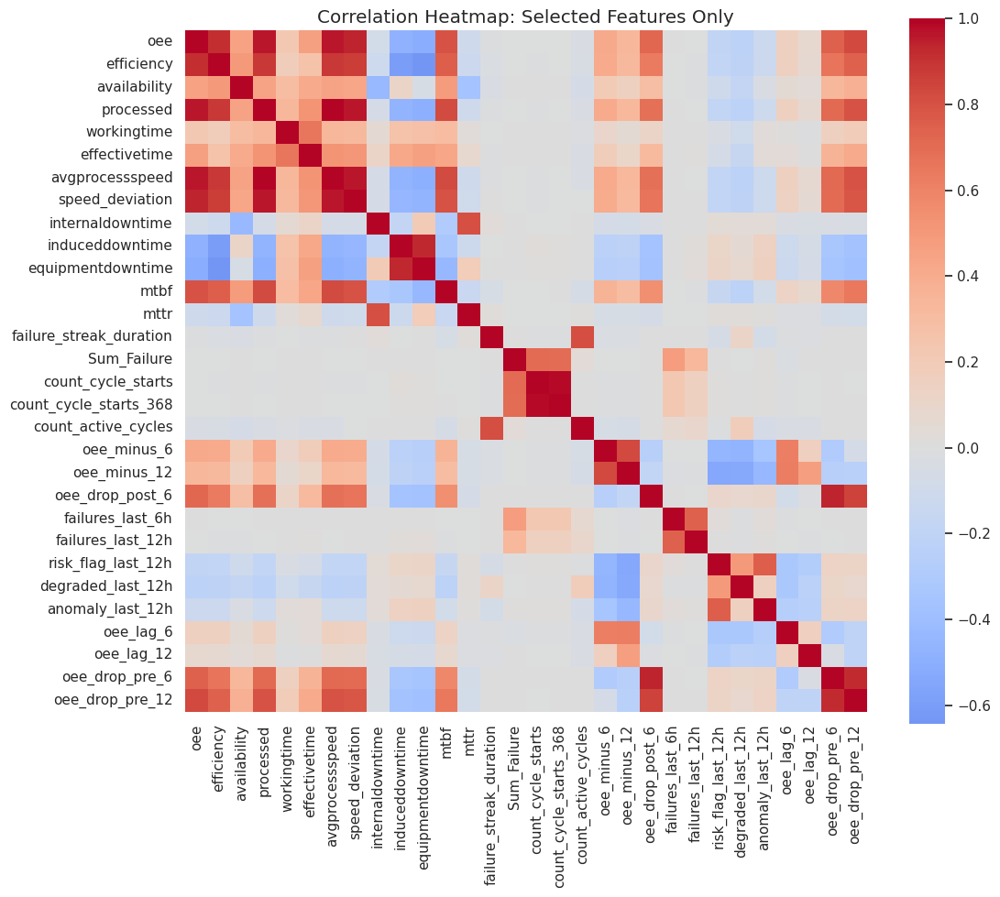

In [ ]:
df_selected = df[selected_features].copy()

import seaborn as sns
import matplotlib.pyplot as plt

# Recompute correlation matrix for selected features
corr_matrix_selected = df[selected_features].corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_selected, annot=False, cmap='coolwarm', center=0, square=True)
plt.title("Correlation Heatmap: Selected Features Only")
plt.show()

### Correlation Between Alarm Features and Performance Metrics

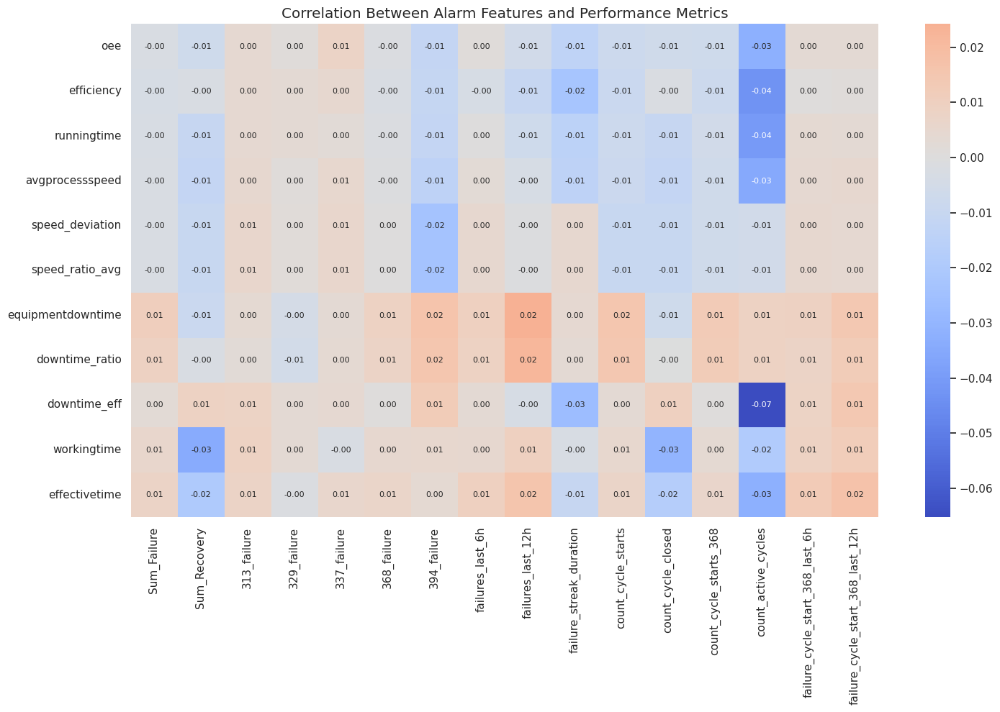

Top Correlations with OEE:
avgprocessspeed                     0.964383
runningtime                         0.942748
speed_deviation                     0.941730
speed_ratio_avg                     0.941730
efficiency                          0.912880
downtime_ratio                     -0.532772
equipmentdowntime                  -0.512489
downtime_eff                        0.489988
effectivetime                       0.464718
workingtime                         0.218484
count_active_cycles                -0.032218
failure_streak_duration            -0.013876
394_failure                        -0.011684
count_cycle_starts                 -0.008216
337_failure                         0.007799
Sum_Recovery                       -0.006703
count_cycle_starts_368             -0.006555
count_cycle_closed                 -0.006540
failures_last_12h                  -0.005555
313_failure                         0.004182
failure_cycle_start_368_last_12h    0.003575
failure_cycle_start_368_last

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the correlation features based on your dataset columns
corr_features = [
    'oee', 'efficiency','runningtime',
    'avgprocessspeed', 'speed_deviation','speed_ratio_avg',

    'equipmentdowntime','downtime_ratio',
    'downtime_eff', 'workingtime', 'effectivetime',

    'Sum_Failure', 'Sum_Recovery',
    '313_failure', '329_failure', '337_failure', '368_failure', '394_failure',
    'failures_last_6h', 'failures_last_12h',
    'failure_streak_duration','count_cycle_starts','count_cycle_closed','count_cycle_starts_368','count_active_cycles',
    'failure_cycle_start_368_last_6h', 'failure_cycle_start_368_last_12h'

]

# Filter only features present in df
corr_features = [f for f in corr_features if f in df.columns]

# Calculate correlation matrix
corr_matrix = df[corr_features].corr()

# Split indices for performance metrics (first 4) and alarm/failure (rest)
perf_idx = [i for i, f in enumerate(corr_features) if f in ['oee', 'efficiency','runningtime',
                                                            'avgprocessspeed', 'speed_deviation','speed_ratio_avg',
                                                            'equipmentdowntime','downtime_ratio',
                                                            'downtime_eff', 'workingtime', 'effectivetime']]
alarm_idx = [i for i in range(len(corr_features)) if i not in perf_idx]

# Plot heatmap between performance metrics and alarm features
plt.figure(figsize=(15, 10))
sns.heatmap(
    corr_matrix.iloc[perf_idx, alarm_idx],  # Use single iloc with both indices
    annot=True, cmap='coolwarm', center=0,
    annot_kws={"size": 8}, fmt=".2f",
    xticklabels=[corr_features[i] for i in alarm_idx],
    yticklabels=[corr_features[i] for i in perf_idx]
)
plt.title('Correlation Between Alarm Features and Performance Metrics')
plt.tight_layout()
plt.show()

# Top correlations with OEE (excluding OEE itself)
oee_correlations = corr_matrix['oee'].drop('oee').sort_values(key=abs, ascending=False)

print("Top Correlations with OEE:")
print(oee_correlations)

## 4.4 | Impact Analysis

### Direct Impact

#### Alarm Impact on OEE

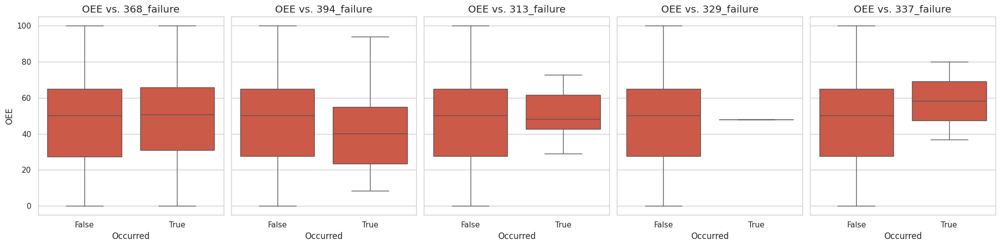

In [ ]:
# Create binary flags: whether each alarm occurred
for col in alarm_cols:
    df[f'{col}_bin'] = df[col] > 0

# Plot OEE distribution depending on each alarm occurrence
fig, axes = plt.subplots(1, len(alarm_cols), figsize=(20, 5), sharey=True)

for i, col in enumerate(alarm_cols):
    sns.boxplot(
        x=f'{col}_bin',
        y='oee',
        data=df,
        ax=axes[i]
    )
    axes[i].set_title(f"OEE vs. {col}")
    axes[i].set_xlabel("Occurred")
    axes[i].set_ylabel("OEE" if i == 0 else "")

plt.tight_layout()
plt.show()

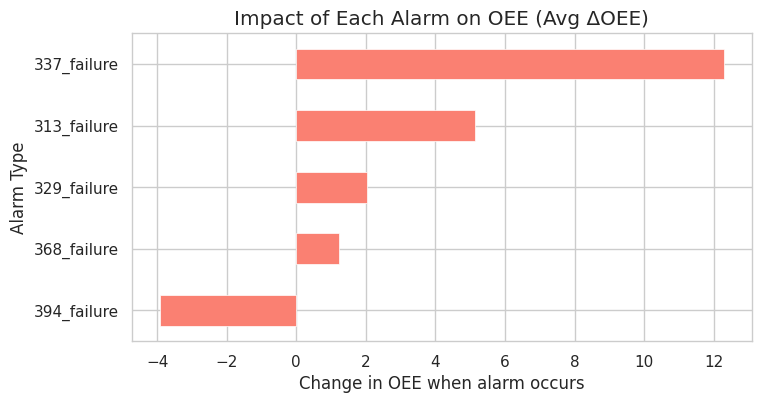

In [ ]:
# Calculate OEE drop per alarm
impact_scores = {
    col: df.groupby(f"{col}_bin")["oee"].mean().diff().iloc[-1]
    for col in alarm_cols
}

# Plot impact scores
impact_df = pd.DataFrame.from_dict(impact_scores, orient='index', columns=['delta_oee'])
impact_df.sort_values('delta_oee').plot.barh(figsize=(8, 4), legend=False, color='salmon')
plt.title("Impact of Each Alarm on OEE (Avg ΔOEE)")
plt.xlabel("Change in OEE when alarm occurs")
plt.ylabel("Alarm Type")
plt.grid(True, axis='x')
plt.show()

#### Statistical Test of Alarms ID | Criticity | Failure flag impact on OEE

In [ ]:
from scipy import stats
from scipy import stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# 1. Compare means with vs without failures
no_failure = df[df['Sum_Failure'] == 0]['oee']
with_failure = df[df['Sum_Failure'] > 0]['oee']

t_stat, p_value = stats.ttest_ind(no_failure, with_failure, equal_var=False)
print(f"T-test for OEE with vs without failures: t={t_stat:.2f}, p={p_value:.4f}")

# 2. ANOVA for different failure severities
if 'combined_criticity' in df.columns:
    groups = [df[df['combined_criticity'] == i]['oee'] for i in range(4)]
    f_stat, p_value = stats.f_oneway(*groups)
    print(f"\nANOVA for OEE by failure criticity: F={f_stat:.2f}, p={p_value:.4f}")

    # Post-hoc tests
    from statsmodels.stats.multicomp import pairwise_tukeyhsd
    tukey = pairwise_tukeyhsd(endog=df['oee'],
                             groups=df['combined_criticity'],
                             alpha=0.05)
    print("\nTukey HSD Post-hoc Test:")
    print(tukey.summary())

# 3. Test for specific alarm types
for alarm in ['313_failure', '329_failure', '337_failure', '368_failure', '394_failure']:
    no_alarm = df[df[alarm] == 0]['oee']
    with_alarm = df[df[alarm] > 0]['oee']
    if len(with_alarm) > 1:
        t_stat, p_value = stats.ttest_ind(no_alarm, with_alarm, equal_var=False)
        print(f"\n{alarm}: t={t_stat:.2f}, p={p_value:.4f}, n={len(with_alarm)}")

T-test for OEE with vs without failures: t=-0.75, p=0.4556

ANOVA for OEE by failure criticity: F=0.80, p=0.4939

Tukey HSD Post-hoc Test:
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
   0.0    1.0  -4.1984 0.9337 -18.7017  10.305  False
   0.0    2.0   9.7947 0.8474 -16.4661 36.0555  False
   0.0    3.0    1.242 0.9129  -2.7183  5.2023  False
   0.0    4.0  -1.8857 0.9999 -41.9887 38.2174  False
   1.0    2.0  13.9931 0.7075 -15.9845 43.9706  False
   1.0    3.0   5.4403 0.8599    -9.55 20.4307  False
   1.0    4.0   2.3127 0.9999 -40.3169 44.9423  False
   2.0    3.0  -8.5527 0.9045 -35.0856 17.9801  False
   2.0    4.0 -11.6804 0.9638 -59.6028 36.2421  False
   3.0    4.0  -3.1276 0.9996 -43.4094 37.1541  False
-----------------------------------------------------

313_failure: t=-0.88, p=0.4135, n=7

337_failure: t=-0.57, p=0.6701, n=2

368_failure: t=-0.84, p=0.4026

### OEE behaviour around Failure

#### OEE vs. Alarms (Before, During, After)

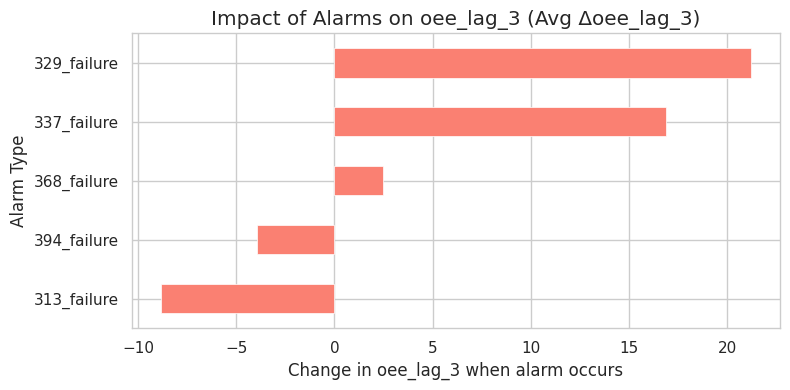

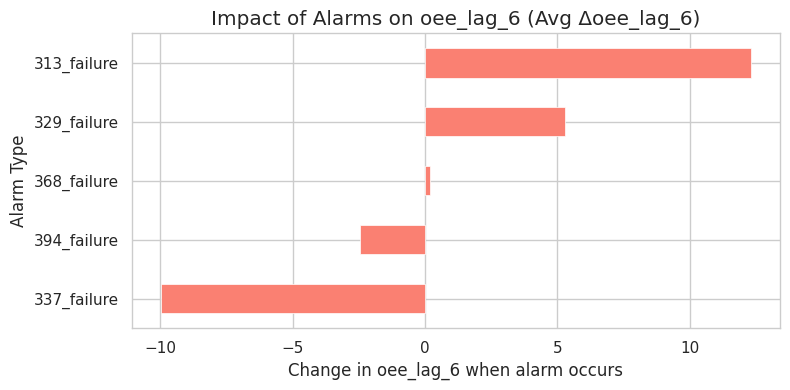

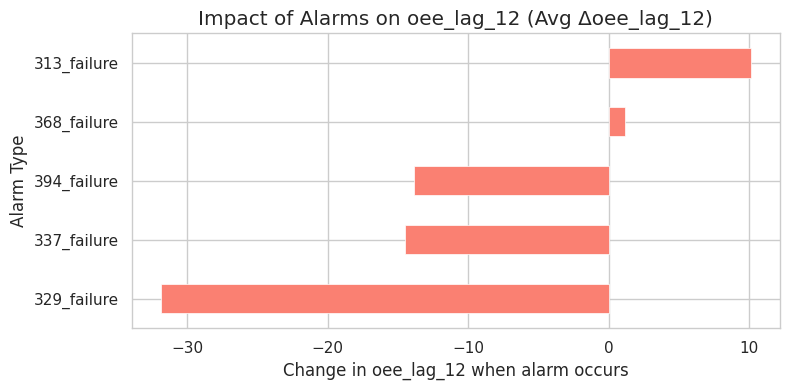

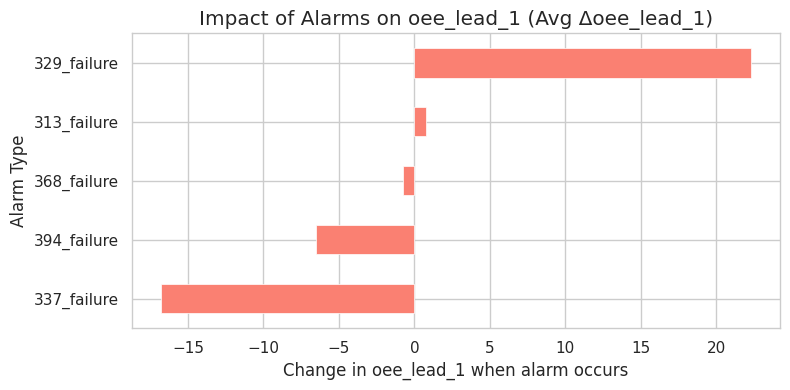

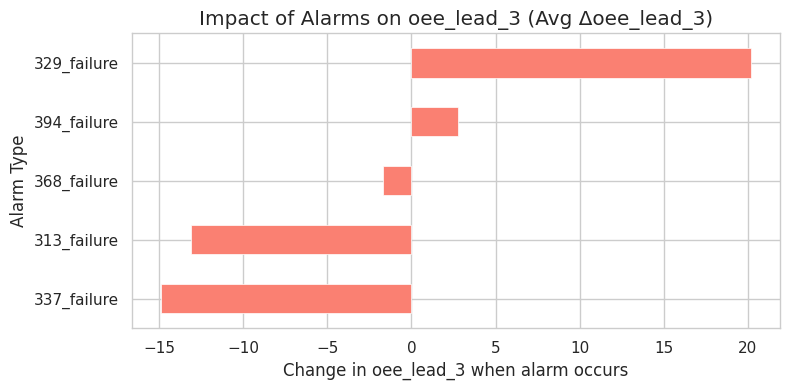

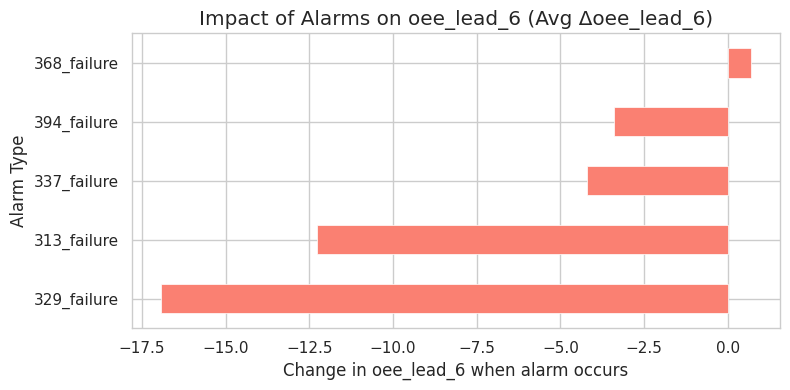

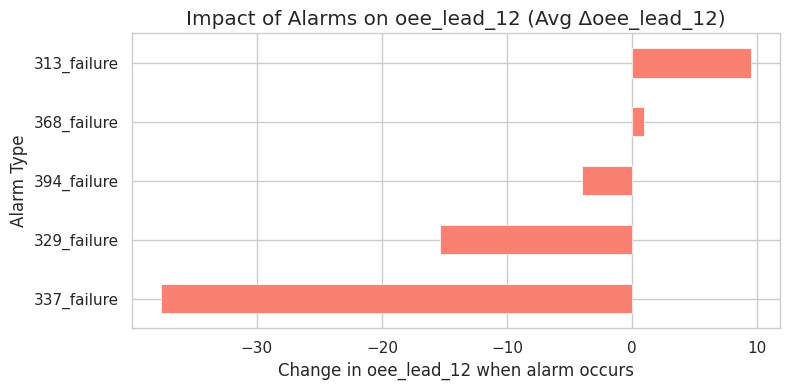

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Define alarm columns and OEE metrics
alarm_cols = ['368_failure', '394_failure', '313_failure', '329_failure', '337_failure']
features_to_check = ['oee_lag_3', 'oee_lag_6', 'oee_lag_12',
                     'oee_lead_1','oee_lead_3', 'oee_lead_6', 'oee_lead_12']

# Loop through each OEE feature
for feature in features_to_check:
    # Calculate impact score (mean diff when alarm is active)
    impact_scores = {
        col: df.groupby(f"{col}_bin")[feature].mean().diff().iloc[-1]
        for col in alarm_cols
        if f"{col}_bin" in df.columns
    }

    # Build impact DataFrame
    impact_df = pd.DataFrame.from_dict(impact_scores, orient='index', columns=[f'delta_{feature}'])

    # Plot
    impact_df.sort_values(by=f'delta_{feature}').plot.barh(
        figsize=(8, 4),
        legend=False,
        color='salmon'
    )
    plt.title(f"Impact of Alarms on {feature} (Avg Δ{feature})")
    plt.xlabel(f"Change in {feature} when alarm occurs")
    plt.ylabel("Alarm Type")
    plt.grid(True, axis='x')
    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd

# Define alarm columns and OEE metrics to check
alarm_cols = ['368_failure', '394_failure', '313_failure', '329_failure', '337_failure']
oee_features = ['oee_lag_12','oee_lag_6','oee_lag_3','oee',
                'oee_lead_1','oee_lead_3', 'oee_lead_6', 'oee_lead_12']

# Initialize dictionary to store results
impact_results = {}

# Loop through each OEE metric
for feature in oee_features:
    deltas = {}
    for alarm in alarm_cols:
        bin_col = f"{alarm}_bin"
        if bin_col in df.columns and feature in df.columns:
            grouped = df.groupby(bin_col)[feature].mean()
            if len(grouped) == 2:
                deltas[alarm] = grouped[True] - grouped[False]
            else:
                deltas[alarm] = None
    impact_results[feature] = deltas

# Convert to DataFrame (transpose so alarms are rows, features are columns)
impact_df = pd.DataFrame(impact_results).T

# Preview the table
print("Average ΔOEE when alarm is active vs not (positive = higher OEE with alarm):")
display(impact_df)


Average ΔOEE when alarm is active vs not (positive = higher OEE with alarm):


,368_failure,394_failure,313_failure,329_failure,337_failure
oee_lag_12,1.172520,-13.846085,10.090373,-31.849743,-14.514820
oee_lag_6,0.185821,-2.449724,12.304932,5.281408,-9.960773
oee_lag_3,2.476591,-3.937821,-8.816231,21.196976,16.865279
oee,1.216845,-3.916800,5.124208,2.027463,12.286083
oee_lead_1,-0.729981,-6.504762,0.742995,22.273266,-16.767352
oee_lead_3,-1.704608,2.788404,-13.084195,20.160025,-14.864934
oee_lead_6,0.682783,-3.397785,-12.273436,-16.921002,-4.201371
oee_lead_12,0.965040,-3.972885,9.461347,-15.366873,-37.635754


#### OEE vs Criticity

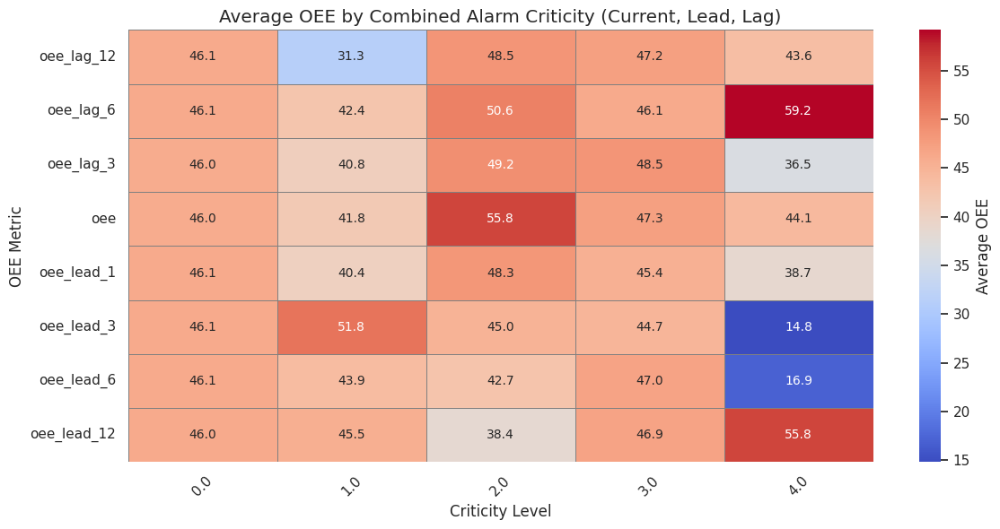

In [ ]:
import pandas as pd

# Select OEE-related features
oee_features = [
    "oee_lag_12", "oee_lag_6", "oee_lag_3", "oee",
    'oee_lead_1',"oee_lead_3", "oee_lead_6", "oee_lead_12"
]

# Initialize results dictionary
oee_by_criticity = {}

# Loop over each OEE feature
for metric in oee_features:
    means = (
        df.groupby("combined_criticity")[metric]
        .mean()
        .round(2)
    )
    oee_by_criticity[metric] = means

# Convert to DataFrame
impact_table = pd.DataFrame(oee_by_criticity).T

# Show the table
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(figsize=(12, 6))
sns.heatmap(
    impact_table,
    annot=True, fmt=".1f", cmap="coolwarm", linewidths=0.5, linecolor='gray',
    cbar_kws={"label": "Average OEE"}
)
plt.title("Average OEE by Combined Alarm Criticity (Current, Lead, Lag)")
plt.ylabel("OEE Metric")
plt.xlabel("Criticity Level")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Clean up: drop the temporary _bin columns
bin_cols = [f'{col}_bin' for col in alarm_cols]
df.drop(columns=bin_cols, inplace=True)


#### OEE around cycle start of Alarm 368

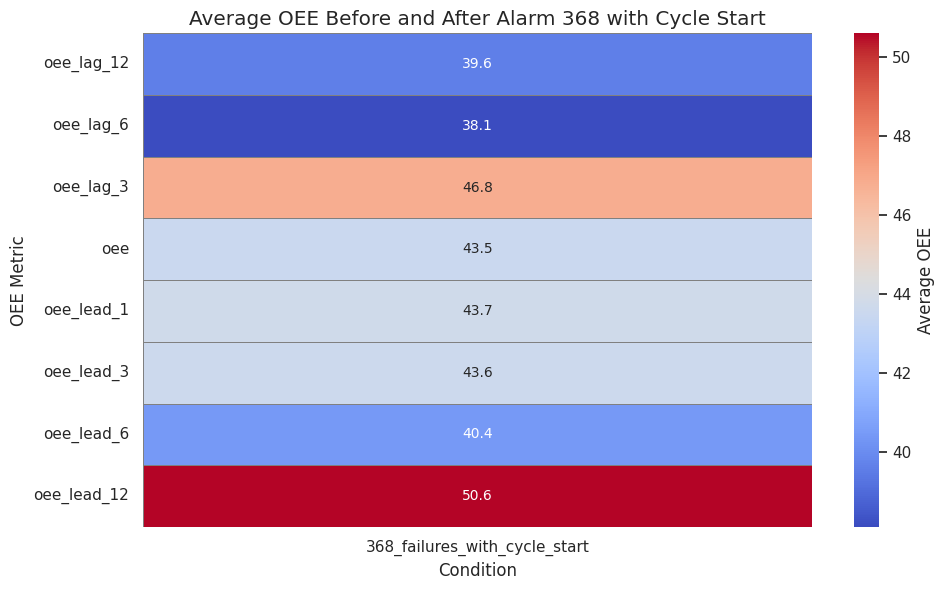

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define OEE features of interest
oee_features = [
    "oee_lag_12", "oee_lag_6", "oee_lag_3", "oee",
    "oee_lead_1", "oee_lead_3", "oee_lead_6", "oee_lead_12"
]

# Filter: Only rows where 368_failure > 0 and cycle has started
filtered_df = df[(df['count_cycle_starts_368'] > 0)].copy()

# Create a single group (optional: can add week or time windows if needed)
filtered_df['analysis_group'] = '368_failures_with_cycle_start'

# Compute mean OEE values per group
impact_table = (
    filtered_df
    .groupby('analysis_group')[oee_features]
    .mean()
    .round(2)
).T

# Plot
plt.figure(figsize=(10, 6))
sns.heatmap(
    impact_table,
    annot=True, fmt=".1f", cmap="coolwarm", linewidths=0.5, linecolor='gray',
    cbar_kws={"label": "Average OEE"}
)
plt.title("Average OEE Before and After Alarm 368 with Cycle Start")
plt.ylabel("OEE Metric")
plt.xlabel("Condition")
plt.tight_layout()
plt.show()


##### Statistical Test

> Does the occurrence of Alarm 368 during a cycle start significantly affect OEE performance (and its lagged/lead metrics)? the analysis is testing whether there are statistically significant differences in OEE between time periods when Alarm 368 occurs during a cycle start vs. when it does not.

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind

# Create binary flag: did 368 failure occur during a cycle start?
df['alarm368_cycle_start'] = ((df['count_cycle_starts_368'] > 0)).astype(int)

# List of OEE metrics
oee_metrics = [
    'oee', 'oee_lag_3', 'oee_lag_6', 'oee_lag_12',
    'oee_lead_1', 'oee_lead_3', 'oee_lead_6', 'oee_lead_12'
]

# Loop through and test each OEE metric
for metric in oee_metrics:
    print(f"\n=== {metric.upper()} ===")

    # Drop NA values
    subset = df[[metric, 'alarm368_cycle_start']].dropna()

    group1 = subset[subset['alarm368_cycle_start'] == 1][metric]
    group2 = subset[subset['alarm368_cycle_start'] == 0][metric]

    if len(group1) < 2 or len(group2) < 2:
        print("Not enough data for one or both groups.")
        continue

    # Perform Welch’s t-test (unequal variance)
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

    # Print results
    print(f"T-test: t = {t_stat:.2f}, p = {p_value:.4e}")
    print(f"Mean with alarm 368 + cycle start: {group1.mean():.2f}")
    print(f"Mean without: {group2.mean():.2f}")

    # Significance check
    if p_value < 0.05:
        print("Statistically significant difference (p < 0.05)")
    else:
        print("Not statistically significant (p ≥ 0.05)")



=== OEE ===
T-test: t = -0.94, p = 3.5055e-01
Mean with alarm 368 + cycle start: 43.49
Mean without: 46.09
Not statistically significant (p ≥ 0.05)

=== OEE_LAG_3 ===
T-test: t = 0.30, p = 7.6230e-01
Mean with alarm 368 + cycle start: 46.81
Mean without: 46.05
Not statistically significant (p ≥ 0.05)

=== OEE_LAG_6 ===
T-test: t = -2.83, p = 5.9075e-03
Mean with alarm 368 + cycle start: 38.10
Mean without: 46.15
Statistically significant difference (p < 0.05)

=== OEE_LAG_12 ===
T-test: t = -2.15, p = 3.4944e-02
Mean with alarm 368 + cycle start: 39.60
Mean without: 46.15
Statistically significant difference (p < 0.05)

=== OEE_LEAD_1 ===
T-test: t = -0.80, p = 4.2906e-01
Mean with alarm 368 + cycle start: 43.73
Mean without: 46.08
Not statistically significant (p ≥ 0.05)

=== OEE_LEAD_3 ===
T-test: t = -0.84, p = 4.0318e-01
Mean with alarm 368 + cycle start: 43.60
Mean without: 46.08
Not statistically significant (p ≥ 0.05)

=== OEE_LEAD_6 ===
T-test: t = -2.17, p = 3.3392e-02
Mean w

#### OEE Recovery after Failure

Performance with vs without failures:


oee            efficiency            avgprocessspeed  \
                   mean        std       mean        std            mean   
failure_flag                                                               
0.0           46.014050  25.455118  50.783706  26.136361        6.838148   
1.0           47.045186  25.365115  51.700040  25.777522        6.998422   

                        runningtime              
                   std         mean         std  
failure_flag                                     
0.0           3.801061  1662.976738  927.072598  
1.0           3.803760  1688.576271  915.303656


Performance by Failure Severity:


oee                  efficiency             \
                         mean        std count       mean        std   
combined_criticity                                                     
0.0                 46.014050  25.455118  7308  50.783706  26.136361   
1.0                 41.815689  24.020774    23  47.211466  24.963544   
2.0                 55.808765  17.339178     7  58.011473  17.911459   
3.0                 47.256039  25.681211   321  51.840046  26.100824   
4.0                 44.128395  13.495401     3  56.405055   7.447391   

                    runningtime              
                           mean         std  
combined_criticity                           
0.0                 1662.976738  927.072598  
1.0                 1497.304348  806.829397  
2.0                 1961.571429  530.620975  
3.0                 1697.355140  931.789279  
4.0                 1578.666667  483.592115


Impact by Alarm Type:


,alarm_type,count,avg_oee,oee_reduction,avg_efficiency,avg_speed
4,394_failure,26,42.158181,3.903509,47.074084,6.102457
3,368_failure,324,47.227079,-1.165389,51.882315,7.042374
1,329_failure,1,48.088889,-2.027198,58.191597,7.213330
0,313_failure,7,51.181217,-5.119527,57.202106,7.677184
2,337_failure,2,58.344567,-12.282876,58.344567,8.052640


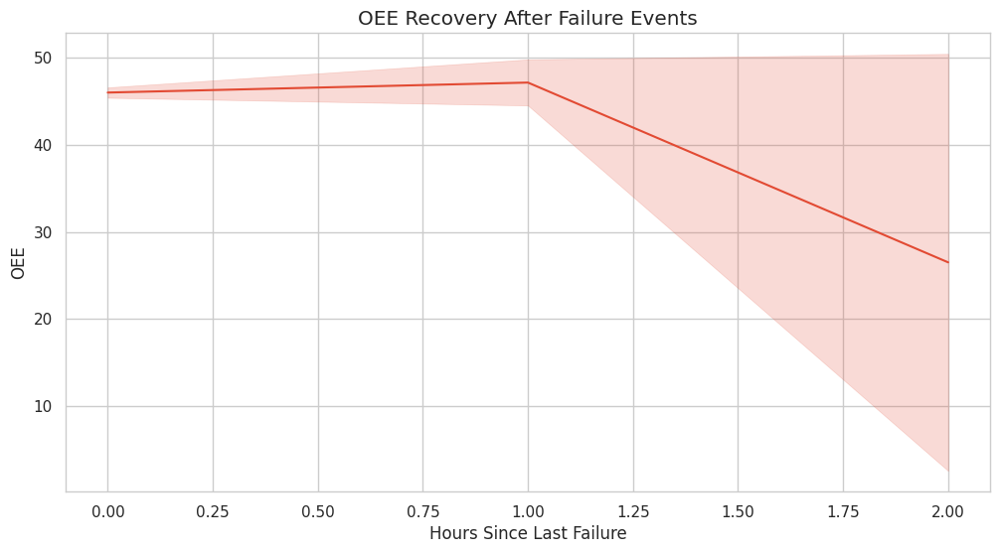

In [ ]:
# 1. Compare performance with vs without failures
failure_impact = df.groupby('failure_flag').agg({
    'oee': ['mean', 'std'],
    'efficiency': ['mean', 'std'],
    'avgprocessspeed': ['mean', 'std'],
    'runningtime': ['mean', 'std']
})
print("Performance with vs without failures:")
display(failure_impact)

# 2. Impact by failure criticity
if 'combined_criticity' in df.columns:
    severity_impact = df.groupby('combined_criticity').agg({
        'oee': ['mean', 'std', 'count'],
        'efficiency': ['mean', 'std'],
        'runningtime': ['mean', 'std']
    })
    print("\nPerformance by Failure Severity:")
    display(severity_impact)

# 3. Impact by specific alarm types
alarm_types = ['313_failure', '329_failure', '337_failure', '368_failure', '394_failure']
alarm_impacts = []

for alarm in alarm_types:
    temp_df = df[df[alarm] > 0]
    if len(temp_df) > 0:
        impact = {
            'alarm_type': alarm,
            'count': len(temp_df),
            'avg_oee': temp_df['oee'].mean(),
            'oee_reduction': df['oee'].mean() - temp_df['oee'].mean(),
            'avg_efficiency': temp_df['efficiency'].mean(),
            'avg_speed': temp_df['avgprocessspeed'].mean()
        }
        alarm_impacts.append(impact)

alarm_impact_df = pd.DataFrame(alarm_impacts)
print("\nImpact by Alarm Type:")
display(alarm_impact_df.sort_values('oee_reduction', ascending=False))

# 4. Time to recover after failures
# Create a column indicating hours since last failure
df['hours_since_last_failure'] = df.groupby((df['Sum_Failure'] == 0).cumsum()).cumcount()

# Analyze performance recovery
recovery_period = 24  # hours to analyze after a failure
recovery_data = df[df['hours_since_last_failure'] <= recovery_period]

plt.figure(figsize=(12, 6))
sns.lineplot(data=recovery_data, x='hours_since_last_failure', y='oee')
plt.title('OEE Recovery After Failure Events')
plt.xlabel('Hours Since Last Failure')
plt.ylabel('OEE')
plt.grid(True)
plt.show()

### Issues Impact on OEE (context up to -12h)

,Issue,Metric,Delta,With_Issue,Without_Issue
20,337_failure,oee,12.29,58.34,46.06
18,313_failure,oee,5.12,51.18,46.06
19,329_failure,oee,2.03,48.09,46.06
16,368_failure,oee,1.22,47.23,46.01
0,failure_flag,oee,1.03,47.05,46.01
3,Sum_Failure,oee,1.03,47.05,46.01
1,failures_last_6h,oee,-0.88,45.32,46.20
2,failures_last_12h,oee,-1.30,45.07,46.37
21,failure_cycle_start_368_last_6h,oee,-1.93,44.23,46.16
6,count_active_cycles,oee,-1.94,45.29,47.24


/tmp/ipython-input-1883795405.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


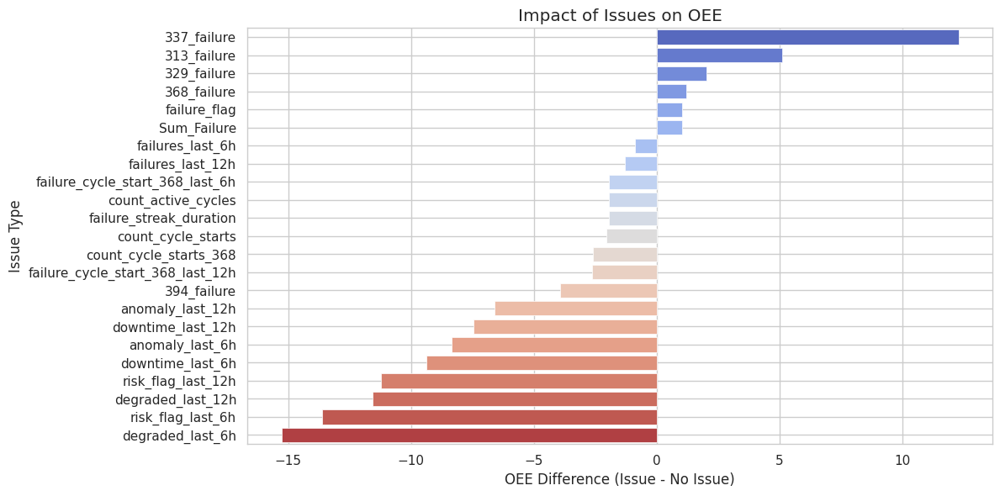

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the variables of interest
impact_vars = [
    'failure_flag', 'failures_last_6h', 'failures_last_12h',
    'Sum_Failure', 'count_cycle_starts', 'count_cycle_starts_368', 'count_active_cycles',
    'risk_flag_last_6h','risk_flag_last_12h', 'anomaly_last_6h', 'anomaly_last_12h', 'failure_streak_duration',
    'degraded_last_6h', 'degraded_last_12h', 'downtime_last_6h', 'downtime_last_12h',
    '368_failure', '394_failure', '313_failure', '329_failure', '337_failure',
    'failure_cycle_start_368_last_6h', 'failure_cycle_start_368_last_12h'

]

performance_metrics = [
    'oee'
]

# Analyze impact
impact_results = []

for issue in impact_vars:
    for metric in performance_metrics:
        group_means = df.groupby(df[issue] > 0)[metric].mean()
        delta = group_means.get(True, 0) - group_means.get(False, 0)
        impact_results.append({
            'Issue': issue,
            'Metric': metric,
            'Delta': round(delta, 2),
            'With_Issue': round(group_means.get(True, 0), 2),
            'Without_Issue': round(group_means.get(False, 0), 2)
        })

impact_df = pd.DataFrame(impact_results)

# Display full table sorted by impact delta
impact_df_sorted = impact_df.sort_values('Delta', ascending=False)
display(impact_df_sorted)

# Optional: Visualization
plt.figure(figsize=(12, 6))
sns.barplot(
    data=impact_df_sorted[impact_df_sorted['Metric'] == 'oee'],
    x='Delta', y='Issue', palette='coolwarm'
)
plt.title('Impact of Issues on OEE')
plt.xlabel('OEE Difference (Issue - No Issue)')
plt.ylabel('Issue Type')
plt.grid(True)
plt.tight_layout()
plt.show()


#### Statistical Test of Issues over OEE

,Issue,Metric,Delta,With_Issue,Without_Issue,T-test p,T-test Sig,MWU p,MWU Sig,Consistent Sig
19,337_failure,oee,12.29,58.34,46.06,NaN,False,NaN,False,False
17,313_failure,oee,5.12,51.18,46.06,4.13e-01,False,7.39e-01,False,False
18,329_failure,oee,2.03,48.09,46.06,NaN,False,NaN,False,False
15,368_failure,oee,1.22,47.23,46.01,4.03e-01,False,3.86e-01,False,False
0,failure_flag,oee,1.03,47.05,46.01,4.56e-01,False,5.05e-01,False,False
3,Sum_Failure,oee,1.03,47.05,46.01,4.56e-01,False,5.05e-01,False,False
1,failures_last_6h,oee,-0.88,45.32,46.20,2.72e-01,False,2.80e-01,False,False
2,failures_last_12h,oee,-1.30,45.07,46.37,5.91e-02,False,5.79e-02,False,False
20,failure_cycle_start_368_last_6h,oee,-1.93,44.23,46.16,1.23e-01,False,1.32e-01,False,False
6,count_active_cycles,oee,-1.94,45.29,47.24,9.61e-04,True,8.03e-03,True,True


/tmp/ipython-input-3603336167.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


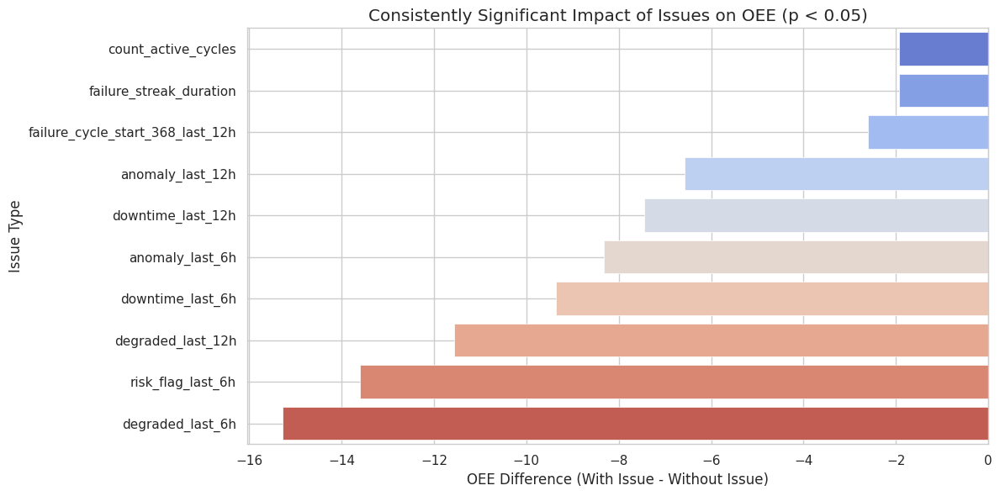

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind, mannwhitneyu

# Define variables
impact_vars = [
    'failure_flag', 'failures_last_6h', 'failures_last_12h',
    'Sum_Failure', 'count_cycle_starts', 'count_cycle_starts_368', 'count_active_cycles',
    'risk_flag_last_6h', 'anomaly_last_6h', 'anomaly_last_12h', 'failure_streak_duration',
    'degraded_last_6h', 'degraded_last_12h', 'downtime_last_6h', 'downtime_last_12h',
    '368_failure', '394_failure', '313_failure', '329_failure', '337_failure',
    'failure_cycle_start_368_last_6h', 'failure_cycle_start_368_last_12h'
]
performance_metrics = ['oee']

# Collect results
impact_results = []

for issue in impact_vars:
    if issue not in df.columns:
        continue

    for metric in performance_metrics:
        group_yes = df[df[issue] > 0][metric].dropna()
        group_no = df[df[issue] == 0][metric].dropna()

        if len(group_yes) < 5 or len(group_no) < 5:
            t_p = mw_p = None
        else:
            _, t_p = ttest_ind(group_yes, group_no, equal_var=False)
            _, mw_p = mannwhitneyu(group_yes, group_no, alternative='two-sided')

        mean_yes = group_yes.mean()
        mean_no = group_no.mean()
        delta = mean_yes - mean_no

        impact_results.append({
            'Issue': issue,
            'Metric': metric,
            'Delta': round(delta, 2),
            'With_Issue': round(mean_yes, 2),
            'Without_Issue': round(mean_no, 2),
            'T-test p': format(t_p, '.2e') if t_p is not None else 'NaN',
            'T-test Sig': t_p < 0.05 if t_p is not None else False,
            'MWU p': format(mw_p, '.2e') if mw_p is not None else 'NaN',
            'MWU Sig': mw_p < 0.05 if mw_p is not None else False,
            'Consistent Sig': (t_p is not None and mw_p is not None and t_p < 0.05 and mw_p < 0.05)
        })

# Compile into DataFrame
impact_df = pd.DataFrame(impact_results)
impact_df_sorted = impact_df.sort_values('Delta', ascending=False)
display(impact_df_sorted)

# Optional Plot: Significant Results by Delta
plt.figure(figsize=(12, 6))
sns.barplot(
    data=impact_df_sorted[(impact_df_sorted['Metric'] == 'oee') & (impact_df_sorted['Consistent Sig'])],
    x='Delta', y='Issue', palette='coolwarm'
)
plt.title('Consistently Significant Impact of Issues on OEE (p < 0.05)')
plt.xlabel('OEE Difference (With Issue - Without Issue)')
plt.ylabel('Issue Type')
plt.grid(True)
plt.tight_layout()
plt.show()

### Window Analysis

#### Windowed Risk Context around a failure

We are building 24-hour time windows (±12h) around each critical event, identified by count_cycle_starts_368 > 0, to analyze surrounding context — useful for detecting precursors or recovery patterns.

This code builds a contextual time window of ±12 hours around each critical event identified by the condition count_cycle_starts_368 > 0, which marks occurrences of a high-impact alarm. First, it ensures that the timestamp column is in datetime format and sorted chronologically. Then, for each critical event, it extracts a subset of the main DataFrame that includes all data points within 12 hours before and after the event. Each of these context windows is labeled with the event's timestamp (event_center) and the relative time difference in hours (hour_offset) to facilitate temporal analysis. Finally, all individual windows are concatenated into a single DataFrame (df_risk_windows), which can be used to analyze trends before and after failures, such as performance degradation or recovery patterns.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# --- Step 1: Prepare dataset
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp').reset_index(drop=True)

# --- Step 2: Identify critical events (Alarm 368 + Cycle Start)
event_mask = df['count_cycle_starts_368'] > 0
critical_events = df[event_mask].copy()

# --- Step 3: Create ±12h context windows for each event
time_window = pd.Timedelta(hours=12)
context_rows = []

for _, row in critical_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = (window['timestamp'] - ts).dt.total_seconds() // 3600
    context_rows.append(window)

df_risk_windows = pd.concat(context_rows, ignore_index=True)

# Optional: Add failure ID presence, OEE drop columns, etc. if needed
print("Context window built with shape:", df_risk_windows.shape)
df_risk_windows.head()

Context window built with shape: (1714, 130)


,timestamp,availability,operationalavailability,efficiency,oee,runningtime,mtbf,mttr,processed,produce,workingtime,netoperatingtime,effectivetimeexpectedproduction,internaldowntime,internalstops,nodatatime,externaltime,planneddowntime,productiontimeexpectedproduction,induceddowntime,equipmentdowntime,effectivetime,designspeed,avgprocessspeed,maxprocessspeed,minprocessspeed,recipe,MachineSpeed_max,hour,month,year,day_of_week,speed_deviation,speed_ratio_avg,speed_ratio_max,downtime_ratio,speed_deviation_last_6h,speed_deviation_last_12h,performance_rate,day_name,speed_quality,downtime_eff,is_stopped_unexpectedly,is_planned_stop,is_running_but_no_output,is_underperforming,is_low_speed,is_fully_stopped,is_normal,status_label,is_anomaly,pca_cluster,pca_cluster_label,Distinct_AlarmFaultId,Distinct_ValveNumber,Count_AlarmEvents,Sum_Recovery,Sum_Failure,Distinct_Valve_Failures,Shift_A_Failures,Shift_B_Failures,Shift_C_Failures,failure_flag,368_failure,368_recovery,394_failure,394_recovery,313_failure,313_recovery,329_failure,329_recovery,337_failure,337_recovery,combined_criticity,combined_criticity_desc,count_cycle_starts,count_cycle_starts_368,count_cycle_closed,count_active_cycles,failure_streak_duration,date,month_name,week,weekday,weekday_name,oee_lag_3,oee_lag_6,oee_lag_12,oee_lead_1,oee_lead_3,oee_lead_6,oee_lead_12,oee_plus_1,oee_plus_3,oee_plus_6,oee_plus_12,oee_minus_3,oee_minus_6,oee_minus_12,oee_drop_post_3,oee_drop_post_6,oee_drop_post_12,oee_drop_pre_3,oee_drop_pre_6,oee_drop_pre_12,failures_last_6h,failures_last_12h,failure_cycle_start_368_last_6h,failure_cycle_start_368_last_12h,anomaly_last_6h,anomaly_last_12h,was_degraded,was_planned,was_normal,degraded_last_6h,degraded_last_12h,downtime_last_6h,downtime_last_12h,degraded_count_6h,degraded_count_12h,risk_flag_last_6h,risk_count_last_6h,risk_flag_last_12h,risk_count_last_12h,cycle_start_368_occurred,failure_cycle_start,alarm368_cycle_start,hours_since_last_failure,event_center,hour_offset
0,2024-02-05 23:00:00+00:00,100.000000,66.722222,62.667053,60.073333,2402.0,2402.0,0.0,36044.0,36044.0,3600.0,2162.64,57516.666666,0.0,0.0,0.0,149.0,0.0,59999.0,1049.0,1049.0,3451.0,16.666667,10.01222,14.99333,1.39333,2.0,90.0,23,2,2024,0.0,-0.399267,0.600733,0.8996,0.291389,-0.641058,-0.632242,90.034971,Monday,1.5,1.0,False,False,False,False,False,False,True,Normal Operation,False,0.0,Normal,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,7.0,565,2024-02-05,February,6,1,Monday,8.043333,45.445000,45.478333,66.980000,65.295000,63.738333,42.288333,66.980000,62.784444,35.979167,37.744306,27.117222,33.456111,35.559583,-2.711111,24.094167,22.329028,32.956111,26.617222,24.513750,0.0,0.0,0.0,0.0,1.0,1.0,0,0,1,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,1.0,3.0,0,0,0,0,2024-02-06 11:00:00+00:00,-12.0
1,2024-02-06 00:00:00+00:00,100.000000,73.583333,66.980000,66.980000,2649.0,2649.0,0.0,40188.0,40188.0,3600.0,2411.28,60000.000000,0.0,0.0,0.0,0.0,0.0,60000.0,951.0,951.0,3600.0,16.666667,11.16333,14.99333,5.84000,2.0,90.0,0,2,2024,1.0,-0.330200,0.669800,0.8996,0.264167,-0.640208,-0.622557,91.026048,Tuesday,1.5,1.0,False,False,False,False,False,False,True,Normal Operation,False,0.0,Normal,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,7.0,566,2024-02-06,February,6,2,Tuesday,12.008333,66.470000,55.358333,46.093333,56.575000,61.650000,71.693333,46.093333,57.715556,42.416389,38.078889,44.460556,35.894167,36.775833,9.264444,24.563611,28.901111,22.519444,31.085833,30.204167,0.0,0.0,0.0,0.0,1.0,1.0,0,0,1,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,1.0,3.0,0,0,0,0,2024-02-06 11:00:00+00:00,-11.0
2,2024-02-06 01:00:00+00:00,97.584541,50.500000,46.093333,46.093333,1818.0,1818.0,45.0,27656.0,27656.0,3600.0,1659.36,60000.000000,45.0,1.0,0.0,0.0,0.0,60000.0,1737.0,1782.0,3600.0,16.666667,7.68222,14.72000,0.98667,2.0,90.0,1,2,2024,1.0,-0.539067,0.460933,0.8832,0.495000,-0.575836,-0.619211,91.273927,Tuesday,1.5,1.0,False,False,False,F

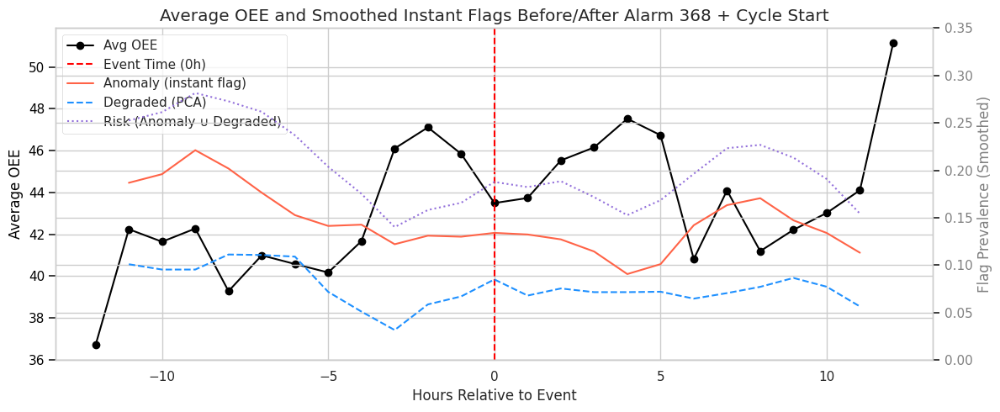

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Prep datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp').reset_index(drop=True)

# --- Flags
df['is_anomaly'] = df['is_anomaly'].astype(int)
df['is_degraded'] = (df['pca_cluster_label'].astype(str) == 'Degraded').astype(int)
df['risk_flag'] = ((df['is_anomaly'] == 1) | (df['is_degraded'] == 1)).astype(int)

# --- Critical events: Alarm 368 + cycle start
critical_events = df[df['count_cycle_starts_368'] > 0].copy()

# --- Time window collection
time_window = pd.Timedelta(hours=12)
context_rows = []

for _, row in critical_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = ((window['timestamp'] - ts).dt.total_seconds() // 3600).astype(int)
    context_rows.append(window)

df_risk_windows = pd.concat(context_rows, ignore_index=True)

# --- Aggregate per hour offset
agg_df = (
    df_risk_windows
    .groupby('hour_offset', as_index=False)
    .agg({
        'oee': 'mean',
        'is_anomaly': 'mean',
        'is_degraded': 'mean',
        'risk_flag': 'mean'
    })
    .sort_values('hour_offset')
)

# --- Apply rolling mean (window=3, centered)
agg_df['is_anomaly_smooth'] = agg_df['is_anomaly'].rolling(window=3, center=True).mean()
agg_df['is_degraded_smooth'] = agg_df['is_degraded'].rolling(window=3, center=True).mean()
agg_df['risk_flag_smooth'] = agg_df['risk_flag'].rolling(window=3, center=True).mean()

# --- Plot
fig, ax1 = plt.subplots(figsize=(12, 5))

# Primary axis: OEE
ax1.plot(agg_df['hour_offset'], agg_df['oee'], marker='o', label='Avg OEE', color='black')
ax1.axvline(x=0, color='red', linestyle='--', label='Event Time (0h)')
ax1.set_xlabel('Hours Relative to Event')
ax1.set_ylabel('Average OEE', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Secondary axis: smoothed flag prevalence
ax2 = ax1.twinx()
ax2.plot(agg_df['hour_offset'], agg_df['is_anomaly_smooth'], label='Anomaly (instant flag)', color='tomato')
ax2.plot(agg_df['hour_offset'], agg_df['is_degraded_smooth'], label='Degraded (PCA)', linestyle='--', color='dodgerblue')
ax2.plot(agg_df['hour_offset'], agg_df['risk_flag_smooth'], label='Risk (Anomaly ∪ Degraded)', linestyle=':', color='mediumpurple')
ax2.set_ylabel('Flag Prevalence (Smoothed)', color='gray')
ax2.tick_params(axis='y', labelcolor='gray')
ax2.set_ylim(0, 0.35)  # Optional: adjust based on data

# Legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title('Average OEE and Smoothed Instant Flags Before/After Alarm 368 + Cycle Start')
plt.grid(True)
plt.tight_layout()
plt.show()


#### Windowed risk context around degradation of oee

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# --- Step 1: Define OEE degradation events
# (Adjust threshold as needed)
df['oee_degradation_event'] = (df['oee_drop_pre_6'] < -10).astype(int)

# --- Step 2: Extract timestamps of degradation events
degradation_events = df[df['oee_degradation_event'] == 1].copy()

# --- Step 3: Build ±12h context windows around each degradation event
time_window = pd.Timedelta(hours=12)
context_rows = []

for _, row in degradation_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = (window['timestamp'] - ts).dt.total_seconds() // 3600
    context_rows.append(window)

df_degradation_windows = pd.concat(context_rows, ignore_index=True)


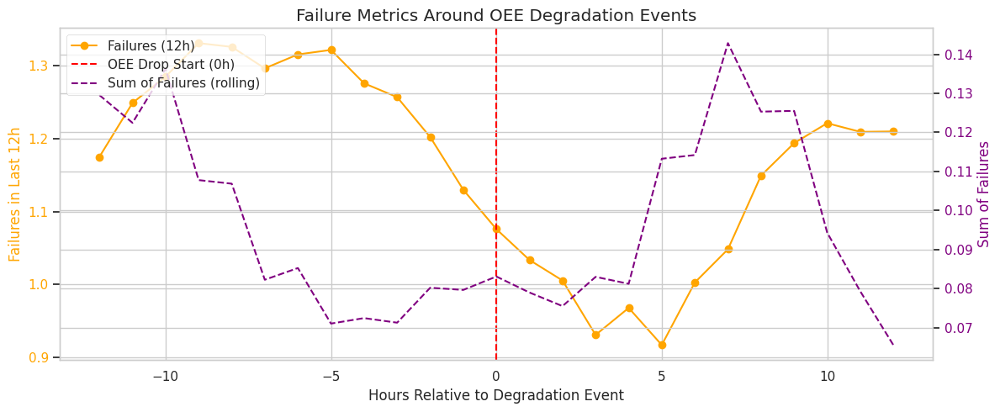

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Step 1: Define OEE degradation onset
df['oee_degradation_event'] = (df['oee_drop_pre_6'] < -10).astype(int)

# --- Step 2: Identify timestamps of degradation onsets
degradation_events = df[df['oee_degradation_event'] == 1].copy()

# --- Step 3: Build ±12h windows around each degradation event
time_window = pd.Timedelta(hours=12)
context_rows = []

for _, row in degradation_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = (window['timestamp'] - ts).dt.total_seconds() // 3600
    context_rows.append(window)

# --- Step 4: Combine all windows
df_degradation_windows = pd.concat(context_rows, ignore_index=True)

# --- Step 5: Compute average metrics per hour offset
agg_df = (
    df_degradation_windows
    .groupby('hour_offset')
    .agg({
        'failures_last_12h': 'mean',
        'Sum_Failure': 'mean'
    })
    .reset_index()
)

# --- Step 6: Smooth Sum_Failure using rolling average (optional)
agg_df['Sum_Failure_rolling'] = agg_df['Sum_Failure'].rolling(window=3, center=True, min_periods=1).mean()

# --- Step 7: Plot
fig, ax1 = plt.subplots(figsize=(12, 5))

# Left axis: Failures in last 12h
ax1.plot(agg_df['hour_offset'], agg_df['failures_last_12h'], marker='o', color='orange', label='Failures (12h)')
ax1.axvline(x=0, color='red', linestyle='--', label='OEE Drop Start (0h)')
ax1.set_ylabel("Failures in Last 12h", color='orange')
ax1.tick_params(axis='y', labelcolor='orange')

# Right axis: Smoothed Sum of Failures
ax2 = ax1.twinx()
ax2.plot(agg_df['hour_offset'], agg_df['Sum_Failure_rolling'], linestyle='--', color='purple', label='Sum of Failures (rolling)')
ax2.set_ylabel("Sum of Failures", color='purple')
ax2.tick_params(axis='y', labelcolor='purple')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
plt.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title("Failure Metrics Around OEE Degradation Events")
ax1.set_xlabel("Hours Relative to Degradation Event")
plt.grid(True)
plt.tight_layout()
plt.show()


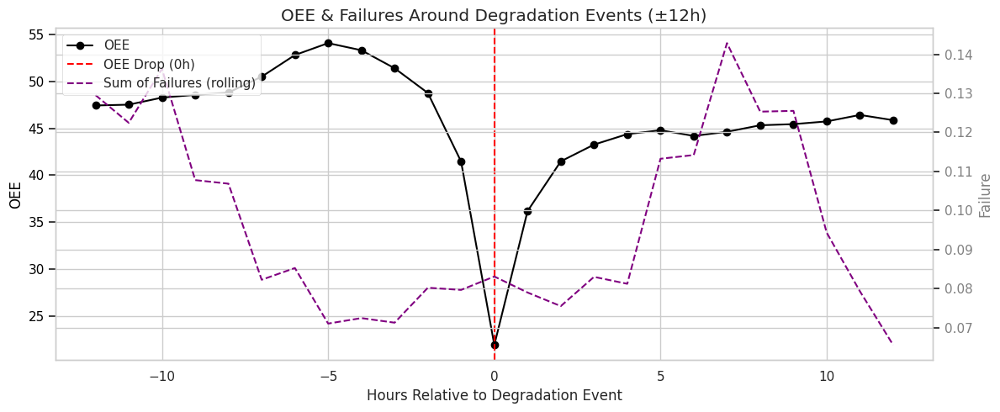

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Step 1: Define OEE degradation onset
df['oee_degradation_event'] = (df['oee_drop_pre_6'] < -10).astype(int)

# --- Step 2: Identify timestamps of degradation onsets
degradation_events = df[df['oee_degradation_event'] == 1].copy()

# --- Step 3: Build ±24h windows around each degradation event
time_window = pd.Timedelta(hours=12)
context_rows = []

for _, row in degradation_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = (window['timestamp'] - ts).dt.total_seconds() // 3600
    context_rows.append(window)

# --- Step 4: Combine all windows
df_degradation_windows = pd.concat(context_rows, ignore_index=True)

# --- Step 5: Compute average metrics per hour offset
agg_df = (
    df_degradation_windows
    .groupby('hour_offset')
    .agg({
        'Sum_Failure': 'mean',
        'oee': 'mean'
    })
    .reset_index()
)

# Optional: Smooth metrics
agg_df['Sum_Failure_rolling'] = agg_df['Sum_Failure'].rolling(window=3, center=True, min_periods=1).mean()

# --- Step 6: Plot
fig, ax1 = plt.subplots(figsize=(12, 5))

# Left Y-axis: OEE
ax1.plot(agg_df['hour_offset'], agg_df['oee'], marker='o', color='black', label='OEE')
ax1.axvline(x=0, color='red', linestyle='--', label='OEE Drop (0h)')
ax1.set_ylabel("OEE", color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Right Y-axis: Failures and Cycle Starts
ax2 = ax1.twinx()
ax2.plot(agg_df['hour_offset'], agg_df['Sum_Failure_rolling'], linestyle='--', color='purple', label='Sum of Failures (rolling)')
ax2.set_ylabel("Failure", color='gray')
ax2.tick_params(axis='y', labelcolor='gray')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
plt.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title("OEE & Failures Around Degradation Events (±12h)")
ax1.set_xlabel("Hours Relative to Degradation Event")
plt.grid(True)
plt.tight_layout()
plt.show()


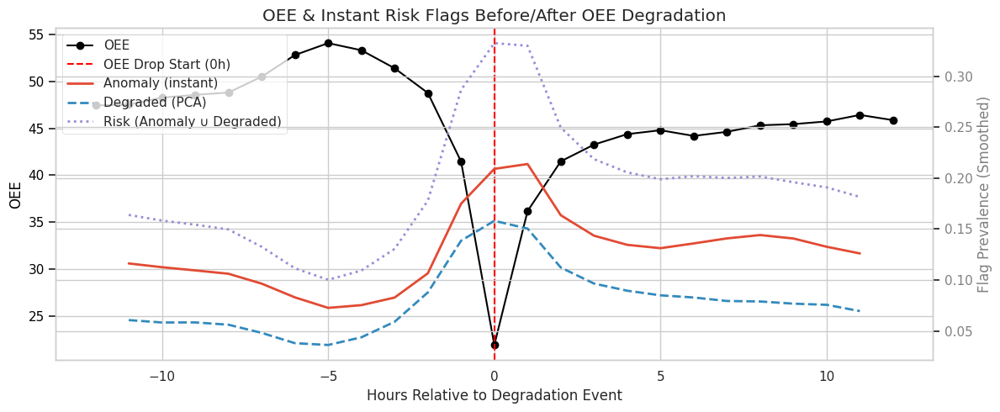

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Prep & flags
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp').reset_index(drop=True)

# Instant flags
df['is_anomaly']  = df['is_anomaly'].astype(int)
df['is_degraded'] = (df['pca_cluster_label'].astype(str) == 'Degraded').astype(int)
df['risk_flag']   = ((df['is_anomaly'] == 1) | (df['is_degraded'] == 1)).astype(int)

# --- 1) Define OEE degradation events (adjust threshold if needed)
df['oee_degradation_event'] = (df['oee_drop_pre_6'] < -10).astype(int)

# --- 2) Extract event timestamps
degradation_events = df[df['oee_degradation_event'] == 1].copy()
if degradation_events.empty:
    raise ValueError("No degradation events found with the current threshold.")

# --- 3) Build ±12h windows around each event
time_window = pd.Timedelta(hours=12)
context_rows = []

for _, row in degradation_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = ((window['timestamp'] - ts).dt.total_seconds() // 3600).astype(int)
    context_rows.append(window)

df_degradation_windows = pd.concat(context_rows, ignore_index=True)

# --- 4) Aggregate by hour offset (prevalence = mean of boolean flags)
agg_df = (
    df_degradation_windows
    .groupby('hour_offset', as_index=False)
    .agg({
        'oee': 'mean',
        'is_anomaly': 'mean',
        'is_degraded': 'mean',
        'risk_flag': 'mean'
    })
    .sort_values('hour_offset')
)

# Optional smoothing for readability
for col in ['is_anomaly', 'is_degraded', 'risk_flag']:
    agg_df[col + '_smooth'] = agg_df[col].rolling(window=3, center=True).mean()

# --- 5) Plot
fig, ax1 = plt.subplots(figsize=(12, 5))

# OEE (primary axis)
ax1.plot(agg_df['hour_offset'], agg_df['oee'], marker='o', color='black', label='OEE')
ax1.axvline(x=0, color='red', linestyle='--', label='OEE Drop Start (0h)')
ax1.set_xlabel("Hours Relative to Degradation Event")
ax1.set_ylabel("OEE", color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Flags prevalence (secondary axis, smoothed curves)
ax2 = ax1.twinx()
ax2.plot(agg_df['hour_offset'], agg_df['is_anomaly_smooth'],  label='Anomaly (instant)',  linewidth=2)
ax2.plot(agg_df['hour_offset'], agg_df['is_degraded_smooth'], label='Degraded (PCA)',     linestyle='--', linewidth=2)
ax2.plot(agg_df['hour_offset'], agg_df['risk_flag_smooth'],   label='Risk (Anomaly ∪ Degraded)', linestyle=':', linewidth=2)
ax2.set_ylabel("Flag Prevalence (Smoothed)", color='gray')
ax2.tick_params(axis='y', labelcolor='gray')
# ax2.set_ylim(0, 0.35)  # optional: fix range if helpful

# Legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title("OEE & Instant Risk Flags Before/After OEE Degradation")
plt.grid(True)
plt.tight_layout()
plt.show()

##### Statistical Test

In [ ]:
# Define "pre-event" window: -3h to 0h
pre_window = df_degradation_windows[df_degradation_windows['hour_offset'].between(-3, 0)]

# Define control group: timestamps far from degradation events
buffer = pd.Timedelta(hours=6)
df['is_near_degradation'] = df['timestamp'].apply(
    lambda ts: any((ts >= t - buffer) & (ts <= t + buffer) for t in degradation_events['timestamp'])
)
control_set = df[~df['is_near_degradation']]

# T-tests
for var in ['risk_flag_last_12h', 'risk_flag_last_6h', 'degraded_last_6h', 'anomaly_last_6h', 'degraded_last_12h', 'anomaly_last_12h', 'failures_last_6h', 'failures_last_12h', 'failure_cycle_start_368_last_6h', 'failure_cycle_start_368_last_12h','failure_streak_duration','count_active_cycles']:
    group1 = pre_window[var].dropna()
    group2 = control_set[var].dropna()
    t, p = ttest_ind(group1, group2, equal_var=False)
    print(f"\n--- {var} ---")
    print(f"Pre-Event Mean: {group1.mean():.2f} | Control Mean: {group2.mean():.2f}")
    print(f"T-test: t = {t:.2f}, p = {p:.4f} → {'Significant' if p < 0.05 else 'Not Significant'}")


--- risk_flag_last_12h ---
Pre-Event Mean: 0.70 | Control Mean: 0.95
T-test: t = -13.98, p = 0.0000 → Significant

--- risk_flag_last_6h ---
Pre-Event Mean: 0.45 | Control Mean: 0.74
T-test: t = -8.32, p = 0.0000 → Significant

--- degraded_last_6h ---
Pre-Event Mean: 0.21 | Control Mean: 0.53
T-test: t = -8.20, p = 0.0000 → Significant

--- anomaly_last_6h ---
Pre-Event Mean: 0.34 | Control Mean: 0.46
T-test: t = -3.02, p = 0.0030 → Significant

--- degraded_last_12h ---
Pre-Event Mean: 0.38 | Control Mean: 0.76
T-test: t = -11.34, p = 0.0000 → Significant

--- anomaly_last_12h ---
Pre-Event Mean: 0.58 | Control Mean: 0.71
T-test: t = -3.80, p = 0.0002 → Significant

--- failures_last_6h ---
Pre-Event Mean: 0.46 | Control Mean: 0.34
T-test: t = 1.12, p = 0.2629 → Not Significant

--- failures_last_12h ---
Pre-Event Mean: 1.16 | Control Mean: 0.60
T-test: t = 3.22, p = 0.0015 → Significant

--- failure_cycle_start_368_last_6h ---
Pre-Event Mean: 0.08 | Control Mean: 0.04
T-test: t = 2

## 5 | Machine Learning Performance Evaluation

### ML (Shap & Regression Model - Xgboost)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Select relevant features - you may want to adjust this list
features = [
    'availability','efficiency','runningtime','mtbf', 'mttr',
    'speed_deviation','speed_ratio_avg',

    'internaldowntime', 'internalstops', 'nodatatime', 'externaltime',

    'equipmentdowntime','downtime_ratio',
    'downtime_eff', 'workingtime', 'effectivetime',

    'planneddowntime', 'productiontimeexpectedproduction',

    'designspeed', 'maxprocessspeed', 'minprocessspeed',

    'Sum_Failure', 'Sum_Recovery',
    'failures_last_6h', 'failures_last_12h',
    'failure_streak_duration','count_cycle_starts','count_cycle_closed','count_cycle_starts_368','count_active_cycles',
    'failure_cycle_start_368_last_6h', 'failure_cycle_start_368_last_12h'
]

# Remove timestamp and other non-numeric or target-related columns
X = df[features]
y = df['oee']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score

# Train XGBoost model
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
model.fit(X_train, y_train)

# Evaluate
y_pred = model.predict(X_test)
print(f"R² Score: {r2_score(y_test, y_pred):.3f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.3f}")

R² Score: 0.965
RMSE: 4.683


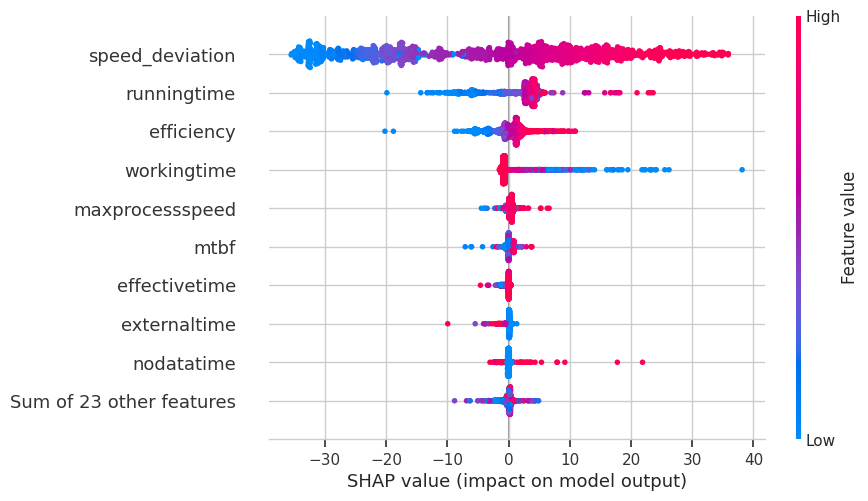

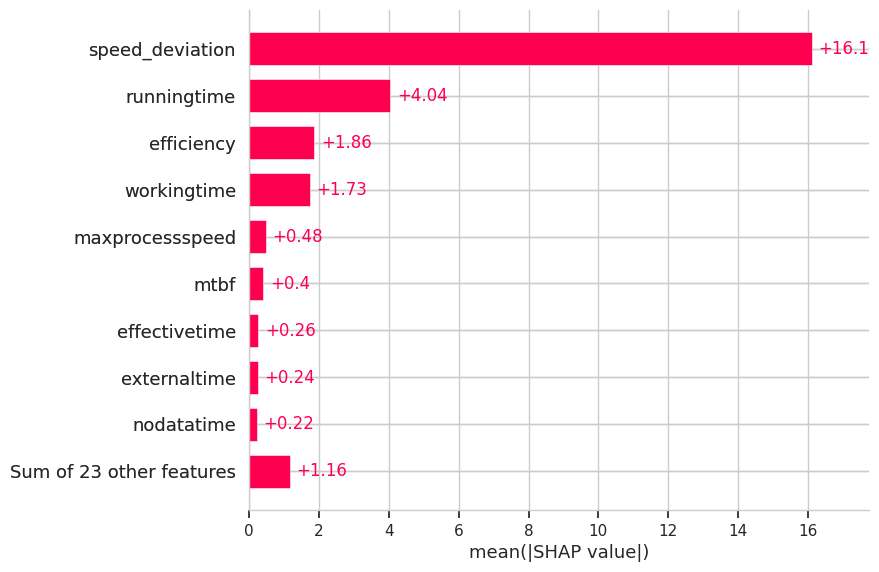

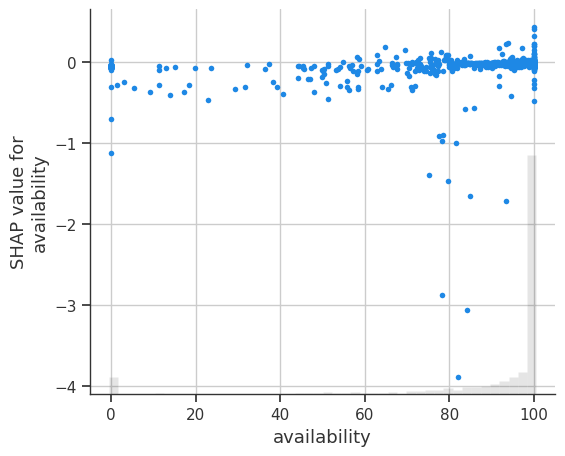

In [ ]:
import shap

# Explain the model's predictions using SHAP
explainer = shap.Explainer(model)
shap_values = explainer(X_test)

# Create beeswarm plot like in your example
shap.plots.beeswarm(shap_values)

# You can also create other useful plots:
# Force plot for a single prediction
shap.plots.force(shap_values[0])

# Summary plot (alternative to beeswarm)
shap.plots.bar(shap_values)

# Dependence plot for a specific feature
shap.plots.scatter(shap_values[:, "availability"])

### Feature Importance

Feature Importance:
                             Feature  Importance
5                    speed_deviation    0.689686
2                        runningtime    0.124078
14                       workingtime    0.056231
1                         efficiency    0.026533
18                       designspeed    0.022883
9                         nodatatime    0.021355
17  productiontimeexpectedproduction    0.017675
3                               mtbf    0.009306
19                   maxprocessspeed    0.008167
10                      externaltime    0.004036
13                      downtime_eff    0.002249
30   failure_cycle_start_368_last_6h    0.001847
15                     effectivetime    0.001828
4                               mttr    0.001774
24                 failures_last_12h    0.001774
16                   planneddowntime    0.001765
31  failure_cycle_start_368_last_12h    0.001658
8                      internalstops    0.001448
12                    downtime_ratio    0.001413


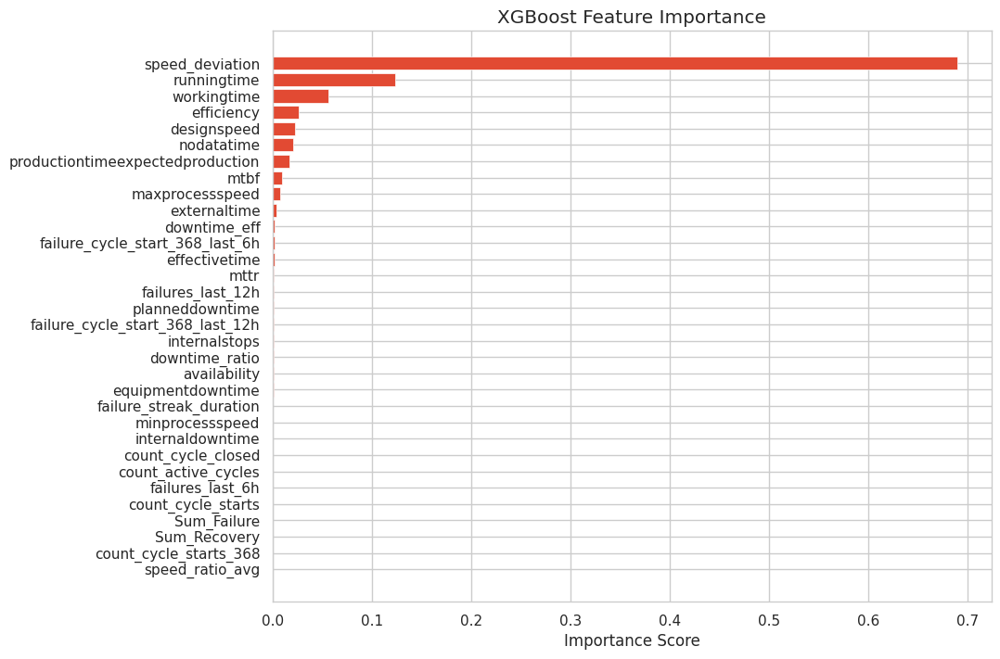

In [ ]:
# Get feature importance from XGBoost
importance = model.feature_importances_
feat_importance = pd.DataFrame({
    'Feature': features,
    'Importance': importance
}).sort_values('Importance', ascending=False)

print("Feature Importance:")
print(feat_importance)

# Plot feature importance
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.barh(feat_importance['Feature'], feat_importance['Importance'])
plt.xlabel('Importance Score')
plt.title('XGBoost Feature Importance')
plt.gca().invert_yaxis()
plt.show()

### SHAP Analysis for OEE with Failure-Related Features Only

In [ ]:
# Select only failure-related features
failure_features = [
    'Sum_Recovery', 'Sum_Failure',
    'Shift_A_Failures',
    'Shift_B_Failures', 'Shift_C_Failures',
    '368_failure', '394_failure', '313_failure',
    '329_failure', '337_failure',
    '368_recovery', '394_recovery', '313_recovery',
    '329_recovery', '337_recovery',
    'Distinct_AlarmFaultId', 'Count_AlarmEvents',
    'Distinct_Valve_Failures', 'combined_criticity',
    'failures_last_6h', 'failures_last_12h',
    'failure_streak_duration','count_cycle_starts','count_cycle_closed','count_cycle_starts_368','count_active_cycles',
    'failure_cycle_start_368_last_6h', 'failure_cycle_start_368_last_12h'
]

# Filter the dataset
X_failure = df[failure_features].copy()
y_failure = df['oee']  # Target remains OEE

print(X_failure.shape)
print(y_failure.shape)

# Split data
X_train_f, X_test_f, y_train_f, y_test_f = train_test_split(
    X_failure, y_failure, test_size=0.2, random_state=42
)

(7662, 28)
(7662,)


In [ ]:
# Convert to numpy arrays
X_train_array = X_train_f.to_numpy()
y_train_array = y_train_f.to_numpy()

# Verify shapes
print(f"X_train_array shape: {X_train_array.shape}")
print(f"y_train_array shape: {y_train_array.shape}")

# Train model with arrays
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
model.fit(X_train_array, y_train_array)

X_train_array shape: (6129, 28)
y_train_array shape: (6129,)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
# Convert test data to numpy arrays
X_test_array = X_test_f.to_numpy()
y_test_array = y_test_f.to_numpy()

# Make predictions
y_pred_f = model.predict(X_test_array)

# Calculate metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Calculate all metrics safely
r2 = r2_score(y_test_array, y_pred_f)
rmse = np.sqrt(mean_squared_error(y_test_array, y_pred_f))

print("\nModel Evaluation Metrics:")
print(f"R² Score: {r2:.4f} (Best=1.0)")
print(f"RMSE: {rmse:.4f} (Lower is better)")


Model Evaluation Metrics:
R² Score: 0.1090 (Best=1.0)
RMSE: 23.6759 (Lower is better)


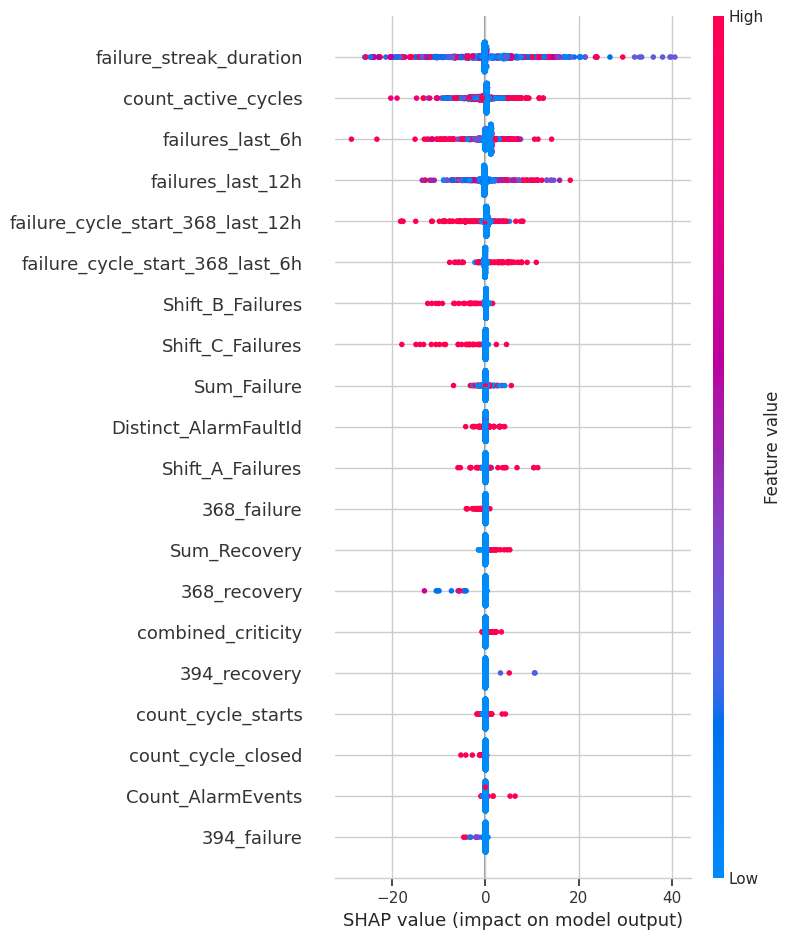

In [ ]:
import shap

# Create TreeExplainer instead of generic Explainer
explainer = shap.TreeExplainer(model)

# Calculate SHAP values - convert to numpy array if needed
shap_values = explainer.shap_values(X_test_f.values)  # or X_test_f.to_numpy()

# Create beeswarm plot
shap.summary_plot(shap_values, X_test_f, plot_type="dot")

In [ ]:
# First create the explanation object
explanation = shap.Explanation(
    values=shap_values,
    base_values=explainer.expected_value,
    data=X_test_f.values,
    feature_names=X_test_f.columns.tolist()
)

# Now use this explanation object for all plots

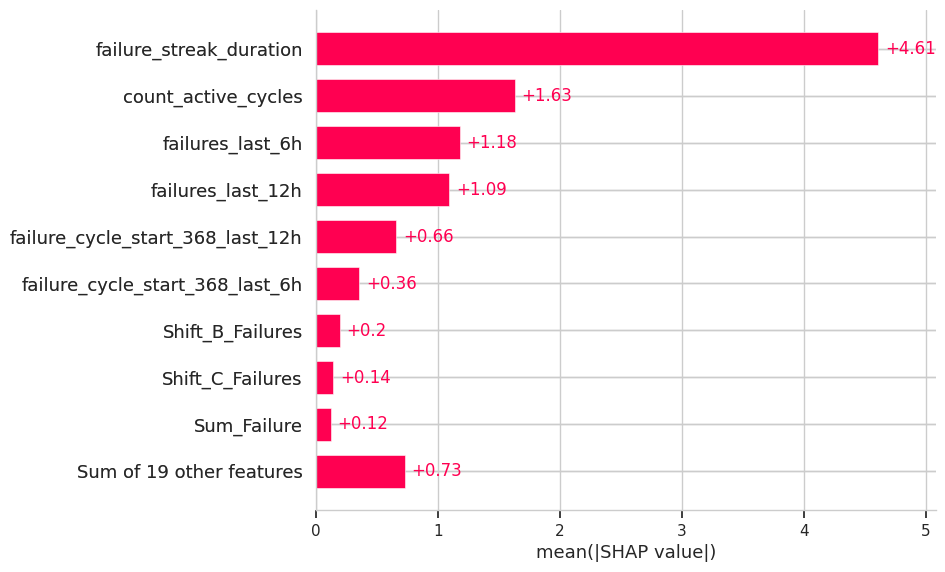

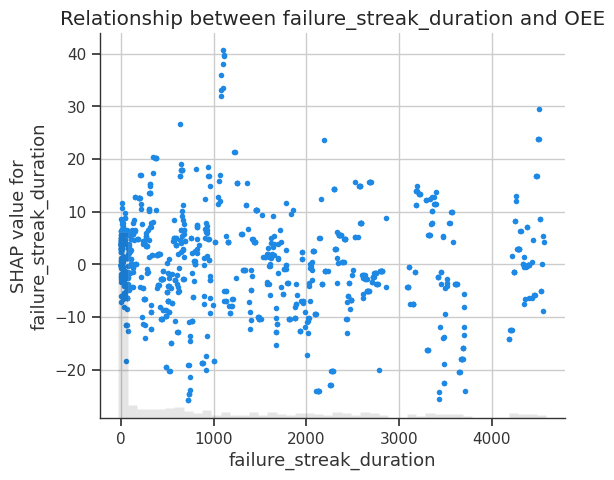

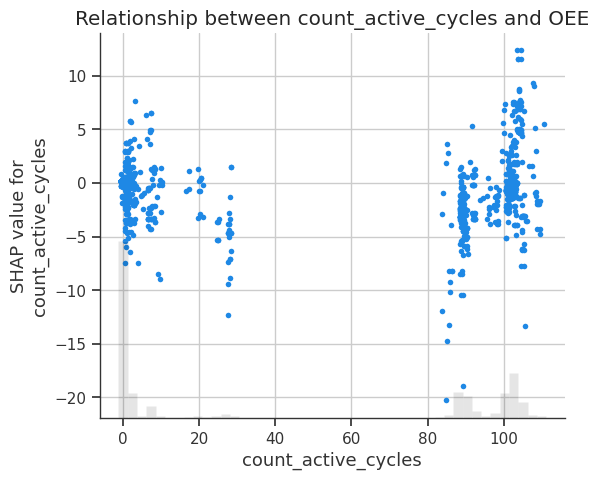

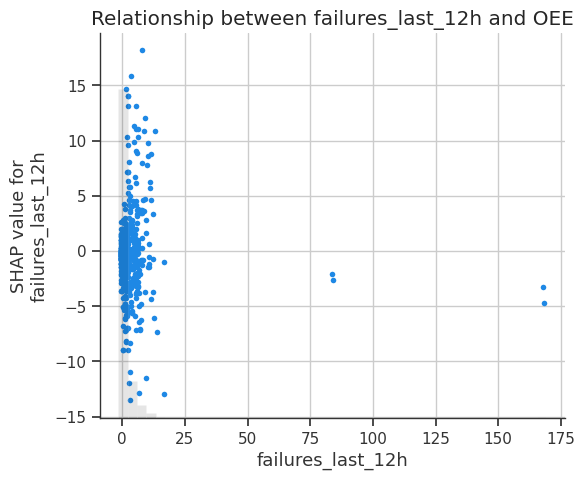

In [ ]:
# 1. Beeswarm plot
plt.figure()
#shap.plots.beeswarm(explanation, show=False)
#plt.title("Impact of Failure-Related Features on OEE")
#plt.tight_layout()
#plt.show()

# 2. Bar plot
shap.plots.bar(explanation)

# 3. Dependence plots
for feature in ['failure_streak_duration', 'count_active_cycles','failures_last_12h']:
    shap.plots.scatter(
        explanation[:, feature],
        show=False,
        x_jitter=1.0  # Adds some jitter for better visualization
    )
    plt.title(f"Relationship between {feature} and OEE")
    plt.show()

<Figure size 1000x600 with 0 Axes>

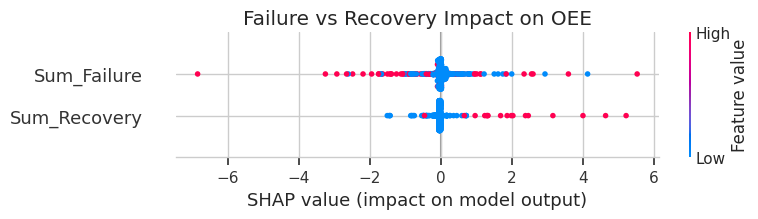

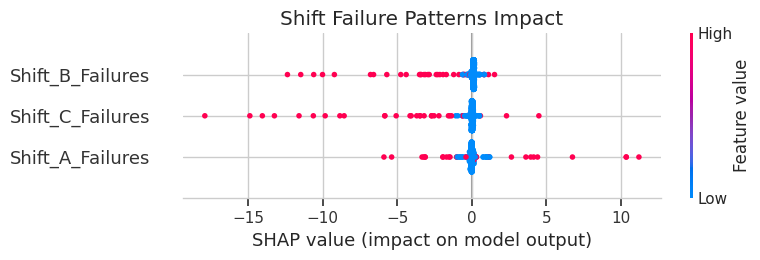

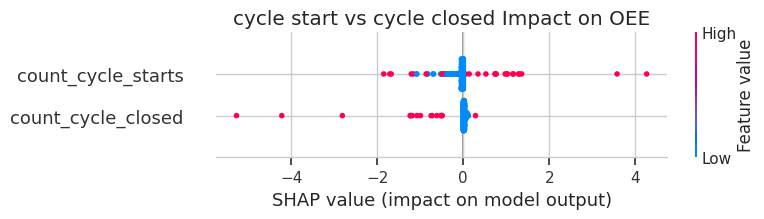

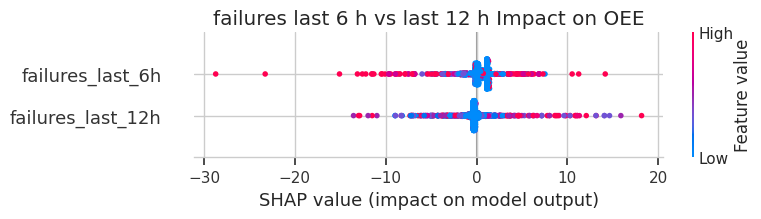

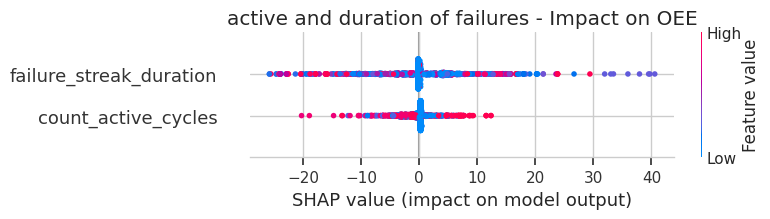

In [ ]:
import shap
import matplotlib.pyplot as plt

# 1. Create explainer and get SHAP values
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_test_f.values)  # This returns an Explanation object

# 2. Ensure feature names are properly set (if they're not already)
if not hasattr(shap_values, 'feature_names') or shap_values.feature_names is None:
    shap_values.feature_names = X_test_f.columns.tolist()

# 3. Create plots with proper feature names
# Beeswarm plot
plt.figure(figsize=(10, 6))
#shap.plots.beeswarm(shap_values, show=False)
#plt.title("SHAP Values for Failure Features")
#plt.tight_layout()
#plt.show()

# Bar plot
#plt.figure(figsize=(10, 6))
#shap.plots.bar(shap_values, show=False)
#plt.title("Mean Absolute SHAP Values")
#plt.tight_layout()
#plt.show()

# For specific feature subsets
def plot_feature_subset(features, title):
    """Helper function to plot specific features with names"""
    indices = [X_test_f.columns.get_loc(f) for f in features]
    plt.figure(figsize=(10, 6))
    shap.plots.beeswarm(shap_values[:, indices], show=False)
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Compare failure vs recovery
plot_feature_subset(
    ['Sum_Failure', 'Sum_Recovery'],
    "Failure vs Recovery Impact on OEE"
)

# Compare shift failures
plot_feature_subset(
    ['Shift_A_Failures', 'Shift_B_Failures', 'Shift_C_Failures'],
    "Shift Failure Patterns Impact"
)

# Compare cycle start vs closed
plot_feature_subset(
    ['count_cycle_starts','count_cycle_closed'],
    "cycle start vs cycle closed Impact on OEE"
)

# Compare failures last 6h vs 12h
plot_feature_subset(
    ['failures_last_6h', 'failures_last_12h'],
    "failures last 6 h vs last 12 h Impact on OEE"
)

# Compare active cycles and duration
plot_feature_subset(
    ['count_active_cycles', 'failure_streak_duration'],
    "active and duration of failures - Impact on OEE"
)

# 6 | Windowed Analysis of Speed Deviations
Replicates the OEE time-window analysis using:
- `speed_deviation`
- `speed_deviation_last_6h`
- `speed_deviation_last_12h`


## Windowed Risk Context around a failure

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# --- Step 1: Prepare dataset
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp').reset_index(drop=True)

# --- Step 2: Identify critical events (Alarm 368 + Cycle Start)
event_mask = df['count_cycle_starts_368'] > 0
critical_events = df[event_mask].copy()

# --- Step 3: Create ±12h context windows for each event
time_window = pd.Timedelta(hours=12)
context_rows = []

for _, row in critical_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = (window['timestamp'] - ts).dt.total_seconds() // 3600
    context_rows.append(window)

df_risk_windows = pd.concat(context_rows, ignore_index=True)

# Optional: Add failure ID presence, OEE drop columns, etc. if needed
print("Context window built with shape:", df_risk_windows.shape)
df_risk_windows.head()

Context window built with shape: (1714, 134)


,timestamp,availability,operationalavailability,efficiency,oee,runningtime,mtbf,mttr,processed,produce,workingtime,netoperatingtime,effectivetimeexpectedproduction,internaldowntime,internalstops,nodatatime,externaltime,planneddowntime,productiontimeexpectedproduction,induceddowntime,equipmentdowntime,effectivetime,designspeed,avgprocessspeed,maxprocessspeed,minprocessspeed,recipe,MachineSpeed_max,hour,month,year,day_of_week,speed_deviation,speed_ratio_avg,speed_ratio_max,downtime_ratio,speed_deviation_last_6h,speed_deviation_last_12h,performance_rate,day_name,speed_quality,downtime_eff,is_stopped_unexpectedly,is_planned_stop,is_running_but_no_output,is_underperforming,is_low_speed,is_fully_stopped,is_normal,status_label,is_anomaly,pca_cluster,pca_cluster_label,Distinct_AlarmFaultId,Distinct_ValveNumber,Count_AlarmEvents,Sum_Recovery,Sum_Failure,Distinct_Valve_Failures,Shift_A_Failures,Shift_B_Failures,Shift_C_Failures,failure_flag,368_failure,368_recovery,394_failure,394_recovery,313_failure,313_recovery,329_failure,329_recovery,337_failure,337_recovery,combined_criticity,combined_criticity_desc,count_cycle_starts,count_cycle_starts_368,count_cycle_closed,count_active_cycles,failure_streak_duration,date,month_name,week,weekday,weekday_name,oee_lag_3,oee_lag_6,oee_lag_12,oee_lead_1,oee_lead_3,oee_lead_6,oee_lead_12,oee_plus_1,oee_plus_3,oee_plus_6,oee_plus_12,oee_minus_3,oee_minus_6,oee_minus_12,oee_drop_post_3,oee_drop_post_6,oee_drop_post_12,oee_drop_pre_3,oee_drop_pre_6,oee_drop_pre_12,failures_last_6h,failures_last_12h,failure_cycle_start_368_last_6h,failure_cycle_start_368_last_12h,anomaly_last_6h,anomaly_last_12h,was_degraded,was_planned,was_normal,degraded_last_6h,degraded_last_12h,downtime_last_6h,downtime_last_12h,degraded_count_6h,degraded_count_12h,risk_flag_last_6h,risk_count_last_6h,risk_flag_last_12h,risk_count_last_12h,cycle_start_368_occurred,failure_cycle_start,alarm368_cycle_start,hours_since_last_failure,is_degraded,risk_flag,oee_degradation_event,is_near_degradation,event_center,hour_offset
0,2024-02-05 23:00:00+00:00,100.000000,66.722222,62.667053,60.073333,2402.0,2402.0,0.0,36044.0,36044.0,3600.0,2162.64,57516.666666,0.0,0.0,0.0,149.0,0.0,59999.0,1049.0,1049.0,3451.0,16.666667,10.01222,14.99333,1.39333,2.0,90.0,23,2,2024,0.0,-0.399267,0.600733,0.8996,0.291389,-0.641058,-0.632242,90.034971,Monday,1.5,1.0,False,False,False,False,False,False,True,Normal Operation,0,0.0,Normal,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,7.0,565,2024-02-05,February,6,1,Monday,8.043333,45.445000,45.478333,66.980000,65.295000,63.738333,42.288333,66.980000,62.784444,35.979167,37.744306,27.117222,33.456111,35.559583,-2.711111,24.094167,22.329028,32.956111,26.617222,24.513750,0.0,0.0,0.0,0.0,1.0,1.0,0,0,1,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,1.0,3.0,0,0,0,0,0,0,0,True,2024-02-06 11:00:00+00:00,-12.0
1,2024-02-06 00:00:00+00:00,100.000000,73.583333,66.980000,66.980000,2649.0,2649.0,0.0,40188.0,40188.0,3600.0,2411.28,60000.000000,0.0,0.0,0.0,0.0,0.0,60000.0,951.0,951.0,3600.0,16.666667,11.16333,14.99333,5.84000,2.0,90.0,0,2,2024,1.0,-0.330200,0.669800,0.8996,0.264167,-0.640208,-0.622557,91.026048,Tuesday,1.5,1.0,False,False,False,False,False,False,True,Normal Operation,0,0.0,Normal,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,7.0,566,2024-02-06,February,6,2,Tuesday,12.008333,66.470000,55.358333,46.093333,56.575000,61.650000,71.693333,46.093333,57.715556,42.416389,38.078889,44.460556,35.894167,36.775833,9.264444,24.563611,28.901111,22.519444,31.085833,30.204167,0.0,0.0,0.0,0.0,1.0,1.0,0,0,1,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,1.0,3.0,0,0,0,0,0,0,0,True,2024-02-06 11:00:00+00:00,-11.0
2,2024-02-06 01:00:00+00:00,97.584541,50.500000,46.093333,46.093333,1818.0,1818.0,45.0,27656.0,27656.0,3600.0,1659.36,60000.000000,45.0,1.0,0.0,0.0,0.0,60000.0,1737.0,1782.0,3600.0,16.666667,7.68222,14.72000,0.98667,2.0,90.0,1,2,2024,1.0,-0.539067,0.460933,0.8

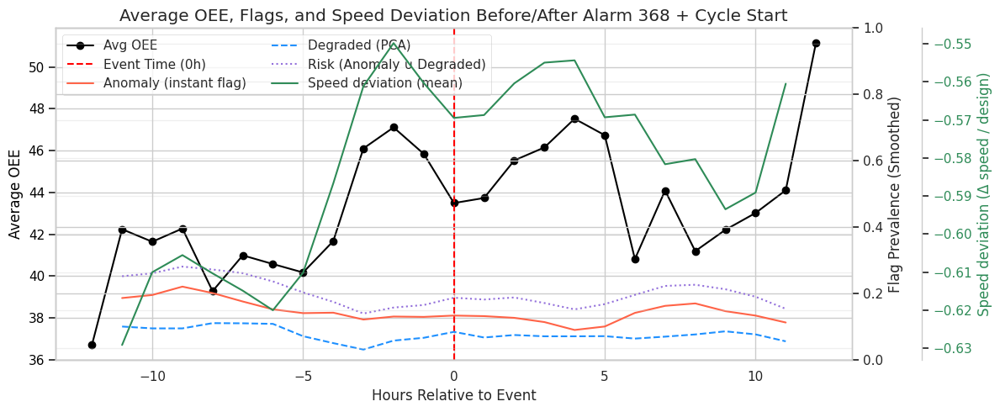

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Prep datetime
df = df.copy()
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp').reset_index(drop=True)

# --- Flags
df['is_anomaly']  = df['is_anomaly'].astype(int)
df['is_degraded'] = (df['pca_cluster_label'].astype(str) == 'Degraded').astype(int)
df['risk_flag']   = ((df['is_anomaly'] == 1) | (df['is_degraded'] == 1)).astype(int)

# --- Critical events: Alarm 368 + cycle start
critical_events = df[df['count_cycle_starts_368'] > 0].copy()
if critical_events.empty:
    print("No Alarm 368 cycle-start events found.")
else:
    # --- Time window collection
    time_window = pd.Timedelta(hours=12)
    context_rows = []
    for _, row in critical_events.iterrows():
        ts = row['timestamp']
        window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
        window['event_center'] = ts
        window['hour_offset'] = np.floor((window['timestamp'] - ts).dt.total_seconds() / 3600).astype(int)
        context_rows.append(window)

    df_risk_windows = pd.concat(context_rows, ignore_index=True)

    # --- Aggregate per hour offset (include speed_deviation mean)
    agg_df = (
        df_risk_windows
        .groupby('hour_offset', as_index=False)
        .agg({
            'oee': 'mean',
            'is_anomaly': 'mean',
            'is_degraded': 'mean',
            'risk_flag': 'mean',
            'speed_deviation': 'mean'
        })
        .sort_values('hour_offset')
    )

    # --- Smooth
    agg_df['is_anomaly_smooth']  = agg_df['is_anomaly'].rolling(3, center=True).mean()
    agg_df['is_degraded_smooth'] = agg_df['is_degraded'].rolling(3, center=True).mean()
    agg_df['risk_flag_smooth']   = agg_df['risk_flag'].rolling(3, center=True).mean()
    agg_df['speed_dev_smooth']   = agg_df['speed_deviation'].rolling(3, center=True).mean()

    # --- Plot
    fig, ax1 = plt.subplots(figsize=(12, 5))

    # Left axis: OEE
    ax1.plot(agg_df['hour_offset'], agg_df['oee'], marker='o', label='Avg OEE', color='black')
    ax1.axvline(x=0, color='red', linestyle='--', label='Event Time (0h)')
    ax1.set_xlabel('Hours Relative to Event')
    ax1.set_ylabel('Average OEE', color='black')
    ax1.tick_params(axis='y', labelcolor='black')

    # Right axis #1: flags (0..1)
    ax2 = ax1.twinx()
    ax2.plot(agg_df['hour_offset'], agg_df['is_anomaly_smooth'],  label='Anomaly (instant flag)',     color='tomato')
    ax2.plot(agg_df['hour_offset'], agg_df['is_degraded_smooth'], label='Degraded (PCA)',             linestyle='--', color='dodgerblue')
    ax2.plot(agg_df['hour_offset'], agg_df['risk_flag_smooth'],   label='Risk (Anomaly ∪ Degraded)', linestyle=':',  color='mediumpurple')
    ax2.set_ylabel('Flag Prevalence (Smoothed)')
    ax2.set_ylim(0, 1)  # flags are proportions
    ax2.tick_params(axis='y')

    # Right axis #2: speed deviation (own scale)
    ax3 = ax1.twinx()
    ax3.spines['right'].set_position(('outward', 60))
    ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_smooth'], label='Speed deviation (mean)', color='seagreen')
    ax3.set_ylabel('Speed deviation (Δ speed / design)', color='seagreen')
    ax3.tick_params(axis='y', labelcolor='seagreen')

    # Legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    lines3, labels3 = ax3.get_legend_handles_labels()
    ax1.legend(lines1 + lines2 + lines3, labels1 + labels2 + labels3, loc='upper left', ncol=2)

    plt.title('Average OEE, Flags, and Speed Deviation Before/After Alarm 368 + Cycle Start')
    plt.grid(True, axis='both', alpha=0.3)
    plt.tight_layout()
    plt.show()


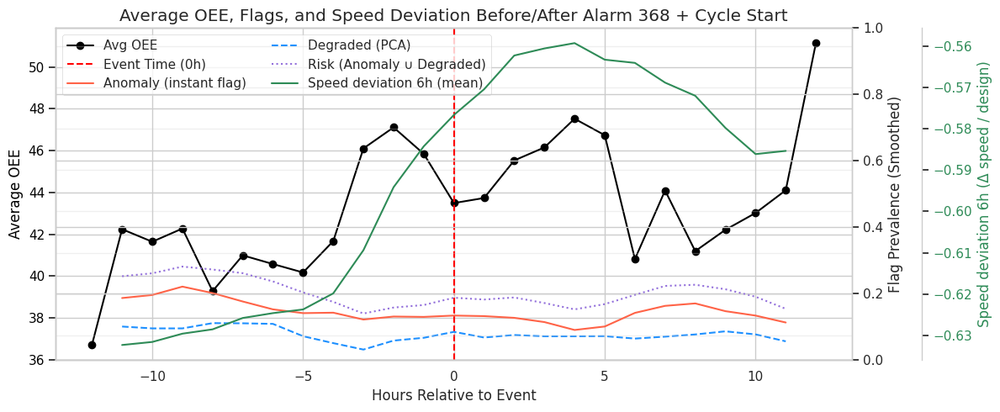

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Prep datetime
df = df.copy()
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp').reset_index(drop=True)

# --- Flags
df['is_anomaly']  = df['is_anomaly'].astype(int)
df['is_degraded'] = (df['pca_cluster_label'].astype(str) == 'Degraded').astype(int)
df['risk_flag']   = ((df['is_anomaly'] == 1) | (df['is_degraded'] == 1)).astype(int)

# --- Critical events: Alarm 368 + cycle start
critical_events = df[df['count_cycle_starts_368'] > 0].copy()
if critical_events.empty:
    print("No Alarm 368 cycle-start events found.")
else:
    # --- Time window collection
    time_window = pd.Timedelta(hours=12)
    context_rows = []
    for _, row in critical_events.iterrows():
        ts = row['timestamp']
        window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
        window['event_center'] = ts
        window['hour_offset'] = np.floor((window['timestamp'] - ts).dt.total_seconds() / 3600).astype(int)
        context_rows.append(window)

    df_risk_windows = pd.concat(context_rows, ignore_index=True)

    # --- Aggregate per hour offset (include speed_deviation mean)
    agg_df = (
        df_risk_windows
        .groupby('hour_offset', as_index=False)
        .agg({
            'oee': 'mean',
            'is_anomaly': 'mean',
            'is_degraded': 'mean',
            'risk_flag': 'mean',
            'speed_deviation_last_6h': 'mean'
        })
        .sort_values('hour_offset')
    )

    # --- Smooth
    agg_df['is_anomaly_smooth']  = agg_df['is_anomaly'].rolling(3, center=True).mean()
    agg_df['is_degraded_smooth'] = agg_df['is_degraded'].rolling(3, center=True).mean()
    agg_df['risk_flag_smooth']   = agg_df['risk_flag'].rolling(3, center=True).mean()
    agg_df['speed_dev_smooth']   = agg_df['speed_deviation_last_6h'].rolling(3, center=True).mean()

    # --- Plot
    fig, ax1 = plt.subplots(figsize=(12, 5))

    # Left axis: OEE
    ax1.plot(agg_df['hour_offset'], agg_df['oee'], marker='o', label='Avg OEE', color='black')
    ax1.axvline(x=0, color='red', linestyle='--', label='Event Time (0h)')
    ax1.set_xlabel('Hours Relative to Event')
    ax1.set_ylabel('Average OEE', color='black')
    ax1.tick_params(axis='y', labelcolor='black')

    # Right axis #1: flags (0..1)
    ax2 = ax1.twinx()
    ax2.plot(agg_df['hour_offset'], agg_df['is_anomaly_smooth'],  label='Anomaly (instant flag)',     color='tomato')
    ax2.plot(agg_df['hour_offset'], agg_df['is_degraded_smooth'], label='Degraded (PCA)',             linestyle='--', color='dodgerblue')
    ax2.plot(agg_df['hour_offset'], agg_df['risk_flag_smooth'],   label='Risk (Anomaly ∪ Degraded)', linestyle=':',  color='mediumpurple')
    ax2.set_ylabel('Flag Prevalence (Smoothed)')
    ax2.set_ylim(0, 1)  # flags are proportions
    ax2.tick_params(axis='y')

    # Right axis #2: speed deviation (own scale)
    ax3 = ax1.twinx()
    ax3.spines['right'].set_position(('outward', 60))
    ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_smooth'], label='Speed deviation 6h (mean)', color='seagreen')
    ax3.set_ylabel('Speed deviation 6h (Δ speed / design)', color='seagreen')
    ax3.tick_params(axis='y', labelcolor='seagreen')

    # Legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    lines3, labels3 = ax3.get_legend_handles_labels()
    ax1.legend(lines1 + lines2 + lines3, labels1 + labels2 + labels3, loc='upper left', ncol=2)

    plt.title('Average OEE, Flags, and Speed Deviation Before/After Alarm 368 + Cycle Start')
    plt.grid(True, axis='both', alpha=0.3)
    plt.tight_layout()
    plt.show()


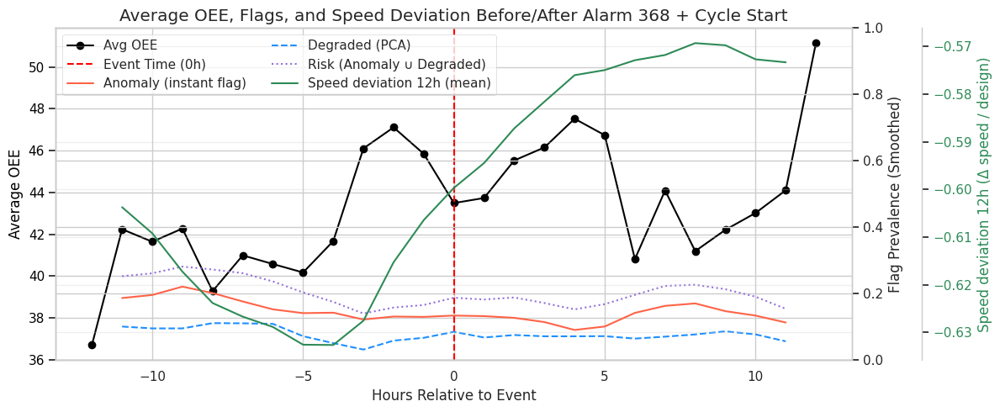

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Prep datetime
df = df.copy()
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp').reset_index(drop=True)

# --- Flags
df['is_anomaly']  = df['is_anomaly'].astype(int)
df['is_degraded'] = (df['pca_cluster_label'].astype(str) == 'Degraded').astype(int)
df['risk_flag']   = ((df['is_anomaly'] == 1) | (df['is_degraded'] == 1)).astype(int)

# --- Critical events: Alarm 368 + cycle start
critical_events = df[df['count_cycle_starts_368'] > 0].copy()
if critical_events.empty:
    print("No Alarm 368 cycle-start events found.")
else:
    # --- Time window collection
    time_window = pd.Timedelta(hours=12)
    context_rows = []
    for _, row in critical_events.iterrows():
        ts = row['timestamp']
        window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
        window['event_center'] = ts
        window['hour_offset'] = np.floor((window['timestamp'] - ts).dt.total_seconds() / 3600).astype(int)
        context_rows.append(window)

    df_risk_windows = pd.concat(context_rows, ignore_index=True)

    # --- Aggregate per hour offset (include speed_deviation mean)
    agg_df = (
        df_risk_windows
        .groupby('hour_offset', as_index=False)
        .agg({
            'oee': 'mean',
            'is_anomaly': 'mean',
            'is_degraded': 'mean',
            'risk_flag': 'mean',
            'speed_deviation_last_12h': 'mean'
        })
        .sort_values('hour_offset')
    )

    # --- Smooth
    agg_df['is_anomaly_smooth']  = agg_df['is_anomaly'].rolling(3, center=True).mean()
    agg_df['is_degraded_smooth'] = agg_df['is_degraded'].rolling(3, center=True).mean()
    agg_df['risk_flag_smooth']   = agg_df['risk_flag'].rolling(3, center=True).mean()
    agg_df['speed_dev_smooth']   = agg_df['speed_deviation_last_12h'].rolling(3, center=True).mean()

    # --- Plot
    fig, ax1 = plt.subplots(figsize=(12, 5))

    # Left axis: OEE
    ax1.plot(agg_df['hour_offset'], agg_df['oee'], marker='o', label='Avg OEE', color='black')
    ax1.axvline(x=0, color='red', linestyle='--', label='Event Time (0h)')
    ax1.set_xlabel('Hours Relative to Event')
    ax1.set_ylabel('Average OEE', color='black')
    ax1.tick_params(axis='y', labelcolor='black')

    # Right axis #1: flags (0..1)
    ax2 = ax1.twinx()
    ax2.plot(agg_df['hour_offset'], agg_df['is_anomaly_smooth'],  label='Anomaly (instant flag)',     color='tomato')
    ax2.plot(agg_df['hour_offset'], agg_df['is_degraded_smooth'], label='Degraded (PCA)',             linestyle='--', color='dodgerblue')
    ax2.plot(agg_df['hour_offset'], agg_df['risk_flag_smooth'],   label='Risk (Anomaly ∪ Degraded)', linestyle=':',  color='mediumpurple')
    ax2.set_ylabel('Flag Prevalence (Smoothed)')
    ax2.set_ylim(0, 1)  # flags are proportions
    ax2.tick_params(axis='y')

    # Right axis #2: speed deviation (own scale)
    ax3 = ax1.twinx()
    ax3.spines['right'].set_position(('outward', 60))
    ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_smooth'], label='Speed deviation 12h (mean)', color='seagreen')
    ax3.set_ylabel('Speed deviation 12h (Δ speed / design)', color='seagreen')
    ax3.tick_params(axis='y', labelcolor='seagreen')

    # Legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    lines3, labels3 = ax3.get_legend_handles_labels()
    ax1.legend(lines1 + lines2 + lines3, labels1 + labels2 + labels3, loc='upper left', ncol=2)

    plt.title('Average OEE, Flags, and Speed Deviation Before/After Alarm 368 + Cycle Start')
    plt.grid(True, axis='both', alpha=0.3)
    plt.tight_layout()
    plt.show()


## Windowed risk context around degradation of oee

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

# --- Step 1: Define OEE degradation events
# (Adjust threshold as needed)
df['oee_degradation_event'] = (df['oee_drop_pre_6'] < -10).astype(int)

# --- Step 2: Extract timestamps of degradation events
degradation_events = df[df['oee_degradation_event'] == 1].copy()

# --- Step 3: Build ±12h context windows around each degradation event
time_window = pd.Timedelta(hours=12)
context_rows = []

for _, row in degradation_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = (window['timestamp'] - ts).dt.total_seconds() // 3600
    context_rows.append(window)

df_degradation_windows = pd.concat(context_rows, ignore_index=True)


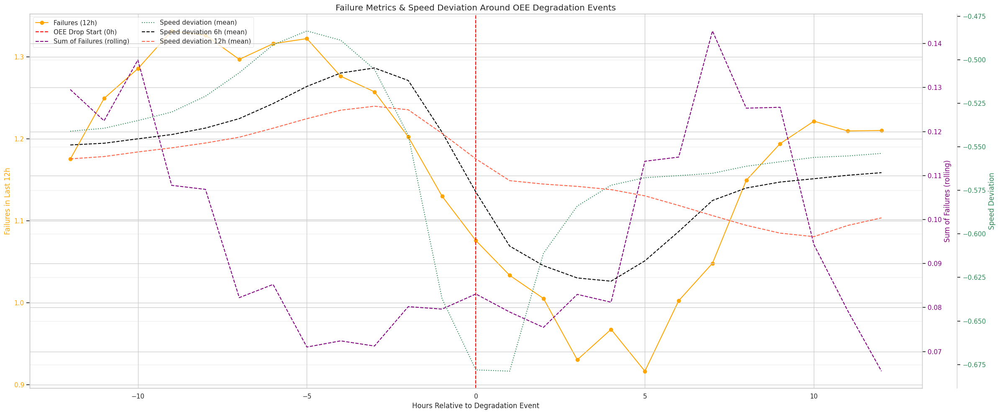

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Prep
df = df.copy()
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True, errors='coerce')
df = df.sort_values('timestamp').reset_index(drop=True)

# --- 1) OEE degradation onset (tweak threshold unit if needed)
threshold = -10   # use -0.10 if your oee_drop_pre_6 is a FRACTION
df['oee_degradation_event'] = (df['oee_drop_pre_6'] < threshold).astype(int)

# --- 2) Event timestamps
degradation_events = df.loc[df['oee_degradation_event'] == 1, ['timestamp']].copy()

if degradation_events.empty:
    print("No OEE degradation events found with the current threshold.")
else:
    # --- 3) ±12h windows around each event
    time_window = pd.Timedelta(hours=12)
    context_rows = []

    for ts in degradation_events['timestamp']:
        mask = (df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)
        window = df.loc[mask].copy()
        window['event_center'] = ts
        # integer hour bins
        window['hour_offset'] = np.floor((window['timestamp'] - ts).dt.total_seconds() / 3600).astype(int)
        context_rows.append(window)

    # --- 4) Combine windows
    df_degradation_windows = pd.concat(context_rows, ignore_index=True)

    # --- 5) Aggregate per hour offset
    agg_df = (
        df_degradation_windows
        .groupby('hour_offset', as_index=False)
        .agg({
            'failures_last_12h': 'mean',
            'Sum_Failure': 'mean',
            'speed_deviation': 'mean',
            'speed_deviation_last_6h': 'mean',
            'speed_deviation_last_12h': 'mean',
            # optional: count for confidence about coverage
            # 'timestamp': 'count'
        })
        .sort_values('hour_offset')
    )

    # --- 6) Smooth curves (window=3, centered)
    agg_df['Sum_Failure_rolling']  = agg_df['Sum_Failure'].rolling(window=3, center=True, min_periods=1).mean()
    agg_df['speed_dev_smooth']     = agg_df['speed_deviation'].rolling(window=3, center=True, min_periods=1).mean()
    agg_df['speed_dev_6_smooth']   = agg_df['speed_deviation_last_6h'].rolling(window=3, center=True, min_periods=1).mean()
    agg_df['speed_dev_12_smooth']  = agg_df['speed_deviation_last_12h'].rolling(window=3, center=True, min_periods=1).mean()

    # --- 7) Plot
    fig, ax1 = plt.subplots(figsize=(24, 10))

    # Left axis: Failures (12h)
    ax1.plot(agg_df['hour_offset'], agg_df['failures_last_12h'],
             marker='o', color='orange', label='Failures (12h)')
    ax1.axvline(x=0, color='red', linestyle='--', label='OEE Drop Start (0h)')
    ax1.set_xlabel("Hours Relative to Degradation Event")
    ax1.set_ylabel("Failures in Last 12h", color='orange')
    ax1.tick_params(axis='y', labelcolor='orange')

    # Right axis: Sum of failures (rolling)
    ax2 = ax1.twinx()
    ax2.plot(agg_df['hour_offset'], agg_df['Sum_Failure_rolling'],
             linestyle='--', color='purple', label='Sum of Failures (rolling)')
    ax2.set_ylabel("Sum of Failures (rolling)", color='purple')
    ax2.tick_params(axis='y', labelcolor='purple')

    # Third axis: Speed deviations
    ax3 = ax1.twinx()
    ax3.spines['right'].set_position(('outward', 60))
    ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_smooth'],
             linestyle=':', label='Speed deviation (mean)', color='seagreen')
    ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_6_smooth'],
             linestyle='--', label='Speed deviation 6h (mean)', color='black')
    ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_12_smooth'],
             linestyle='--', label='Speed deviation 12h (mean)', color='tomato')
    ax3.set_ylabel("Speed Deviation", color='seagreen')
    ax3.tick_params(axis='y', labelcolor='seagreen')

    # Legend: combine all axes
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    lines3, labels3 = ax3.get_legend_handles_labels()
    ax1.legend(lines1 + lines2 + lines3, labels1 + labels2 + labels3,
               loc='upper left', ncol=2)

    plt.title("Failure Metrics & Speed Deviation Around OEE Degradation Events")
    plt.grid(True, axis='both', alpha=0.3)
    plt.tight_layout()
    plt.show()


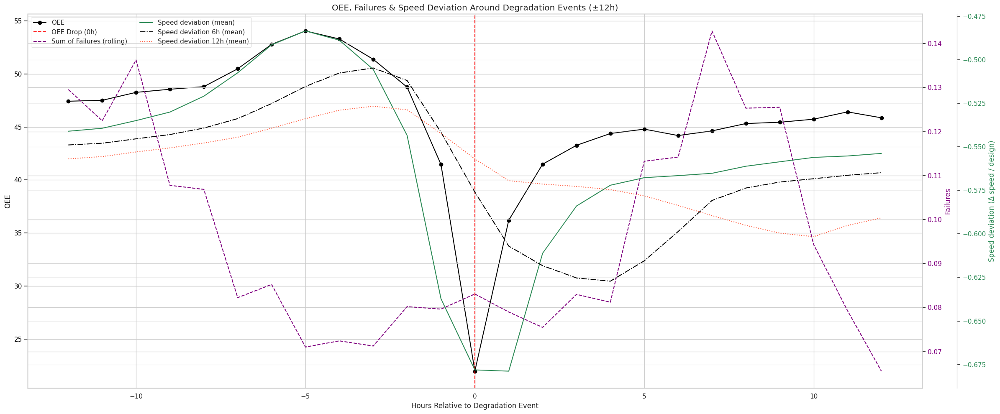

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Prep + ensure needed features exist ---
df = df.copy()
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True, errors='coerce')
df = df.sort_values('timestamp').reset_index(drop=True)

# Base speed_deviation if missing
if 'speed_deviation' not in df.columns and {'avgprocessspeed','designspeed'} <= set(df.columns):
    df['speed_deviation'] = (df['avgprocessspeed'] - df['designspeed']) / df['designspeed']

# Rolling 6h/12h if missing (no machine column → roll across whole series)
if 'speed_deviation_last_6h' not in df.columns or 'speed_deviation_last_12h' not in df.columns:
    t = df.set_index('timestamp')
    if 'speed_deviation_last_6h' not in t.columns:
        t['speed_deviation_last_6h'] = t['speed_deviation'].rolling('6h',  min_periods=1).mean()
    if 'speed_deviation_last_12h' not in t.columns:
        t['speed_deviation_last_12h'] = t['speed_deviation'].rolling('12h', min_periods=1).mean()
    df = t.reset_index()

# --- Step 1: Define OEE degradation onset (adjust threshold units if needed)
df['oee_degradation_event'] = (df['oee_drop_pre_6'] < -10).astype(int)  # use -0.10 if oee_drop_pre_6 is fractional

# --- Step 2: Identify timestamps of degradation onsets
degradation_events = df[df['oee_degradation_event'] == 1].copy()

# --- Step 3: Build ±12h windows around each degradation event
time_window = pd.Timedelta(hours=12)
context_rows = []
for _, row in degradation_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = np.floor((window['timestamp'] - ts).dt.total_seconds() / 3600).astype(int)
    context_rows.append(window)

if not context_rows:
    print("No degradation events found for the current threshold/window.")
else:
    # --- Step 4: Combine all windows
    df_degradation_windows = pd.concat(context_rows, ignore_index=True)

    # --- Step 5: Compute average metrics per hour offset (add speed deviation features)
    agg_df = (
        df_degradation_windows
        .groupby('hour_offset', as_index=False)
        .agg({
            'oee': 'mean',
            'Sum_Failure': 'mean',
            'speed_deviation': 'mean',
            'speed_deviation_last_6h': 'mean',
            'speed_deviation_last_12h': 'mean',
        })
        .sort_values('hour_offset')
    )

    # Optional: Smooth
    agg_df['Sum_Failure_rolling']   = agg_df['Sum_Failure'].rolling(window=3, center=True, min_periods=1).mean()
    agg_df['speed_dev_smooth']      = agg_df['speed_deviation'].rolling(window=3, center=True, min_periods=1).mean()
    agg_df['speed_dev_6_smooth']    = agg_df['speed_deviation_last_6h'].rolling(window=3, center=True, min_periods=1).mean()
    agg_df['speed_dev_12_smooth']   = agg_df['speed_deviation_last_12h'].rolling(window=3, center=True, min_periods=1).mean()

    # --- Step 6: Plot
    fig, ax1 = plt.subplots(figsize=(24, 10))

    # Left Y-axis: OEE
    ax1.plot(agg_df['hour_offset'], agg_df['oee'], marker='o', color='black', label='OEE')
    ax1.axvline(x=0, color='red', linestyle='--', label='OEE Drop (0h)')
    ax1.set_ylabel("OEE", color='black')
    ax1.tick_params(axis='y', labelcolor='black')
    ax1.set_xlabel("Hours Relative to Degradation Event")

    # Right Y-axis: Sum of Failures (rolling)
    ax2 = ax1.twinx()
    ax2.plot(agg_df['hour_offset'], agg_df['Sum_Failure_rolling'], linestyle='--', color='purple',
             label='Sum of Failures (rolling)')
    ax2.set_ylabel("Failures", color='purple')
    ax2.tick_params(axis='y', labelcolor='purple')

    # Third Y-axis: Speed deviations
    ax3 = ax1.twinx()
    ax3.spines['right'].set_position(('outward', 60))
    ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_smooth'],
             label='Speed deviation (mean)', color='seagreen')
    ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_6_smooth'],
             label='Speed deviation 6h (mean)', color='black', linestyle='-.')
    ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_12_smooth'],
             label='Speed deviation 12h (mean)', color='tomato', linestyle=':')
    ax3.set_ylabel("Speed deviation (Δ speed / design)", color='seagreen')
    ax3.tick_params(axis='y', labelcolor='seagreen')

    # Combine legends
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    lines3, labels3 = ax3.get_legend_handles_labels()
    ax1.legend(lines1 + lines2 + lines3, labels1 + labels2 + labels3, loc='upper left', ncol=2)

    plt.title("OEE, Failures & Speed Deviation Around Degradation Events (±12h)")
    plt.grid(True, axis='both', alpha=0.3)
    plt.tight_layout()
    plt.show()


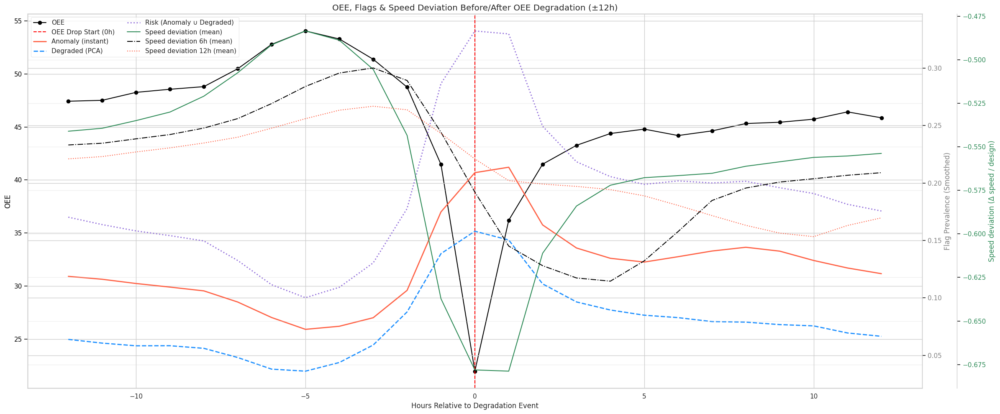

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Prep & flags
df = df.copy()
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp').reset_index(drop=True)

# Instant flags
df['is_anomaly']  = df['is_anomaly'].astype(int)
df['is_degraded'] = (df['pca_cluster_label'].astype(str) == 'Degraded').astype(int)
df['risk_flag']   = ((df['is_anomaly'] == 1) | (df['is_degraded'] == 1)).astype(int)

# --- Ensure speed deviation features exist (added)
if 'speed_deviation' not in df.columns and {'avgprocessspeed','designspeed'} <= set(df.columns):
    df['speed_deviation'] = (df['avgprocessspeed'] - df['designspeed']) / df['designspeed']

if 'speed_deviation_last_6h' not in df.columns or 'speed_deviation_last_12h' not in df.columns:
    t = df.set_index('timestamp')
    if 'speed_deviation_last_6h' not in t.columns:
        t['speed_deviation_last_6h'] = t['speed_deviation'].rolling('6h', min_periods=1).mean()
    if 'speed_deviation_last_12h' not in t.columns:
        t['speed_deviation_last_12h'] = t['speed_deviation'].rolling('12h', min_periods=1).mean()
    df = t.reset_index()

# --- 1) Define OEE degradation events (adjust threshold if needed)
df['oee_degradation_event'] = (df['oee_drop_pre_6'] < -10).astype(int)  # use -0.10 if it's a fraction

# --- 2) Extract event timestamps
degradation_events = df[df['oee_degradation_event'] == 1].copy()
if degradation_events.empty:
    raise ValueError("No degradation events found with the current threshold.")

# --- 3) Build ±12h windows around each event
time_window = pd.Timedelta(hours=12)
context_rows = []
for _, row in degradation_events.iterrows():
    ts = row['timestamp']
    window = df[(df['timestamp'] >= ts - time_window) & (df['timestamp'] <= ts + time_window)].copy()
    window['event_center'] = ts
    window['hour_offset'] = np.floor((window['timestamp'] - ts).dt.total_seconds() / 3600).astype(int)
    context_rows.append(window)

df_degradation_windows = pd.concat(context_rows, ignore_index=True)

# --- 4) Aggregate by hour offset (add the 3 speed-deviation features)
agg_df = (
    df_degradation_windows
    .groupby('hour_offset', as_index=False)
    .agg({
        'oee': 'mean',
        'is_anomaly': 'mean',
        'is_degraded': 'mean',
        'risk_flag': 'mean',
        'speed_deviation': 'mean',            # ADDED
        'speed_deviation_last_6h': 'mean',    # ADDED
        'speed_deviation_last_12h': 'mean',   # ADDED
    })
    .sort_values('hour_offset')
)

# Optional smoothing for readability
for col in ['is_anomaly', 'is_degraded', 'risk_flag']:
    agg_df[col + '_smooth'] = agg_df[col].rolling(window=3, center=True, min_periods=1).mean()

# Smooth the speed deviation curves (ADDED)
agg_df['speed_dev_smooth']    = agg_df['speed_deviation'].rolling(3, center=True, min_periods=1).mean()
agg_df['speed_dev_6_smooth']  = agg_df['speed_deviation_last_6h'].rolling(3, center=True, min_periods=1).mean()
agg_df['speed_dev_12_smooth'] = agg_df['speed_deviation_last_12h'].rolling(3, center=True, min_periods=1).mean()

# --- 5) Plot
fig, ax1 = plt.subplots(figsize=(24, 10))

# OEE (primary axis)
ax1.plot(agg_df['hour_offset'], agg_df['oee'], marker='o', color='black', label='OEE')
ax1.axvline(x=0, color='red', linestyle='--', label='OEE Drop Start (0h)')
ax1.set_xlabel("Hours Relative to Degradation Event")
ax1.set_ylabel("OEE", color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Flags prevalence (secondary axis, smoothed curves)
ax2 = ax1.twinx()
ax2.plot(agg_df['hour_offset'], agg_df['is_anomaly_smooth'],  label='Anomaly (instant)',  linewidth=2, color='tomato')
ax2.plot(agg_df['hour_offset'], agg_df['is_degraded_smooth'], label='Degraded (PCA)',     linestyle='--', linewidth=2, color='dodgerblue')
ax2.plot(agg_df['hour_offset'], agg_df['risk_flag_smooth'],   label='Risk (Anomaly ∪ Degraded)', linestyle=':', linewidth=2, color='mediumpurple')
ax2.set_ylabel("Flag Prevalence (Smoothed)", color='gray')
ax2.tick_params(axis='y', labelcolor='gray')

# Third axis for speed deviation curves (ADDED)
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))
ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_smooth'],    label='Speed deviation (mean)',        color='seagreen')
ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_6_smooth'],  label='Speed deviation 6h (mean)',     color='black', linestyle='-.')
ax3.plot(agg_df['hour_offset'], agg_df['speed_dev_12_smooth'], label='Speed deviation 12h (mean)',    color='tomato', linestyle=':')
ax3.set_ylabel("Speed deviation (Δ speed / design)", color='seagreen')
ax3.tick_params(axis='y', labelcolor='seagreen')

# Legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines3, labels3 = ax3.get_legend_handles_labels()
ax1.legend(lines1 + lines2 + lines3, labels1 + labels2 + labels3, loc='upper left', ncol=2)

plt.title("OEE, Flags & Speed Deviation Before/After OEE Degradation (±12h)")
plt.grid(True, axis='both', alpha=0.3)
plt.tight_layout()
plt.show()


##### Statistical Test

In [ ]:
# Define "pre-event" window: -3h to 0h
pre_window = df_degradation_windows[df_degradation_windows['hour_offset'].between(-3, 0)]

# Define control group: timestamps far from degradation events
buffer = pd.Timedelta(hours=6)
df['is_near_degradation'] = df['timestamp'].apply(
    lambda ts: any((ts >= t - buffer) & (ts <= t + buffer) for t in degradation_events['timestamp'])
)
control_set = df[~df['is_near_degradation']]

# T-tests
for var in ['speed_deviation_last_6h', 'speed_deviation_last_12h', 'risk_flag_last_12h', 'risk_flag_last_6h', 'degraded_last_6h', 'anomaly_last_6h', 'degraded_last_12h', 'anomaly_last_12h', 'failures_last_6h', 'failures_last_12h', 'failure_cycle_start_368_last_6h', 'failure_cycle_start_368_last_12h','failure_streak_duration','count_active_cycles']:
    group1 = pre_window[var].dropna()
    group2 = control_set[var].dropna()
    t, p = ttest_ind(group1, group2, equal_var=False)
    print(f"\n--- {var} ---")
    print(f"Pre-Event Mean: {group1.mean():.2f} | Control Mean: {group2.mean():.2f}")
    print(f"T-test: t = {t:.2f}, p = {p:.4f} → {'Significant' if p < 0.05 else 'Not Significant'}")


--- speed_deviation_last_6h ---
Pre-Event Mean: -0.53 | Control Mean: -0.69
T-test: t = 8.69, p = 0.0000 → Significant

--- speed_deviation_last_12h ---
Pre-Event Mean: -0.54 | Control Mean: -0.75
T-test: t = 14.01, p = 0.0000 → Significant

--- risk_flag_last_12h ---
Pre-Event Mean: 0.70 | Control Mean: 0.95
T-test: t = -13.98, p = 0.0000 → Significant

--- risk_flag_last_6h ---
Pre-Event Mean: 0.45 | Control Mean: 0.74
T-test: t = -8.32, p = 0.0000 → Significant

--- degraded_last_6h ---
Pre-Event Mean: 0.21 | Control Mean: 0.53
T-test: t = -8.20, p = 0.0000 → Significant

--- anomaly_last_6h ---
Pre-Event Mean: 0.34 | Control Mean: 0.46
T-test: t = -3.02, p = 0.0030 → Significant

--- degraded_last_12h ---
Pre-Event Mean: 0.38 | Control Mean: 0.76
T-test: t = -11.34, p = 0.0000 → Significant

--- anomaly_last_12h ---
Pre-Event Mean: 0.58 | Control Mean: 0.71
T-test: t = -3.80, p = 0.0002 → Significant

--- failures_last_6h ---
Pre-Event Mean: 0.46 | Control Mean: 0.34
T-test: t = 1